## 数据探索性分析与数据预处理
### 数据可视化和摘要
- 数据摘要  
    标称属性，给出每个可能取值的频数  
    数值属性，给出5数概括及缺失值的个数  
- 数据可视化  
    使用直方图、盒图等检查数据分布及离群点  
### 数据缺失的处理  
观察数据集中缺失数据，分析其缺失的原因。分别使用下列四种策略对缺失值进行处理:  
- 将缺失部分剔除
- 用最高频率值来填补缺失值
- 通过属性的相关关系来填补缺失值
- 通过数据对象之间的相似性来填补缺失值  
注意：在处理后，要可视化地对比新旧数据集。

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import seaborn as sns

### 数据预处理：
- 标称属性，给出每个可能取值的频数  
- 数值属性，给出5数概括及缺失值的个数  

In [3]:
# 显示数据集的列信息，判断标称属性/数值属性
def columns_info(df):
    print(df.info())

In [4]:
# 给出每个标称属性可能取值的频数 
def nominal_display(df, df_new = None, nominal_attr = None, nums=40):
    # 绘制直方图
    def bar_display(data, data_new=None, nums=40):
        if data_new is not None:
            plt.figure(figsize=(20, 8))
            plt.title(data.name, fontsize=24)
            plt.bar(data.index[:nums], data.values[:nums],
                    color='red', label=data.name)
            plt.bar(data_new.index[:nums], data_new.values[:nums],
                    color='blue', label='New_'+data_new.name)
            plt.xticks(rotation=90)
            plt.legend()
            plt.show()
        else: 
            plt.figure(figsize=(20, 8))
            plt.title(data.name, fontsize=24)
            plt.bar(data.index[:nums], data.values[:nums],
                    color='red')
            plt.xticks(rotation=90)
            plt.show()

    frequency = {key: df[key].value_counts() for key in df.columns}
    if df_new is not None:
        new_frequency = {key: df_new[key].value_counts()
                         for key in df_new.columns}
    # df_new非空则对比新旧数据集
    if df_new is not None:
        for key in nominal_attr:
            bar_display(data = frequency[key],data_new = new_frequency[key],nums = nums)
    else:
        for key in nominal_attr:
            bar_display(data = frequency[key],data_new = None,nums = nums)
            
    return None

In [5]:
# 数值属性，给出5数概括及缺失值的个数  
def numerical_display(df,df_new = None,numerical_attr = None):
    #数据集总数
    def numerical_display(data,data_new=None):
        print('%s:'%data.name)
        print("Min: {:.4f}  Q1(25%): {:.4f}  Median: {:.4f}  Q3(75%): {:.4f}  Max: {:.4f}".format(
            data.min(),data.quantile(0.25),data.median(),data.quantile(0.75),data.max()))
        print("Missing_counts: {:d}".format(int(data.shape[0] - data.count())))
        
        if data_new is not None:
            print('%s_new:'%data.name)
            print("Min: {:.4f}  Q1: {:.4f}  Median: {:.4f}  Q3: {:.4f}  Max: {:.4f}".format(
            data_new.min(),data_new.quantile(0.25),data_new.median(),data_new.quantile(0.75),data_new.max()))
        print()
            
        
    if numerical_attr is None:
        print("numerical_attr is none!")
        return None
    
    # 获取5数概况以及缺失值个数
    if df_new is None:
        for key in numerical_attr:
            numerical_display(df[key])
    else:
        for key in numerical_attr:
            numerical_display(df[key],df_new[key])
    
    return None

### 数据可视化:
- 盒图
- 直方图
- 散点图

In [6]:
# 绘制盒图
def box_plot(df,label=None,df_new=None):
    if df_new is None:
        plt.figure(figsize=(9,6))
        plt.title('Box plot')
        sns.boxplot(data=df,y=label,palette='Set1')
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Box plot')
        sns.boxplot(data=df,y=label,palette='Set1')

        plt.subplot(122)
        plt.title('New Box plot')
        sns.boxplot(data=df_new,y=label,palette='Set2')

In [7]:
# 绘制直方图
def hist_plot(df,df_new=None,label=None,bin_nums=10):
    if df_new is None:
        plt.figure(figsize=(9,6))
        plt.title('Histogram')
        sns.histplot(data=df[label].dropna(),bins=bin_nums)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Histogram')
        sns.histplot(data=df[label].dropna(),bins=bin_nums)

        plt.subplot(122)
        plt.title('New Histogram')
        sns.histplot(data=df_new[label].dropna(),bins=bin_nums)

In [8]:
# 绘制散点图
def scatter_plot(df,df_new=None,xlabel=None,ylabel=None):
    if df_new is None:
        plt.figure(figsize=(9,6))
        plt.title('Scatter plot')
        sns.scatterplot(data=df,x=xlabel,y=ylabel)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Scatter plot')
        sns.scatterplot(data=df,x=xlabel,y=ylabel)

        plt.subplot(122)
        plt.title('New Scatter plot')
        sns.scatterplot(data=df_new,x=xlabel,y=ylabel)

### 缺失值的处理
#### 1.将缺失部分剔除：

In [9]:
def drop_Nan(df):
    #该行有空值就剔除
    df_new = df.copy(deep=True)
    return df_new.dropna(axis=0)

### 2.用最高频率值来填补缺失值：

In [10]:
def fill_mode_for_Nan(df):
    df_new = df.copy(deep=True)
    for key in df_new.columns:
        df_new[key].fillna(df_new[key].mode()[0],inplace=True)
    return df_new

### 3.通过属性的相关关系来填补缺失：

In [11]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestRegressor
def fill_attr_corr(df,miss_attr,complete_attr):
  def set_miss_values(df, complete_attr):
    enc_label = OrdinalEncoder()
    enc_fea = OrdinalEncoder()
    missing_index = complete_attr[0]
    
    # 获取数据，并划分known和unknown的集合
    train_df = df[complete_attr]
    known_values = np.array(train_df[train_df[missing_index].notnull()])
    unknow_values = np.array(train_df[train_df[missing_index].isnull()])
    
    # X_train 
    X_train = known_values[:, 1:]
    X_test = unknow_values[:, 1:]
    X_all = np.row_stack((X_train,X_test))
    enc_fea.fit(X_all)
    X_train= enc_fea.transform(X_train)
    
    # Y_train
    Y_train= known_values[:, 0].reshape(-1, 1)
    enc_label.fit(Y_train)
    Y_train = enc_label.transform(Y_train)
    
    # model训练
    model = RandomForestRegressor(random_state=0, n_estimators=2000, n_jobs=-1)
    model.fit(X_train, Y_train.ravel())
    # predict
    predicted_values = model.predict(enc_fea.transform(unknow_values[:, 1:]))
    predicted_values = enc_label.inverse_transform(predicted_values.reshape(-1, 1))
    # 填充
    df.loc[ (df[missing_index].isnull()), missing_index] = predicted_values
    return df
  
  df_new = df.copy(deep=True)
  for i in range(0,len(miss_attr)):
    complete_attr.insert(0,miss_attr[i])
    df_new = set_miss_values(df_new,complete_attr)
  return df_new

### 4.通过数据对象之间的相似性来填补缺失值：

In [12]:
from sklearn.impute import KNNImputer 
#通过knn填补缺失值
def correlation_fill(df,numerical_attr,n_neighbors = 20):
    cpdf = df.copy(deep=True)
    imputer = KNNImputer(n_neighbors=n_neighbors) 
    imputed = imputer.fit_transform(cpdf[numerical_attr]) 
    df_imputed = pd.DataFrame(imputed, columns=numerical_attr) 
    cpdf[numerical_attr] = df_imputed
    
    return cpdf

### 数据集1: Wine Reviews:
- winemag-data-130k-v2.csv contains 10 columns and 130k rows of wine reviews.
- winemag-data_first150k.csv contains 10 columns and 150k rows of wine reviews.  
#### winemag-data-130k-v2.csv:

In [53]:
data_frame1 = pd.read_csv("Wine Reviews/winemag-data-130k-v2.csv")
# 展示列属性
columns_info(df=data_frame1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             129971 non-null  int64  
 1   country                129908 non-null  object 
 2   description            129971 non-null  object 
 3   designation            92506 non-null   object 
 4   points                 129971 non-null  int64  
 5   price                  120975 non-null  float64
 6   province               129908 non-null  object 
 7   region_1               108724 non-null  object 
 8   region_2               50511 non-null   object 
 9   taster_name            103727 non-null  object 
 10  taster_twitter_handle  98758 non-null   object 
 11  title                  129971 non-null  object 
 12  variety                129970 non-null  object 
 13  winery                 129971 non-null  object 
dtypes: float64(1), int64(2), object(11)


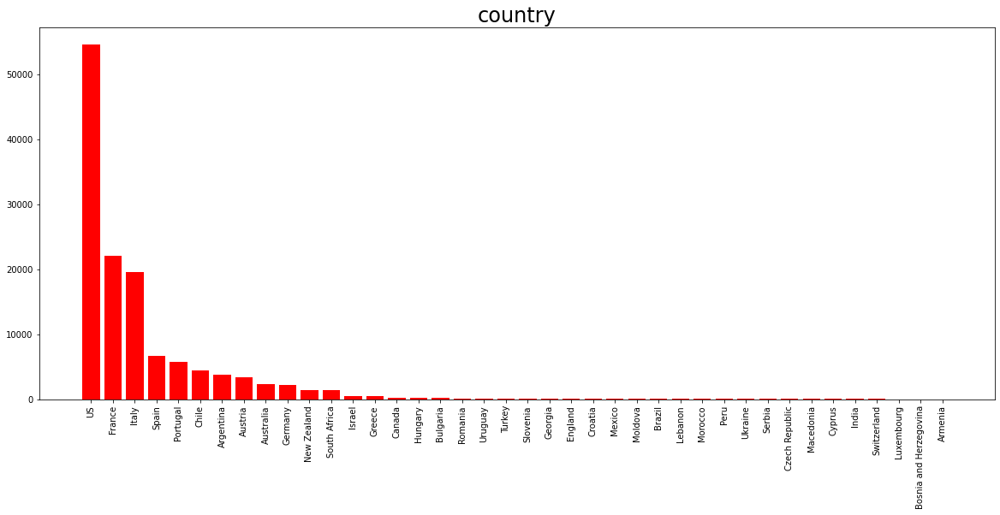

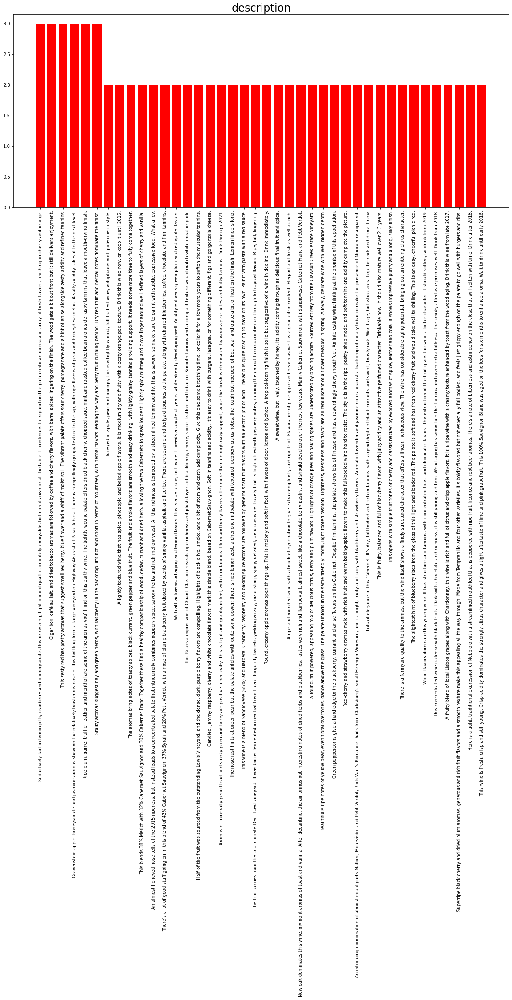

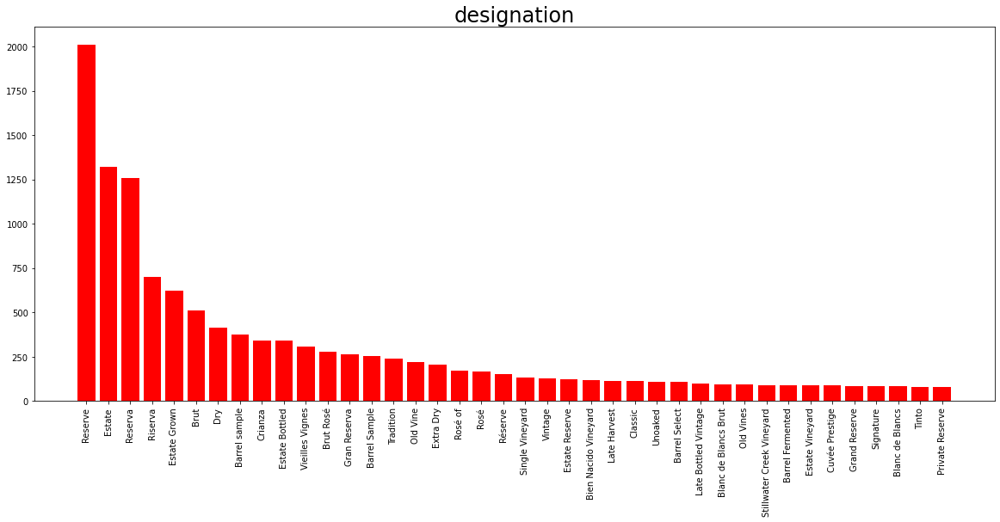

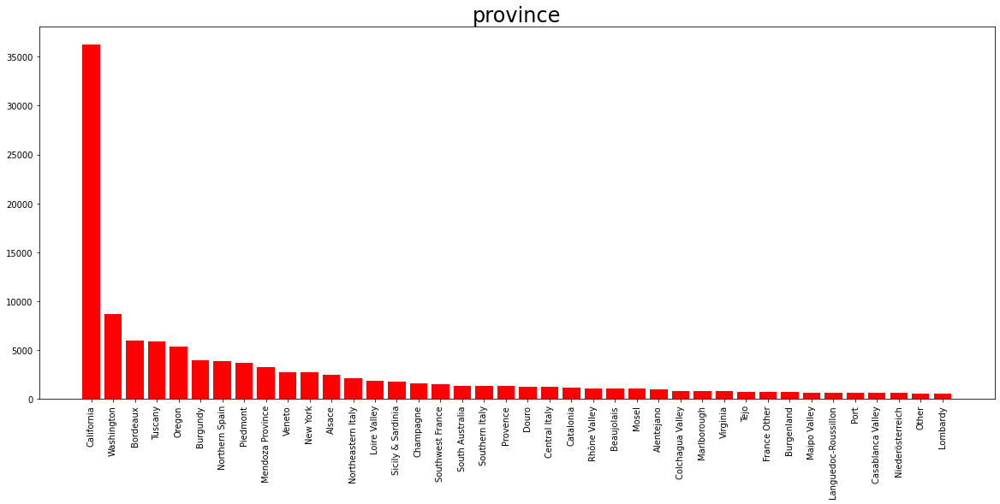

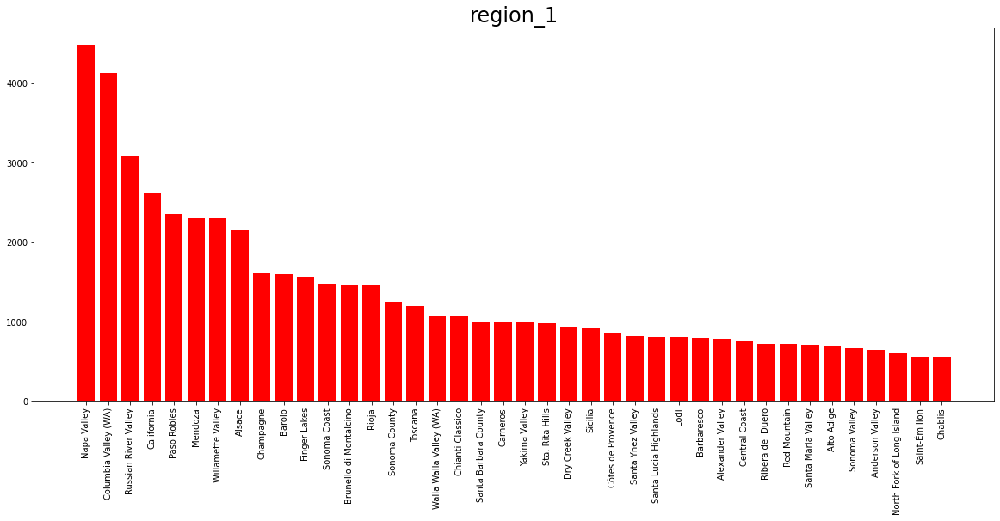

...

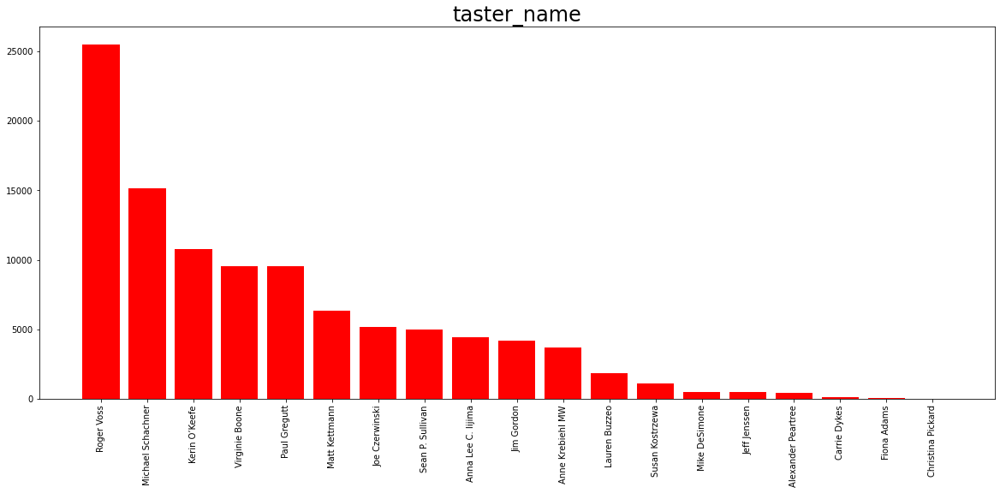

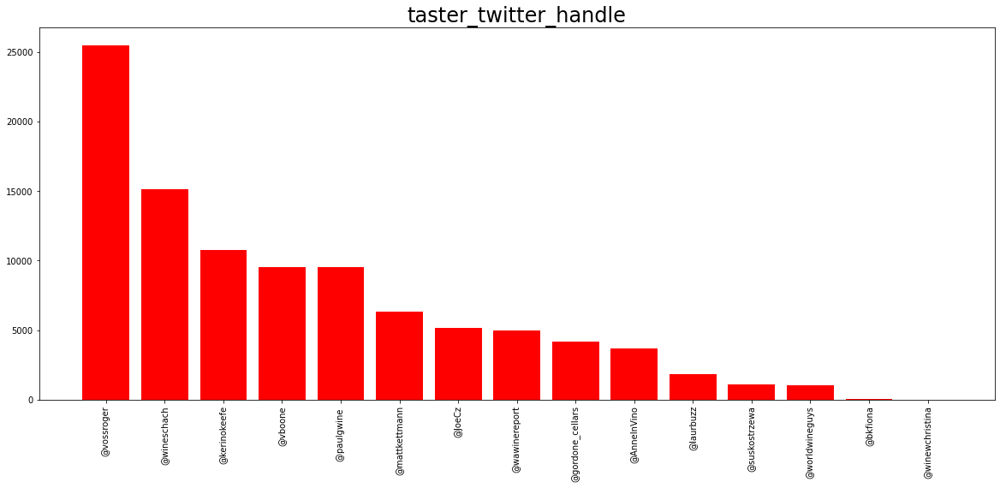

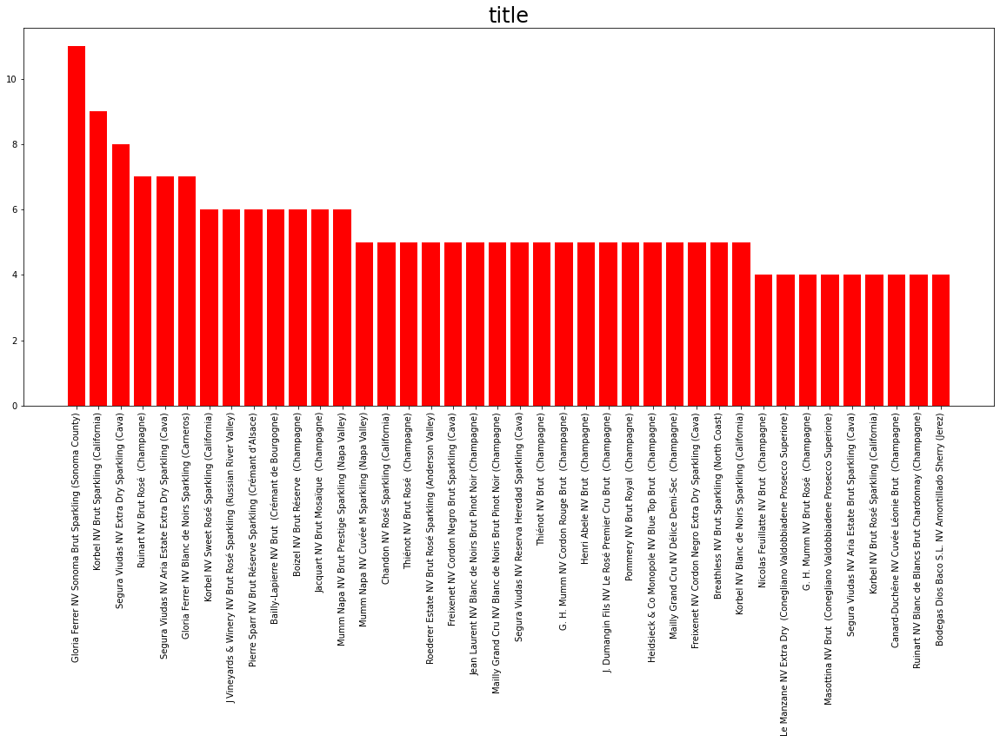

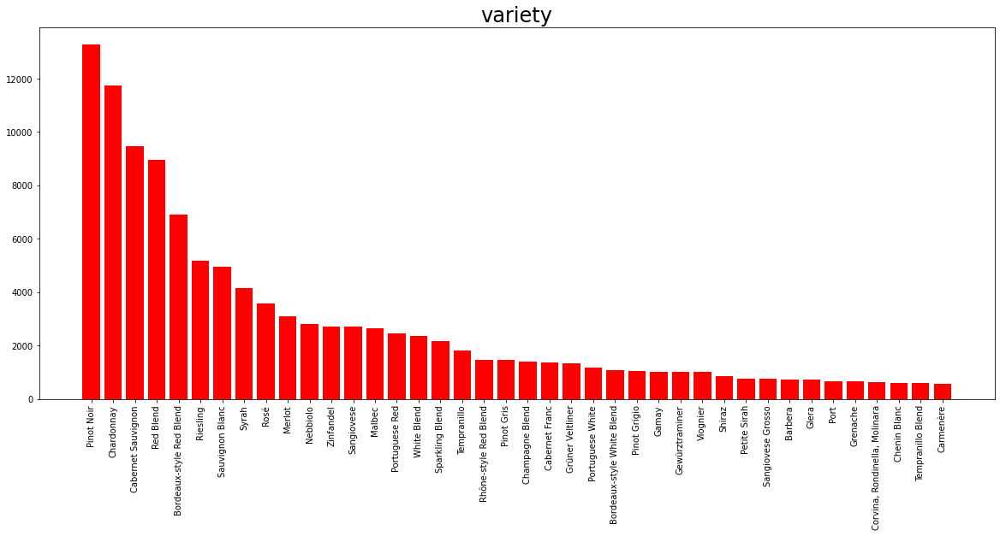

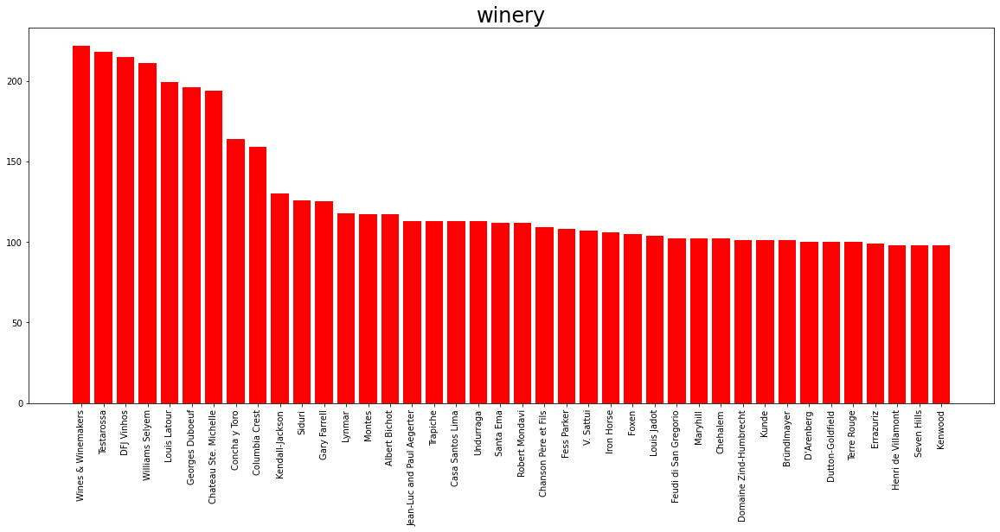

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 91.0000  Max: 100.0000
Missing_counts: 0

price:
Min: 4.0000  Q1(25%): 17.0000  Median: 25.0000  Q3(75%): 42.0000  Max: 3300.0000
Missing_counts: 8996



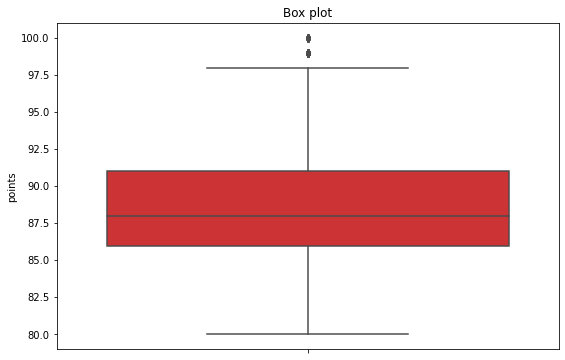

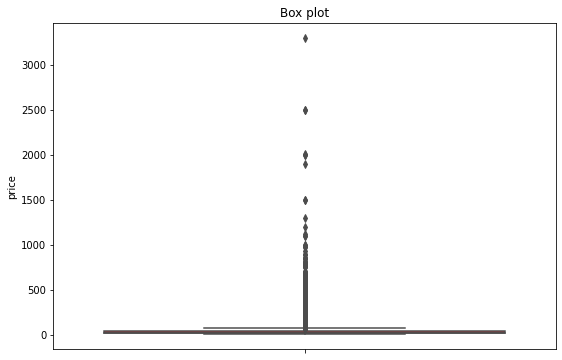

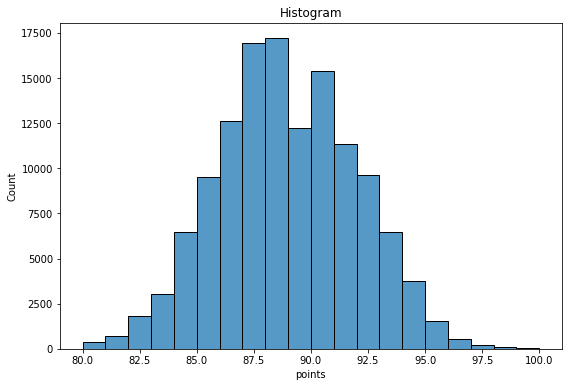

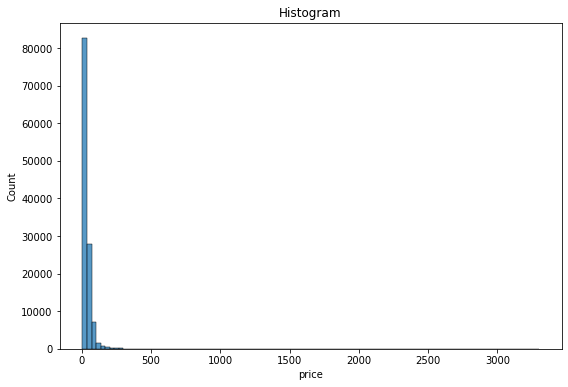

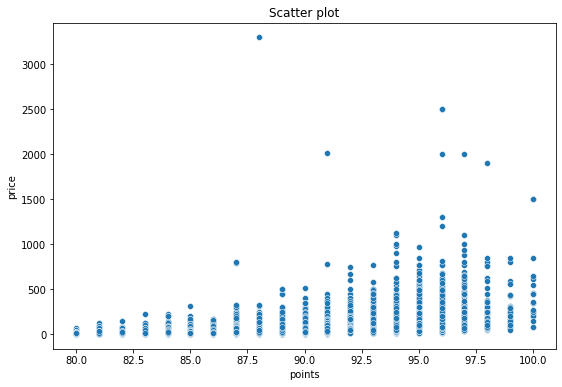

In [54]:
# Nominal attribute
nominal_attr = ['country','description', 'designation', 'province', 'region_1', 'region_2', 
                 'taster_name','taster_twitter_handle','title',
                 'variety', 'winery']
# Numerical attribute
numerical_attr = ['points', 'price']

nominal_display(df=data_frame1,df_new=None,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame1,df_new=None,numerical_attr=numerical_attr)
box_plot(df=data_frame1,label='points',df_new=None)
box_plot(df=data_frame1,label='price',df_new=None)
hist_plot(df=data_frame1,df_new=None,label = 'points',bin_nums=20)
hist_plot(df=data_frame1,df_new=None,label = 'price',bin_nums=100)
scatter_plot(df=data_frame1,df_new=None,xlabel='points',ylabel='price')

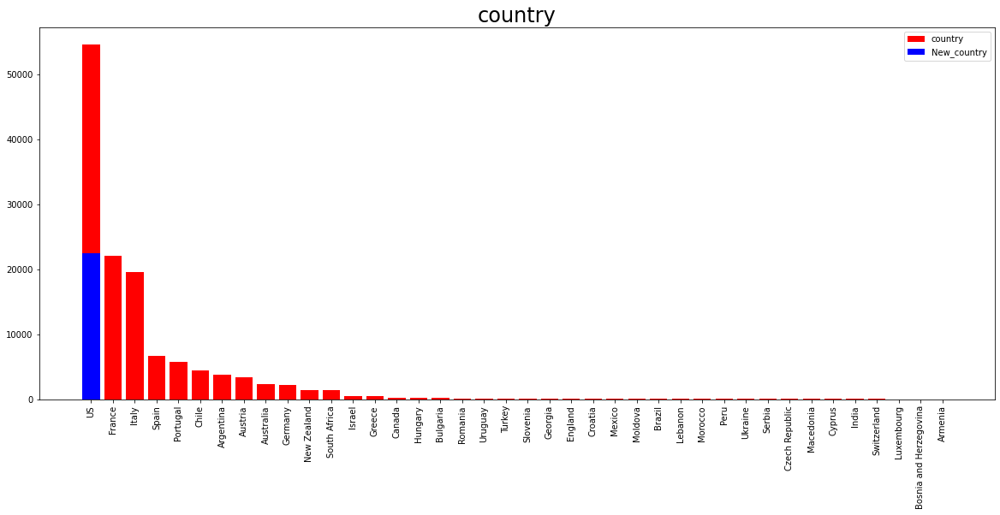

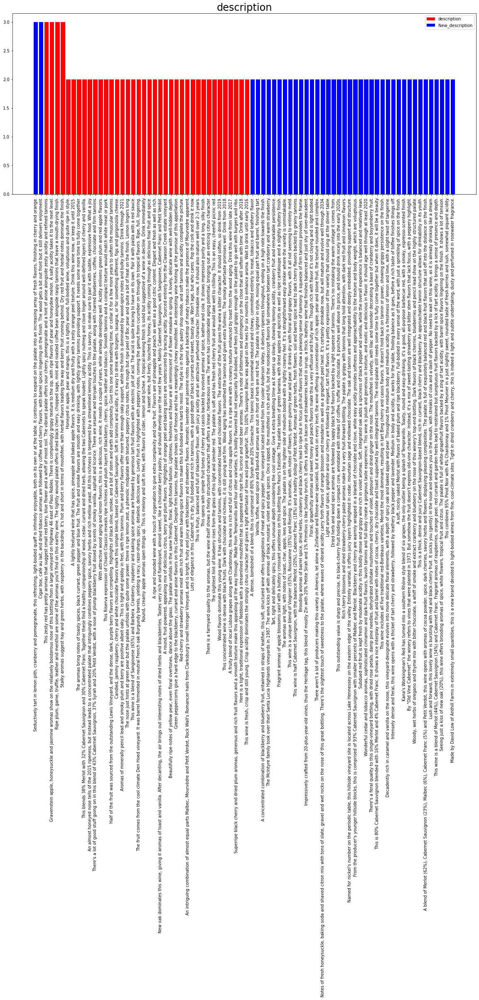

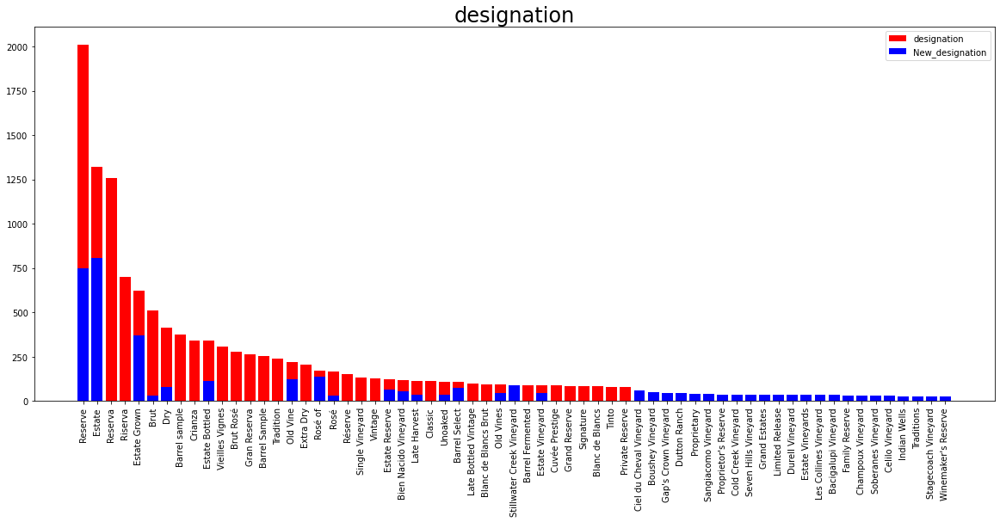

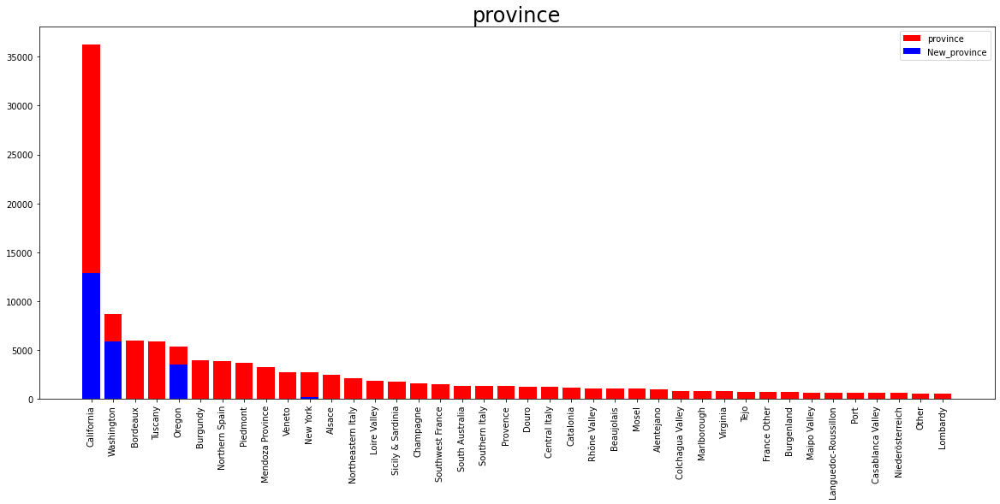

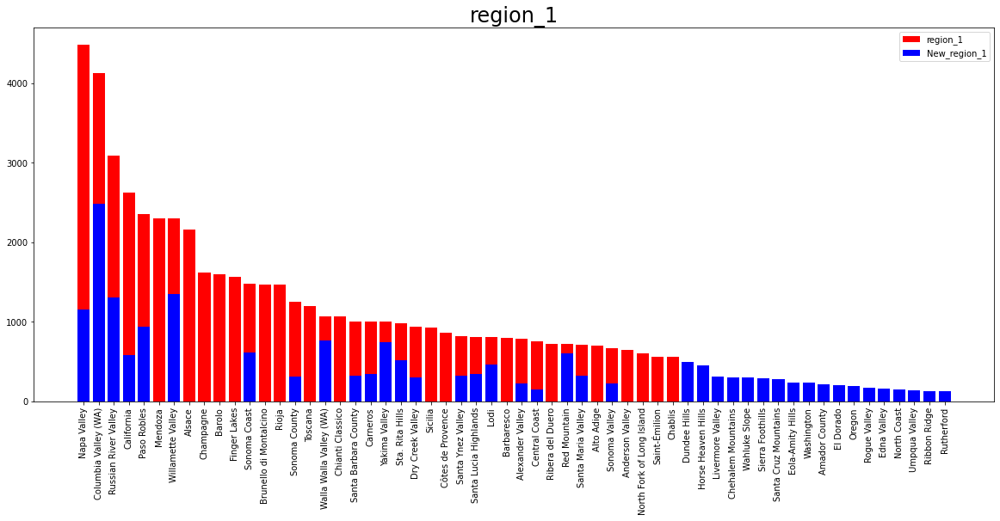

...

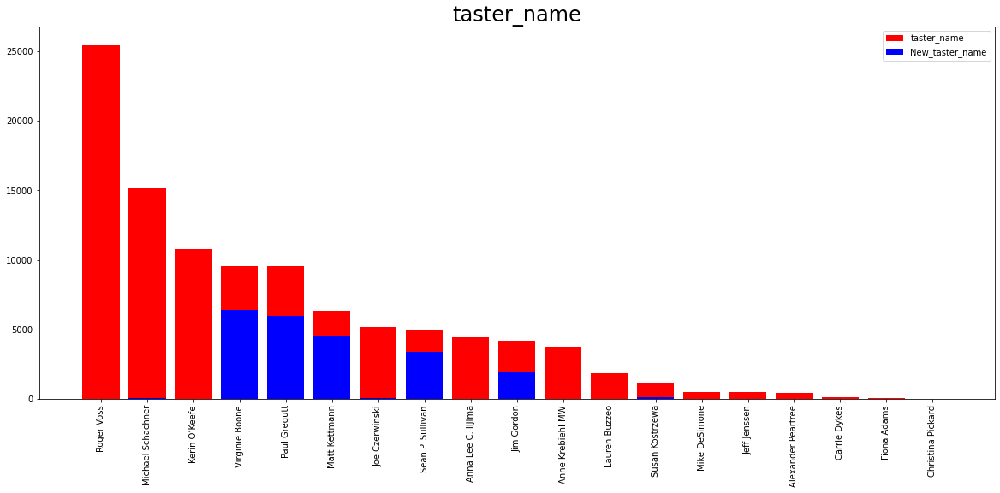

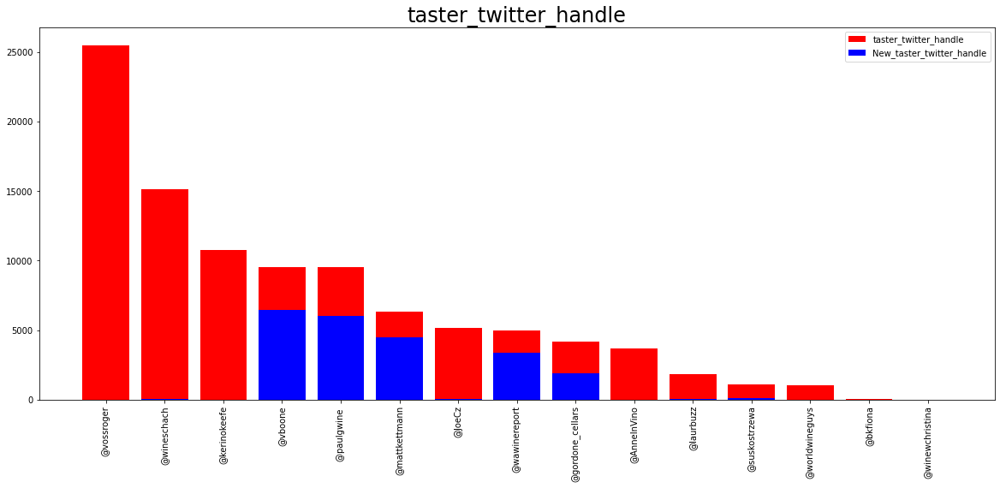

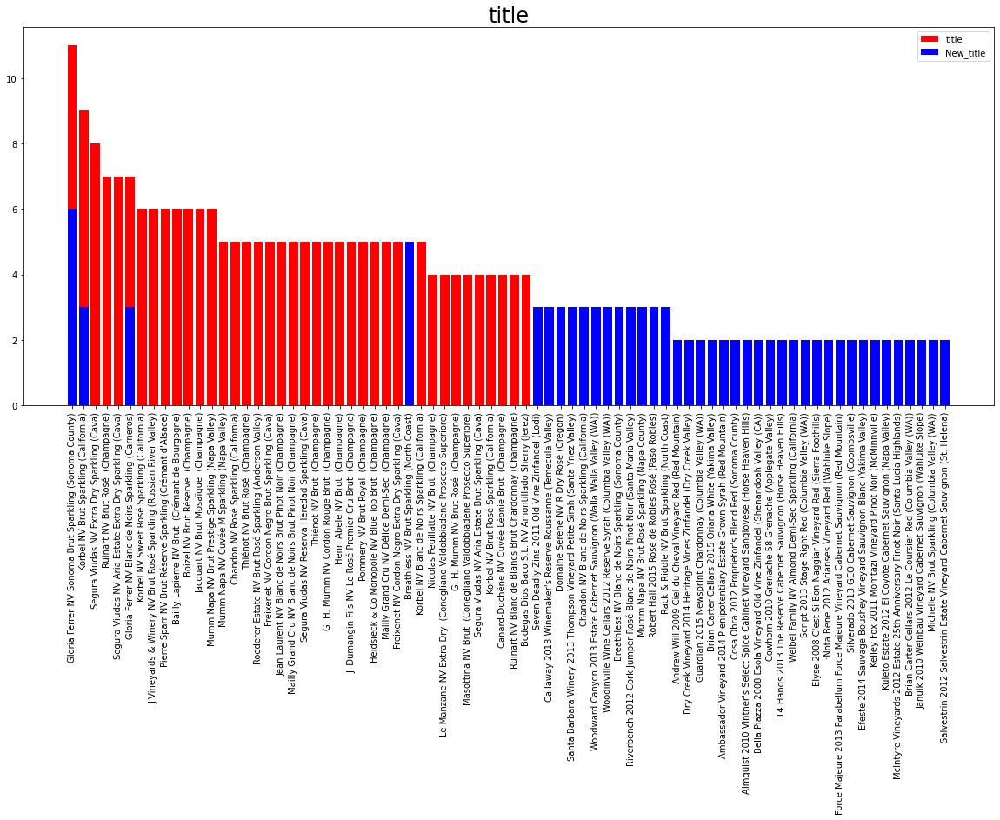

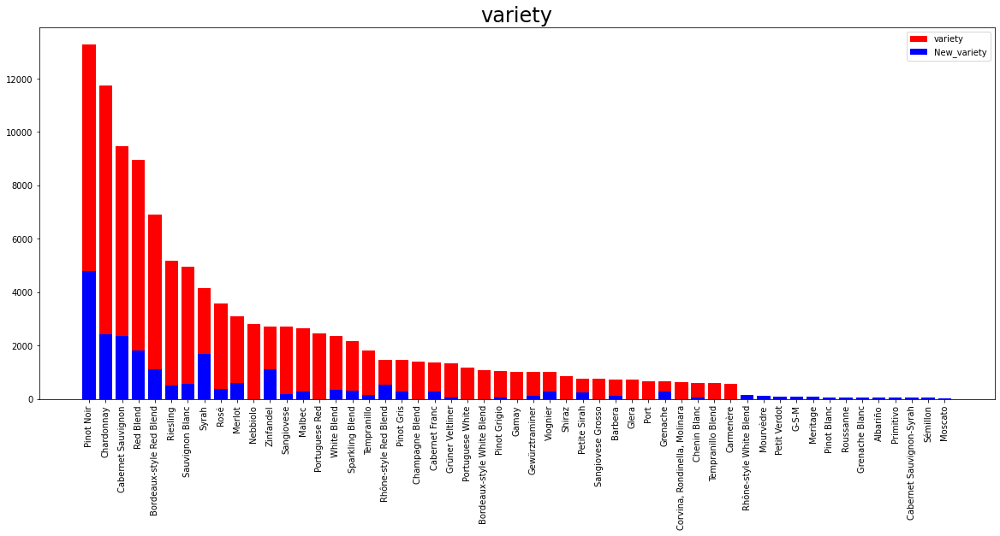

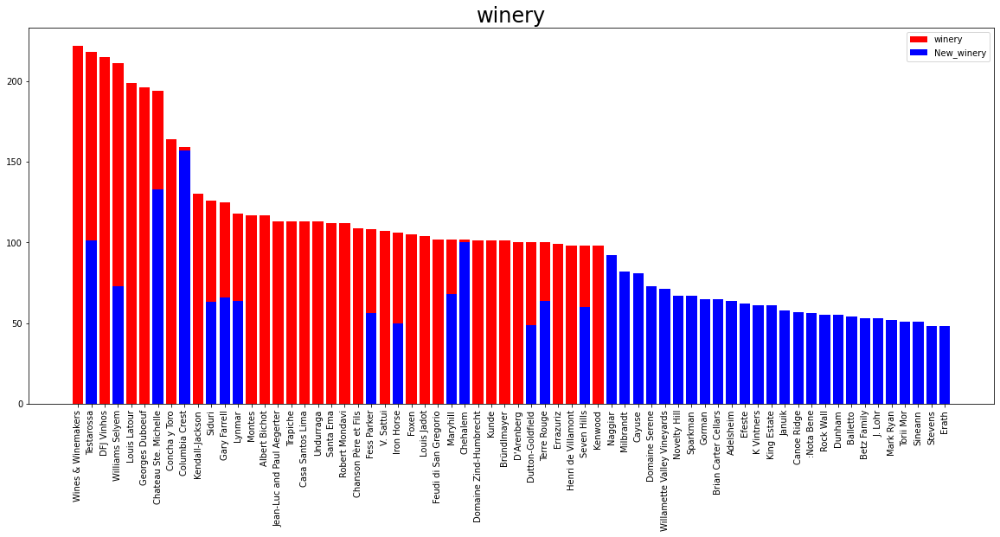

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 91.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 88.0000  Median: 90.0000  Q3: 92.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 17.0000  Median: 25.0000  Q3(75%): 42.0000  Max: 3300.0000
Missing_counts: 8996
price_new:
Min: 4.0000  Q1: 25.0000  Median: 36.0000  Q3: 50.0000  Max: 2013.0000



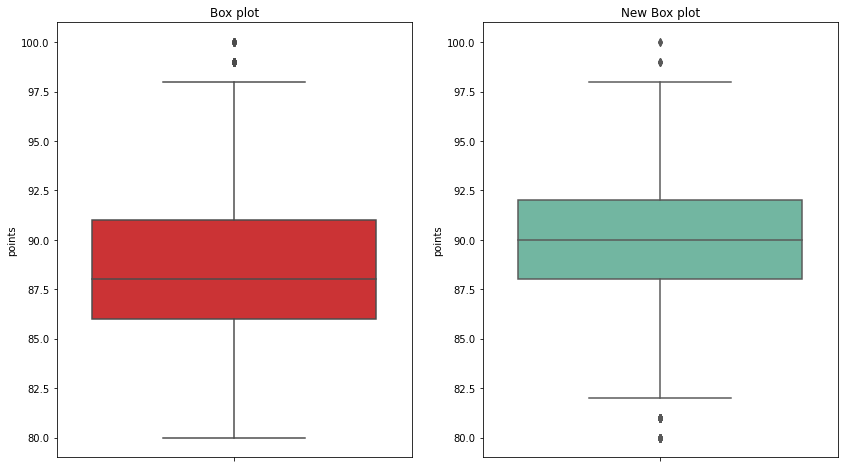

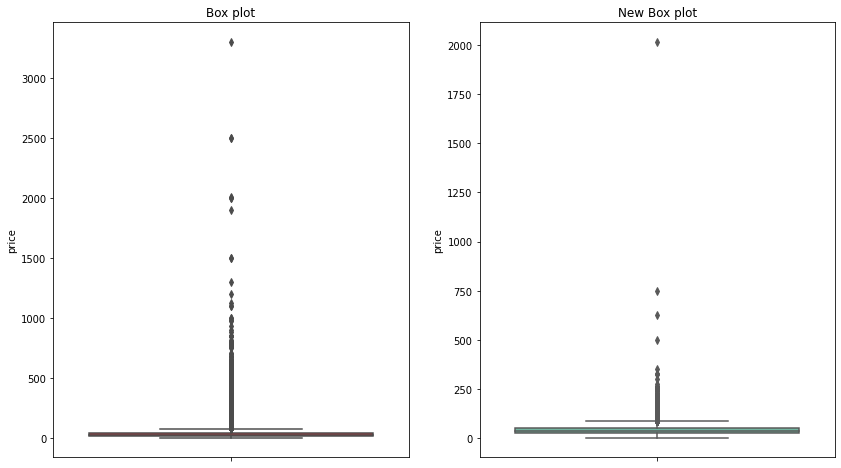

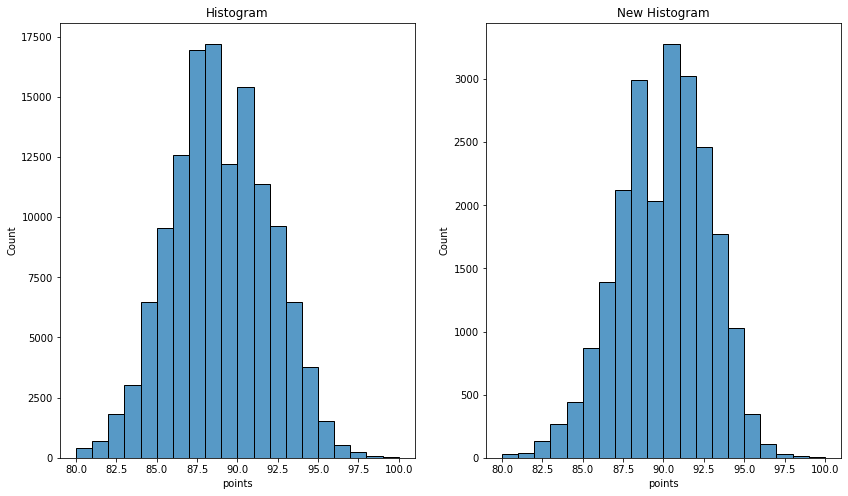

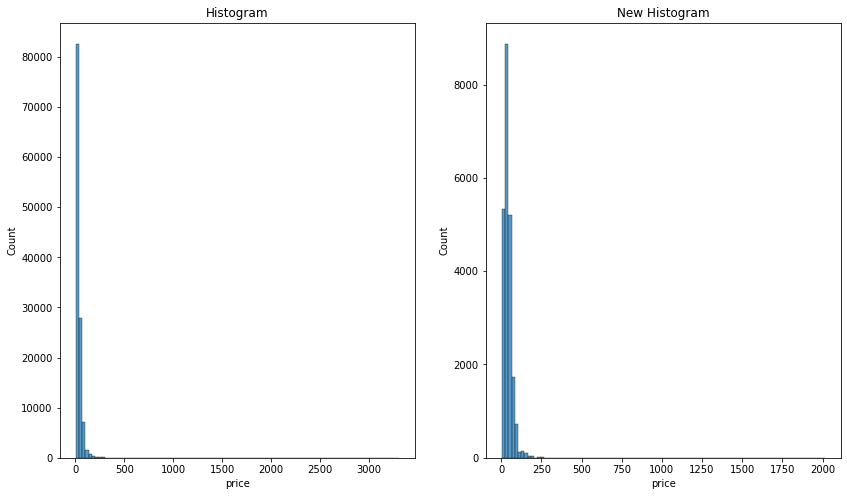

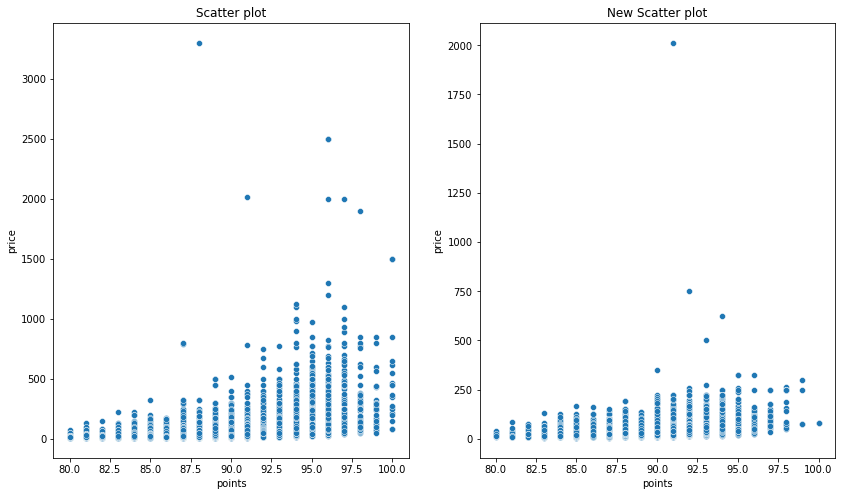

In [55]:
# 将缺失值剔除
df1_new1 = drop_Nan(data_frame1)
nominal_display(df=data_frame1,df_new=df1_new1,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame1,df_new=df1_new1,numerical_attr=numerical_attr)
box_plot(df=data_frame1,label='points',df_new=df1_new1)
box_plot(df=data_frame1,label='price',df_new=df1_new1)
hist_plot(df=data_frame1,df_new=df1_new1,label = 'points',bin_nums=20)
hist_plot(df=data_frame1,df_new=df1_new1,label = 'price',bin_nums=100)
scatter_plot(df=data_frame1,df_new=df1_new1,xlabel='points',ylabel='price')

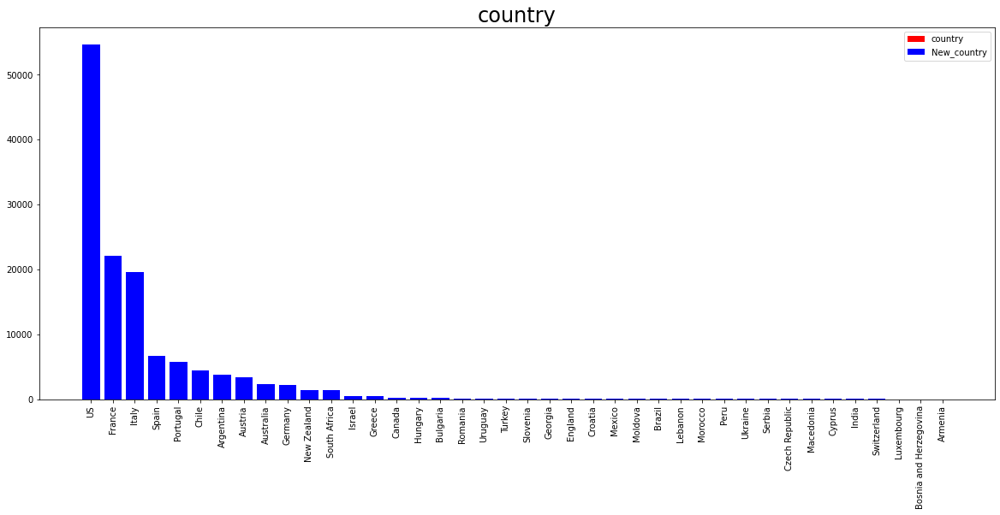

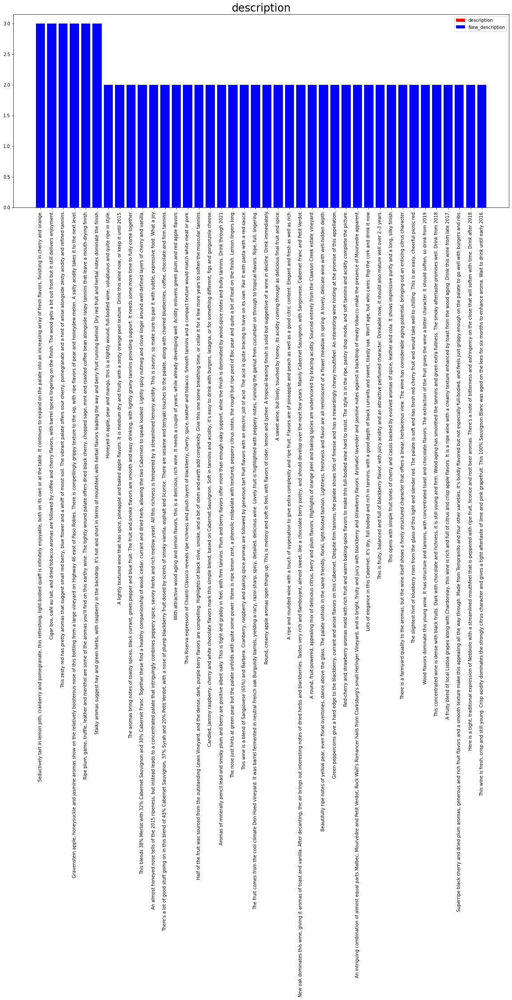

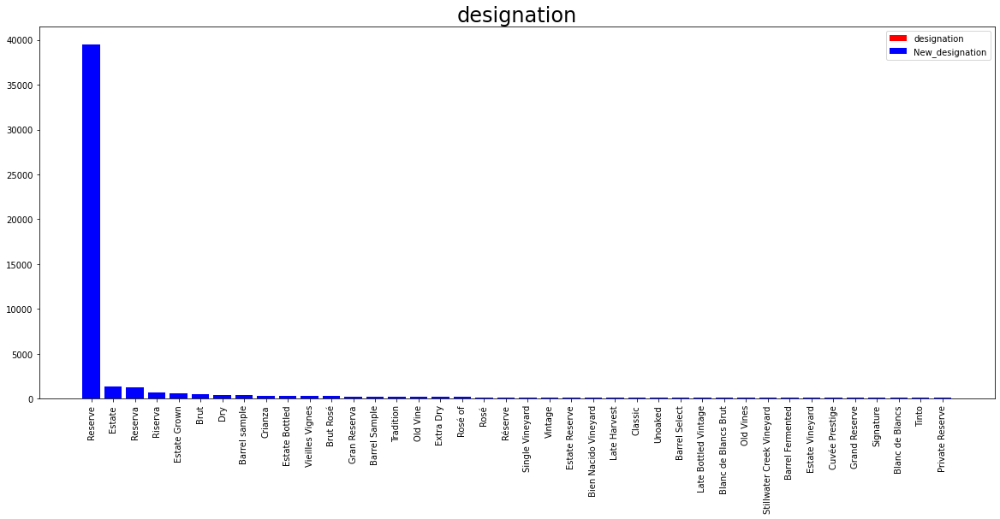

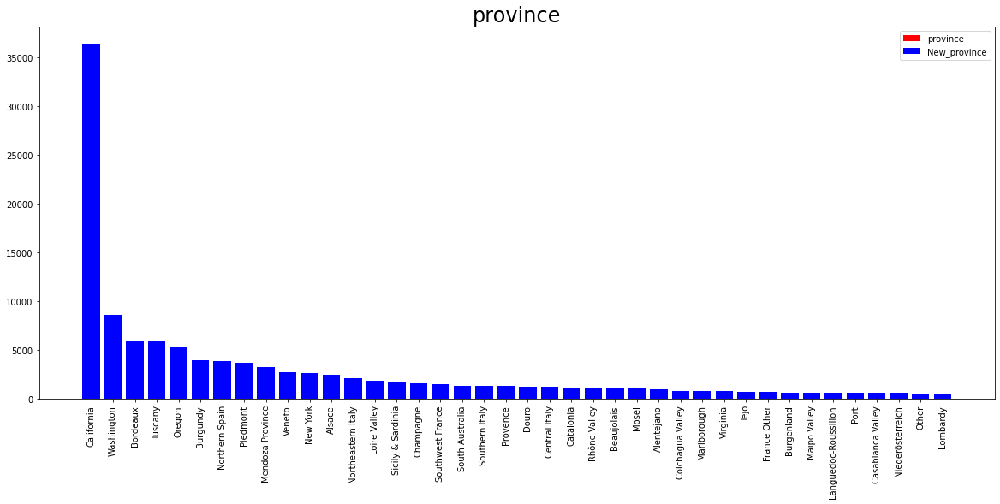

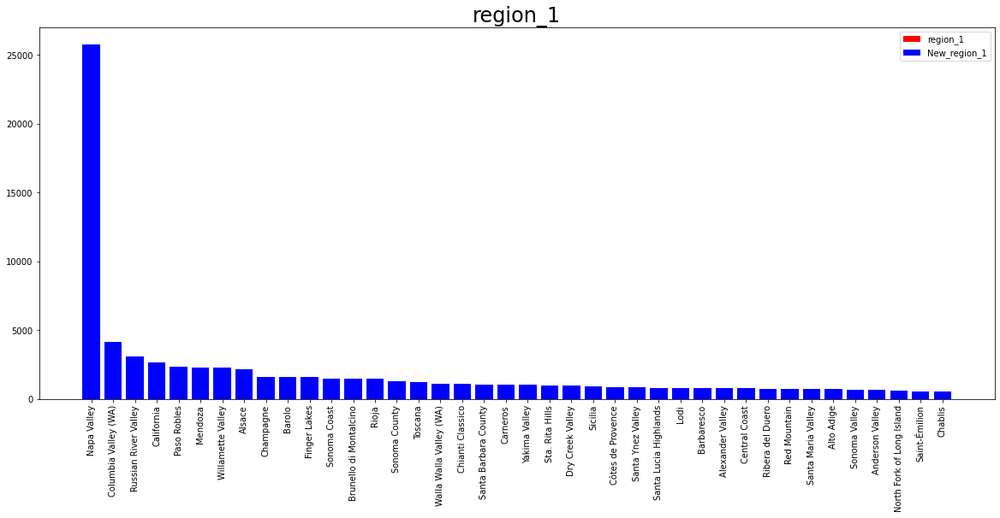

...

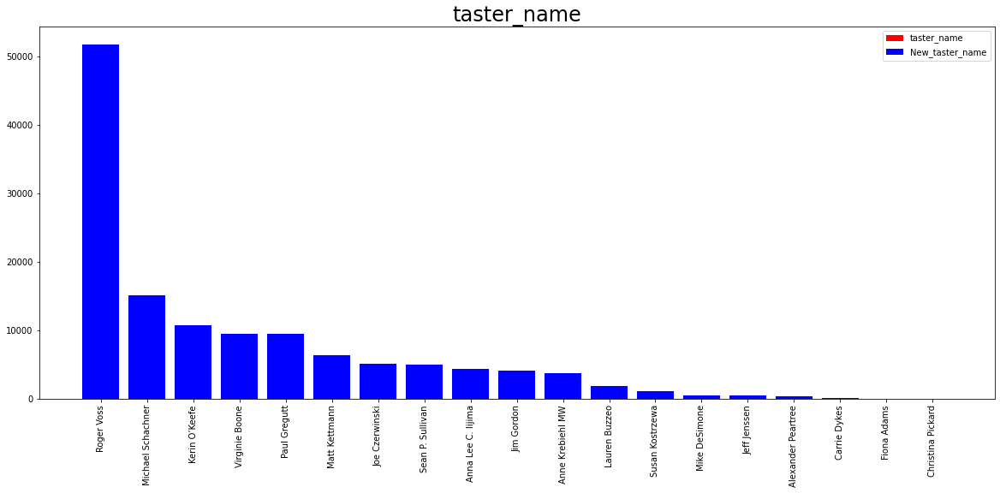

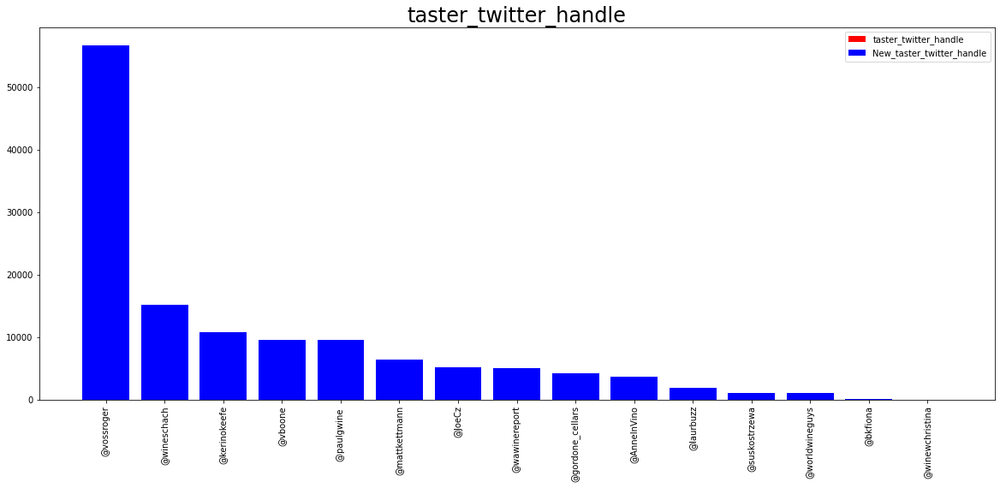

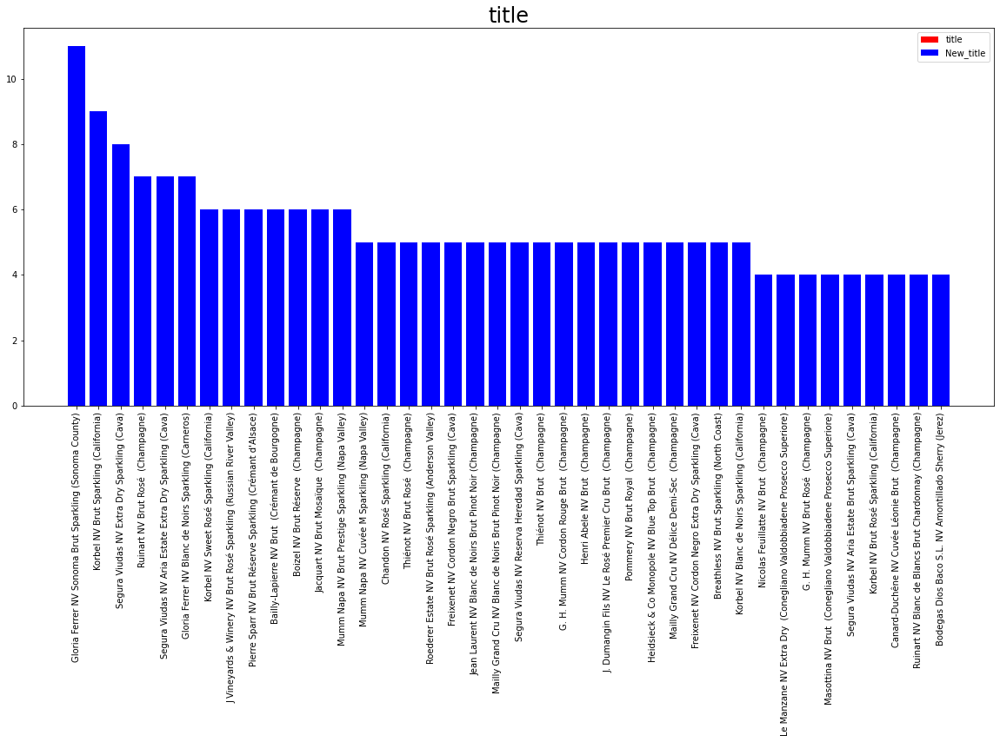

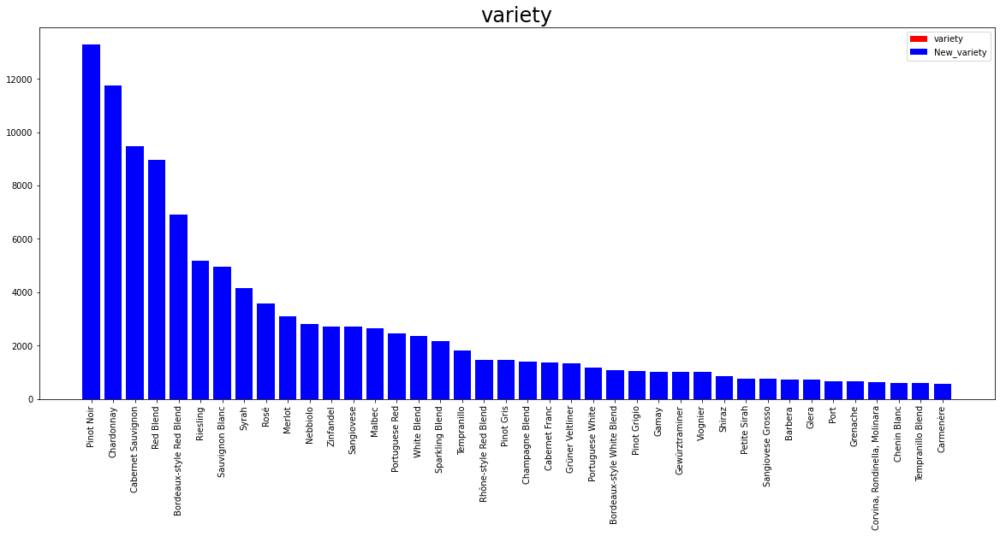

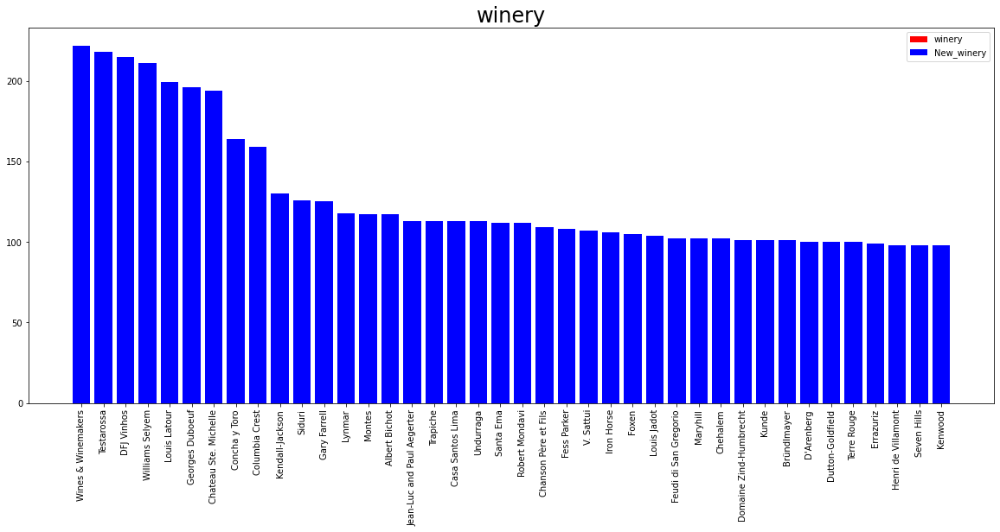

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 91.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 86.0000  Median: 88.0000  Q3: 91.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 17.0000  Median: 25.0000  Q3(75%): 42.0000  Max: 3300.0000
Missing_counts: 8996
price_new:
Min: 4.0000  Q1: 18.0000  Median: 25.0000  Q3: 40.0000  Max: 3300.0000



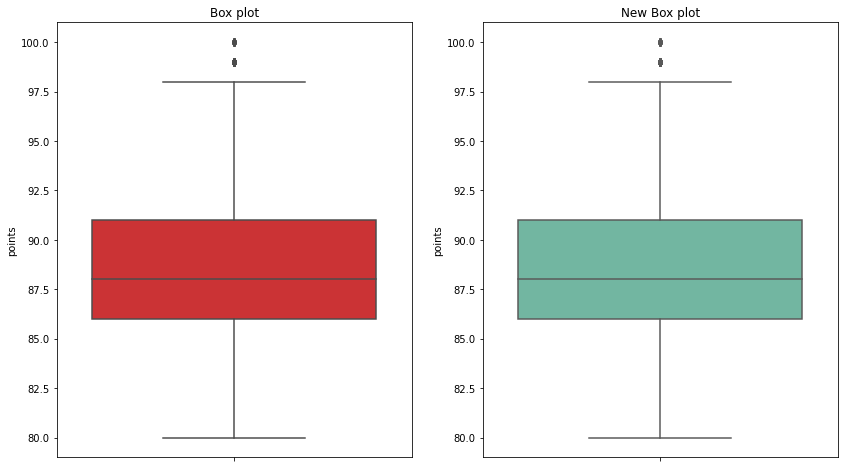

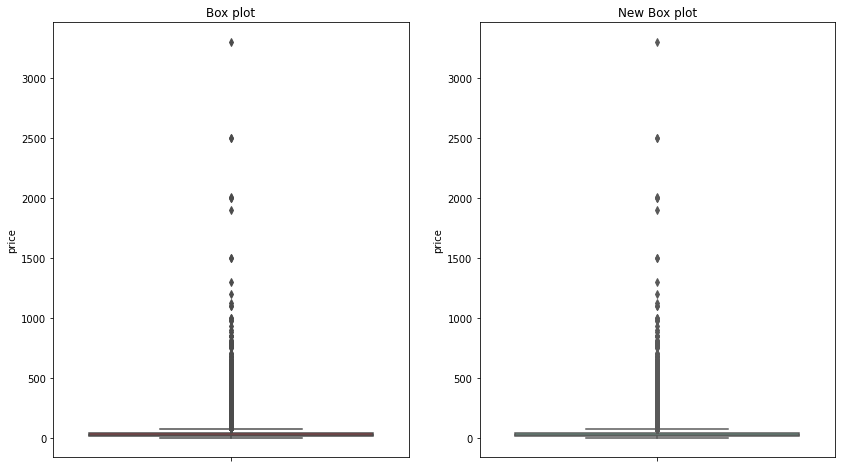

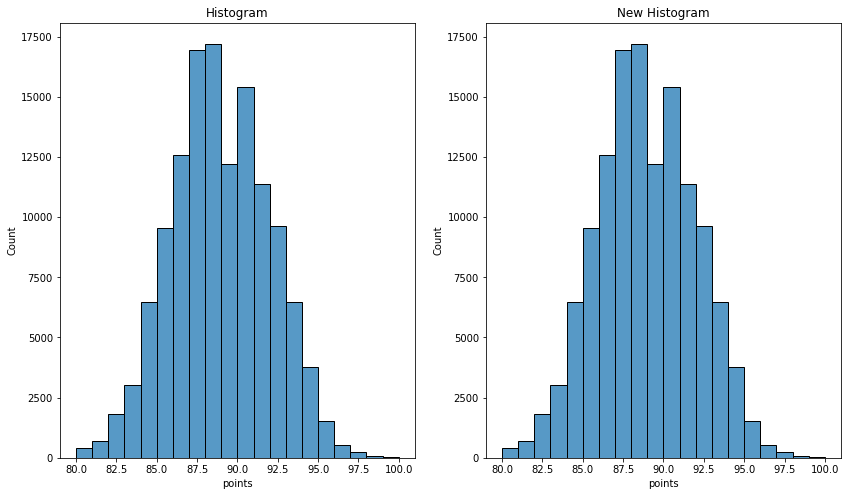

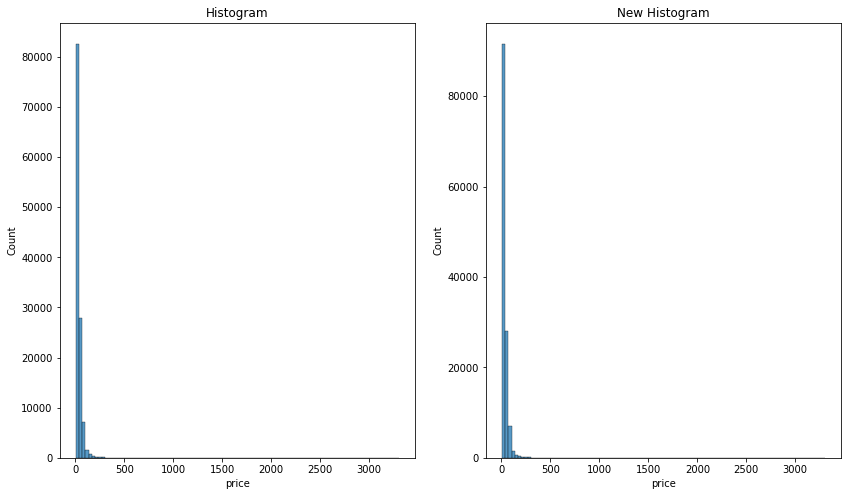

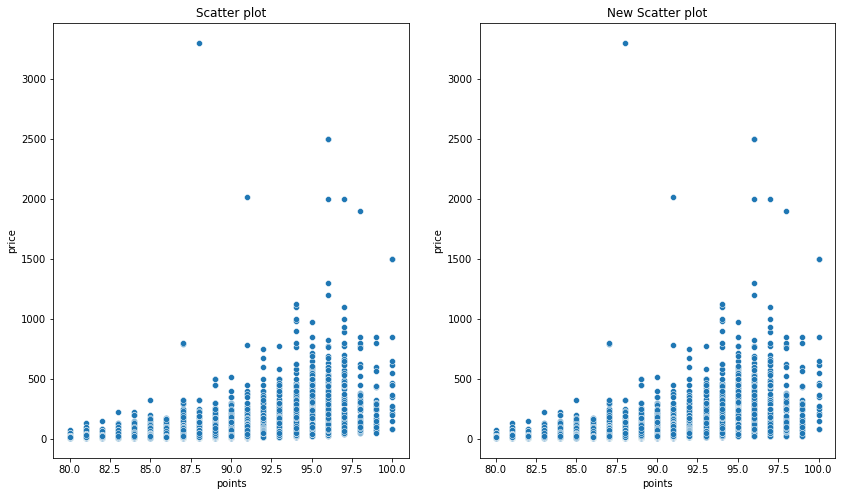

In [56]:
# 最高频率填补缺失值
df1_new2 = fill_mode_for_Nan(data_frame1)
nominal_display(df=data_frame1,df_new=df1_new2,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame1,df_new=df1_new2,numerical_attr=numerical_attr)
box_plot(df=data_frame1,label='points',df_new=df1_new2)
box_plot(df=data_frame1,label='price',df_new=df1_new2)
hist_plot(df=data_frame1,df_new=df1_new2,label = 'points',bin_nums=20)
hist_plot(df=data_frame1,df_new=df1_new2,label = 'price',bin_nums=100)
scatter_plot(df=data_frame1,df_new=df1_new2,xlabel='points',ylabel='price')

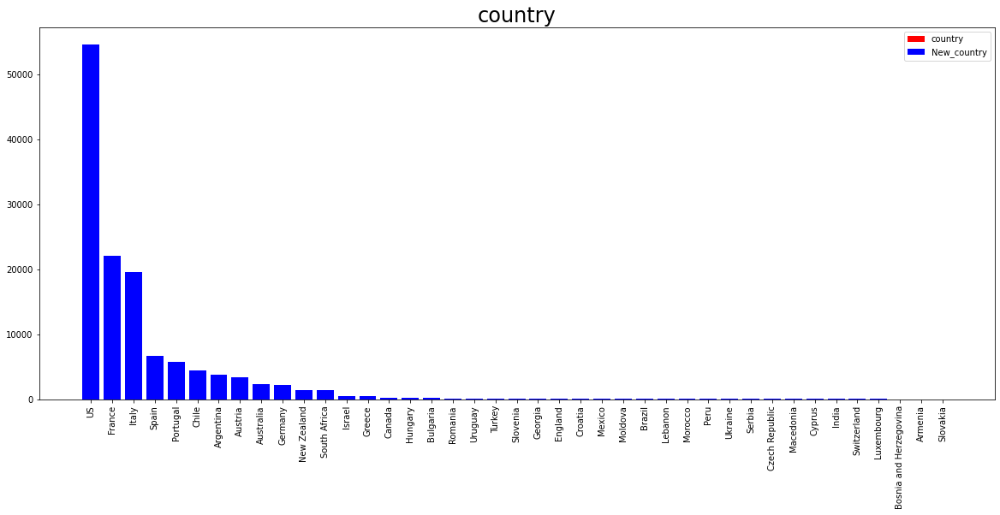

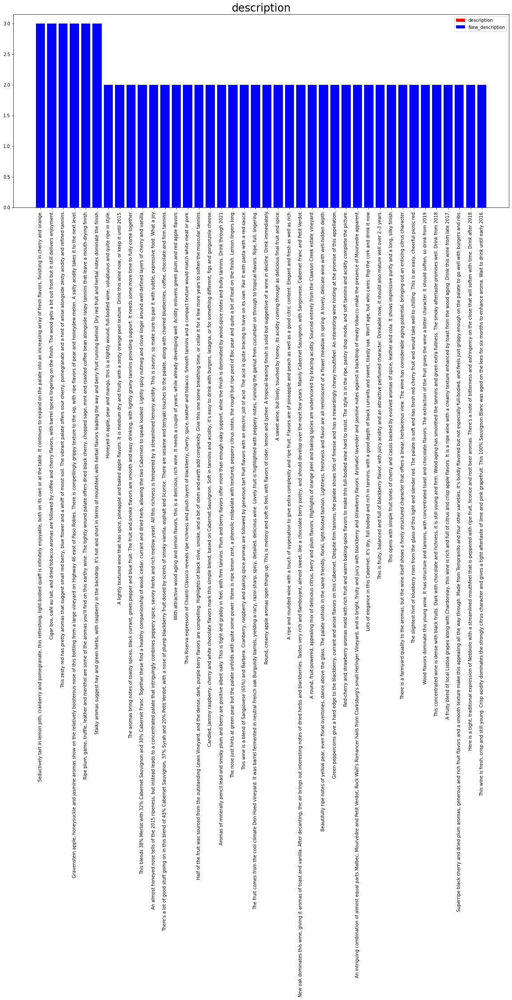

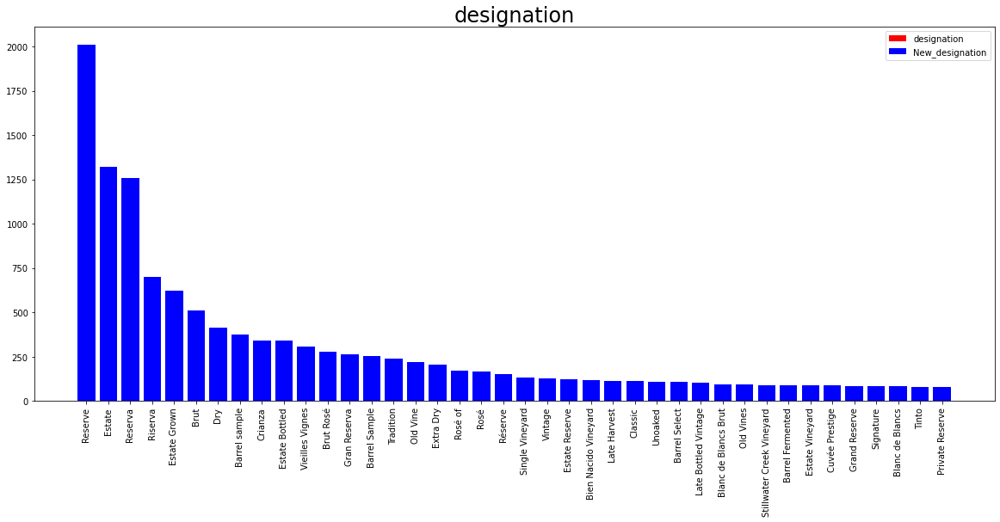

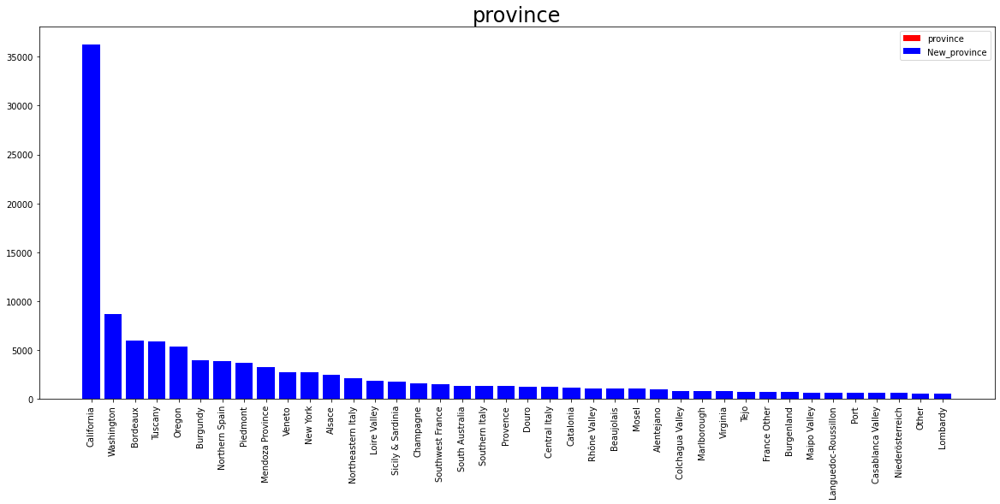

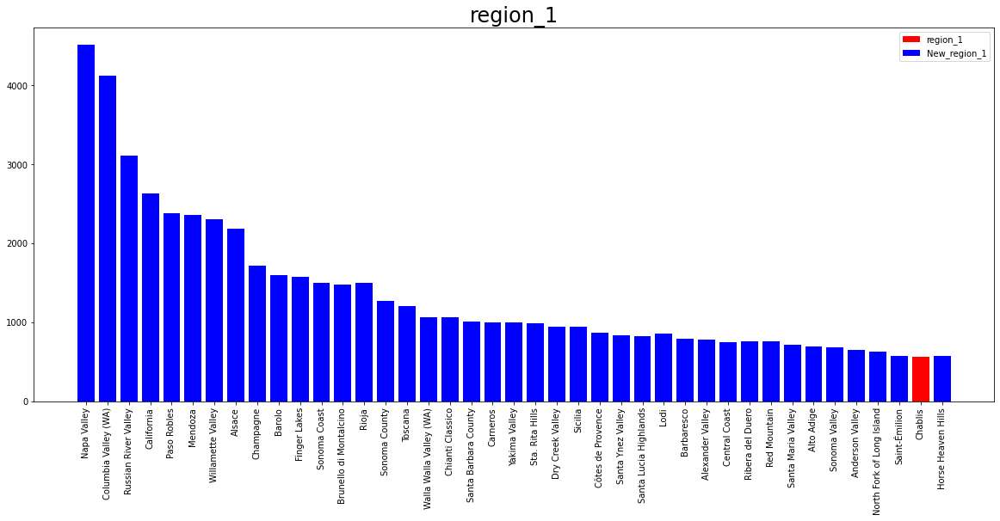

...

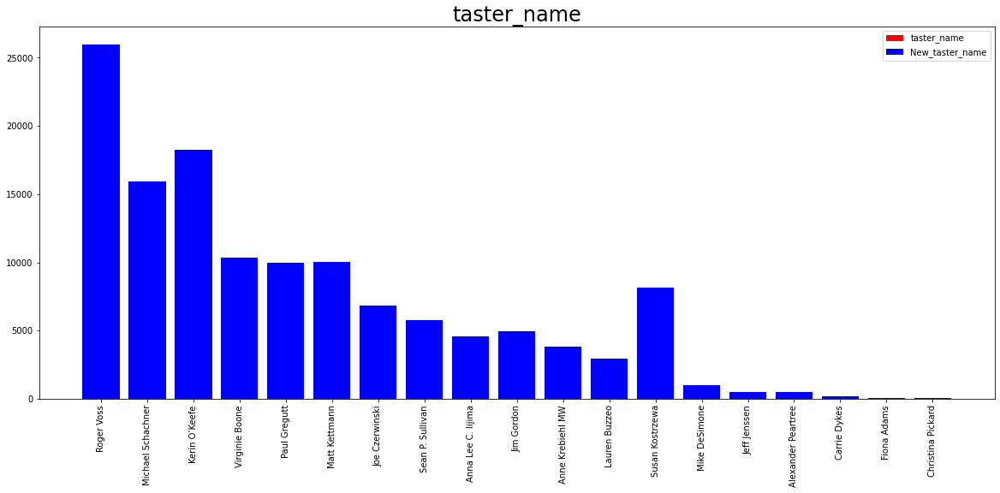

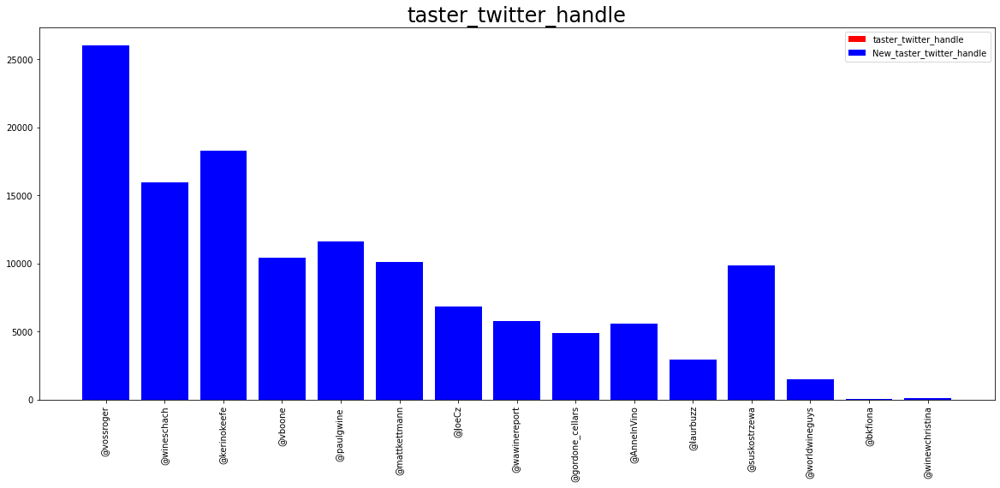

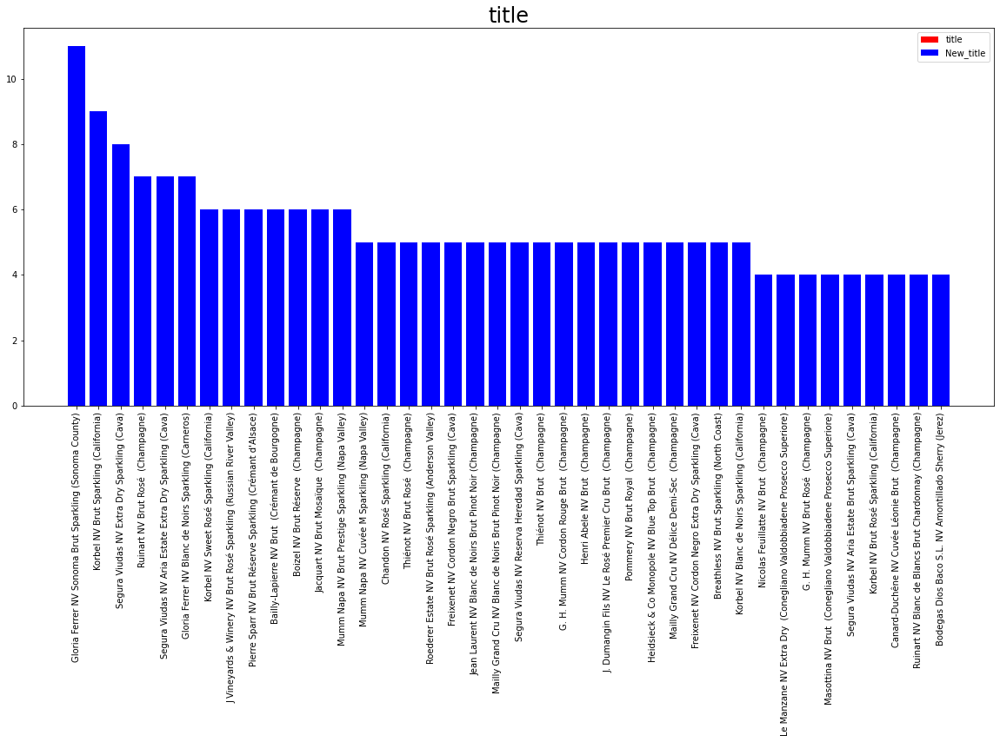

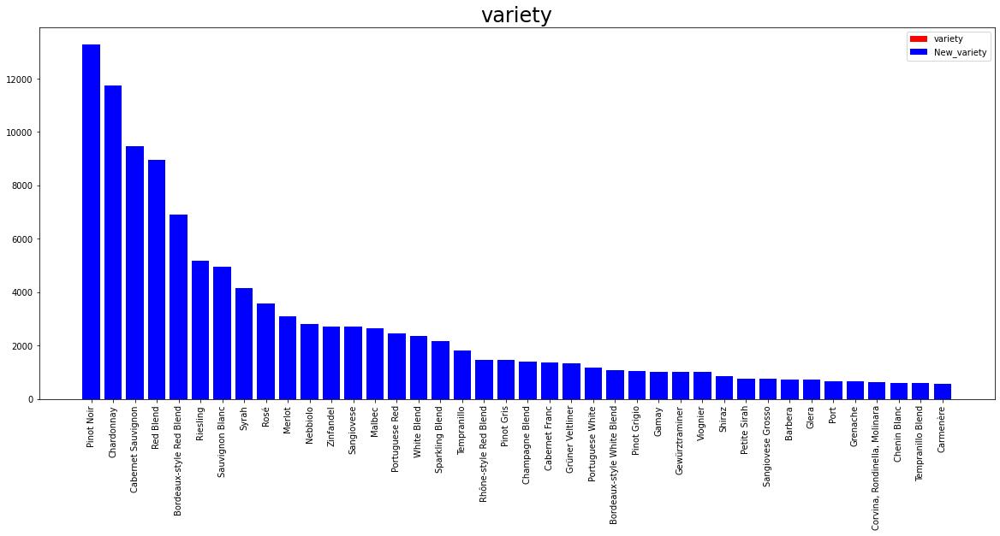

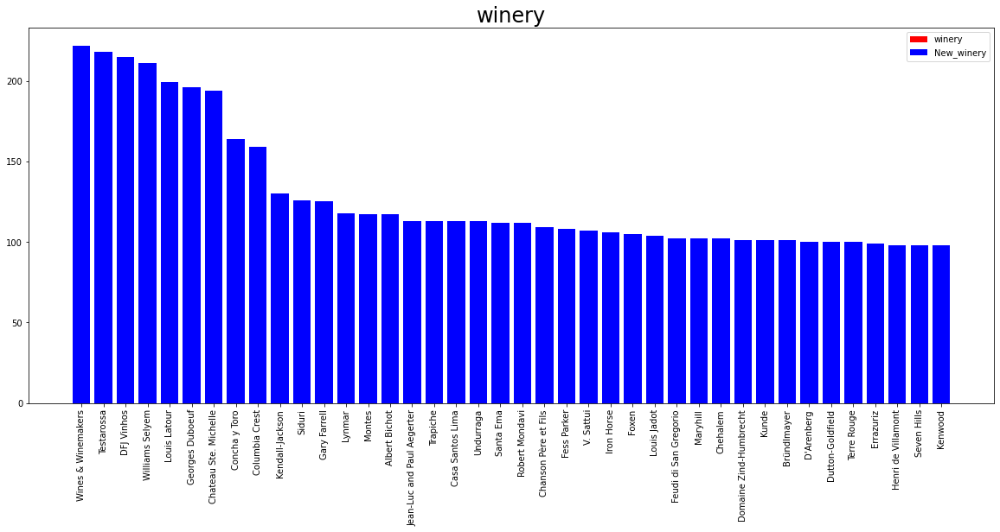

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 91.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 86.0000  Median: 88.0000  Q3: 91.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 17.0000  Median: 25.0000  Q3(75%): 42.0000  Max: 3300.0000
Missing_counts: 8996
price_new:
Min: 4.0000  Q1: 17.0000  Median: 26.0000  Q3: 42.0000  Max: 3300.0000



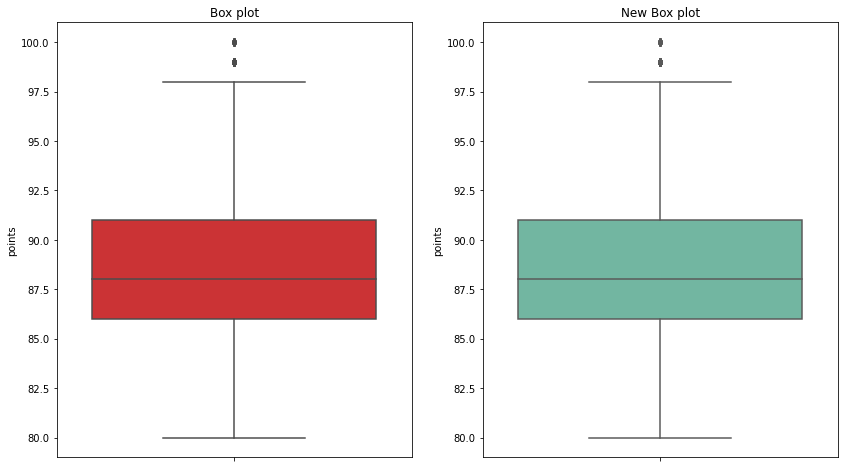

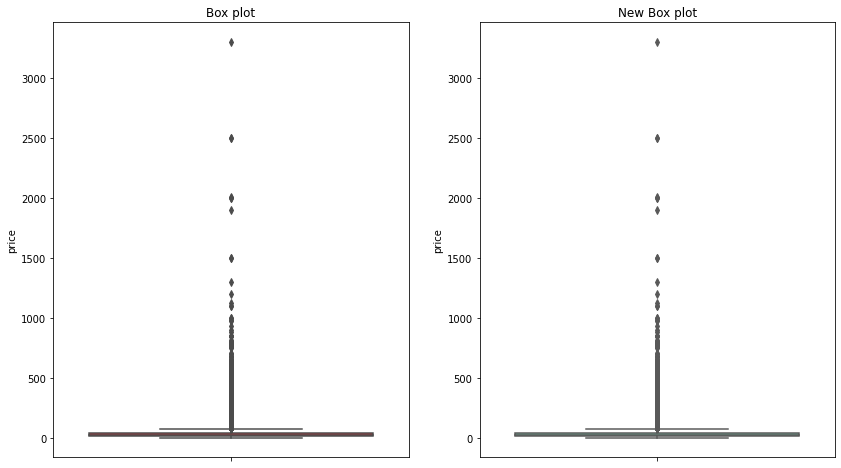

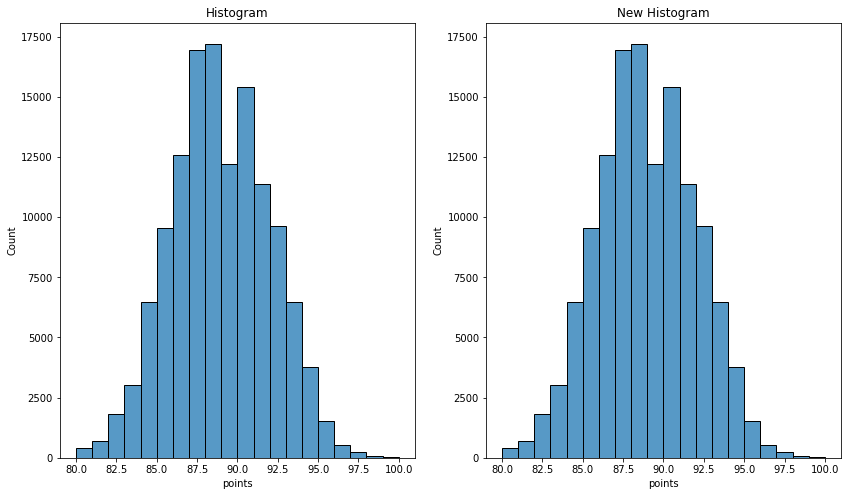

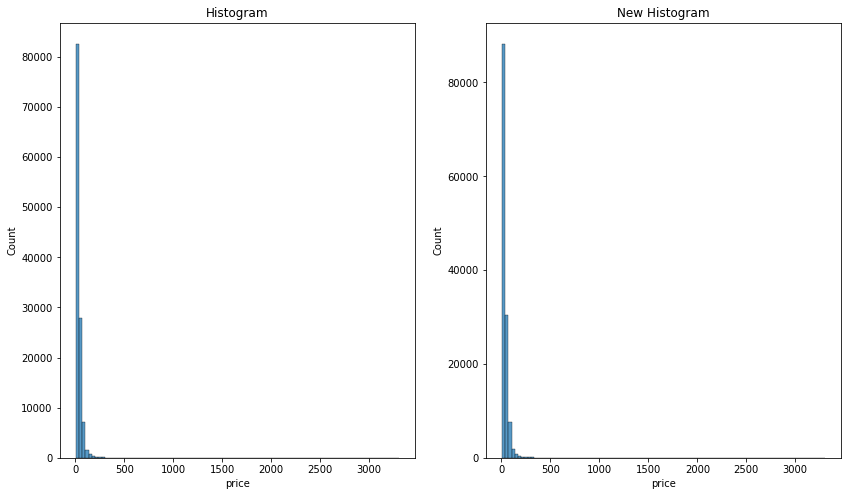

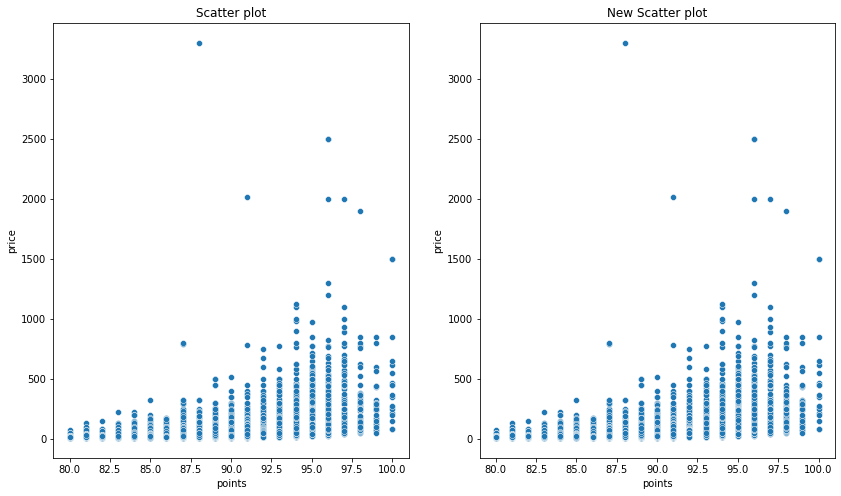

In [57]:
# 通过属性的相关关系来填补缺失值
miss_attr=['country','designation','price','province','region_1','region_2','taster_name','taster_twitter_handle','variety']
complete_attr=['description','points','title','winery']
df1_new3=fill_attr_corr(data_frame1,miss_attr=miss_attr,complete_attr=complete_attr)
nominal_display(df=data_frame1,df_new=df1_new3,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame1,df_new=df1_new3,numerical_attr=numerical_attr)
box_plot(df=data_frame1,label='points',df_new=df1_new3)
box_plot(df=data_frame1,label='price',df_new=df1_new3)
hist_plot(df=data_frame1,df_new=df1_new3,label = 'points',bin_nums=20)
hist_plot(df=data_frame1,df_new=df1_new3,label = 'price',bin_nums=100)
scatter_plot(df=data_frame1,df_new=df1_new3,xlabel='points',ylabel='price')

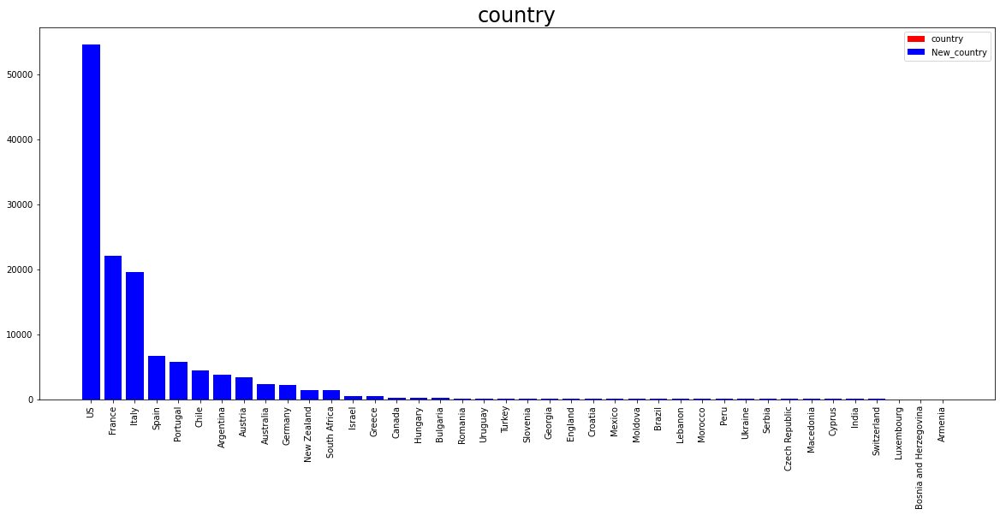

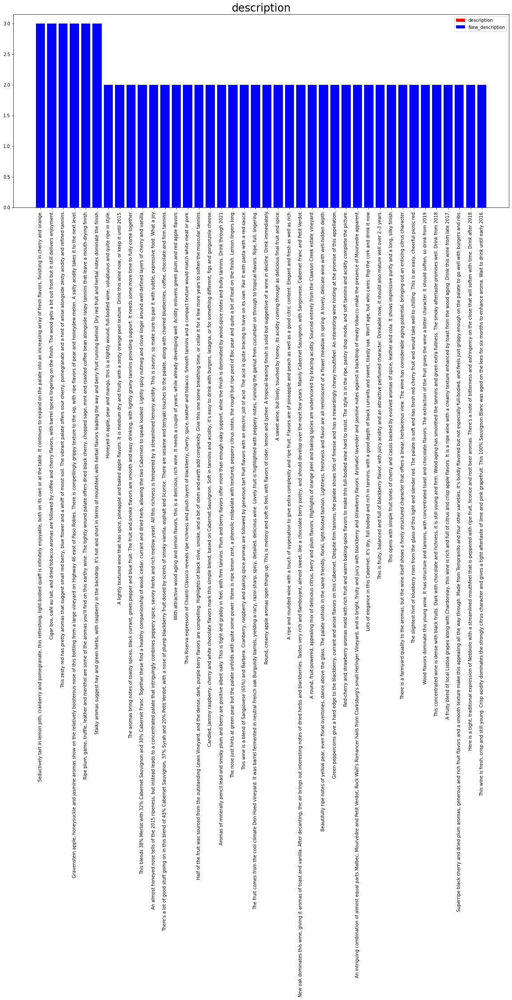

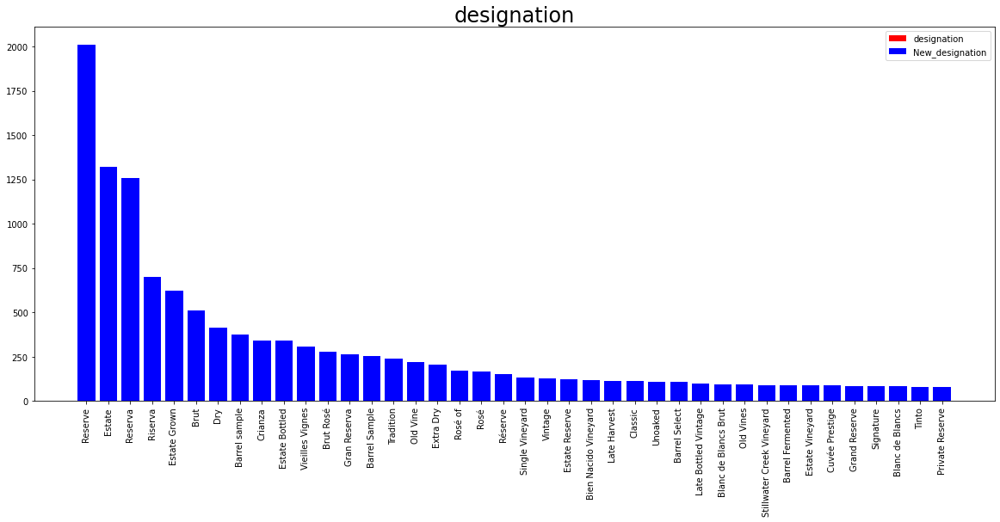

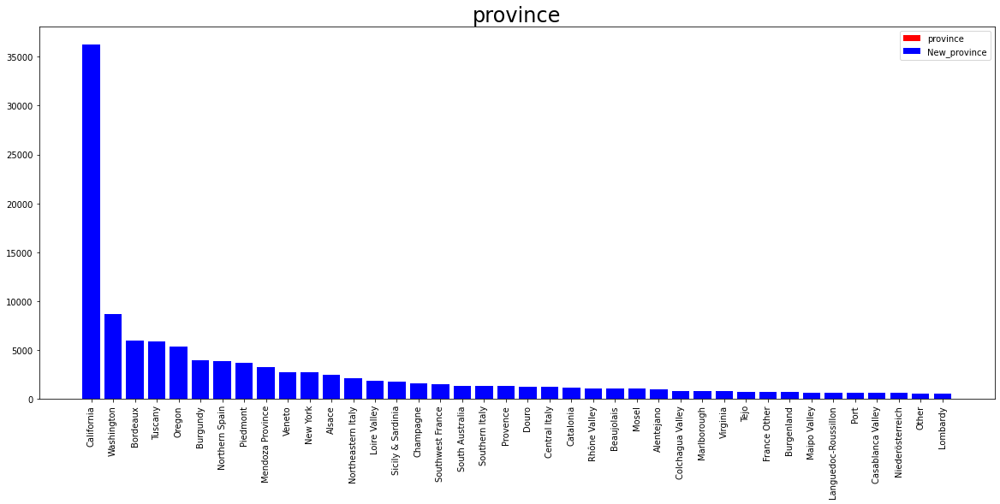

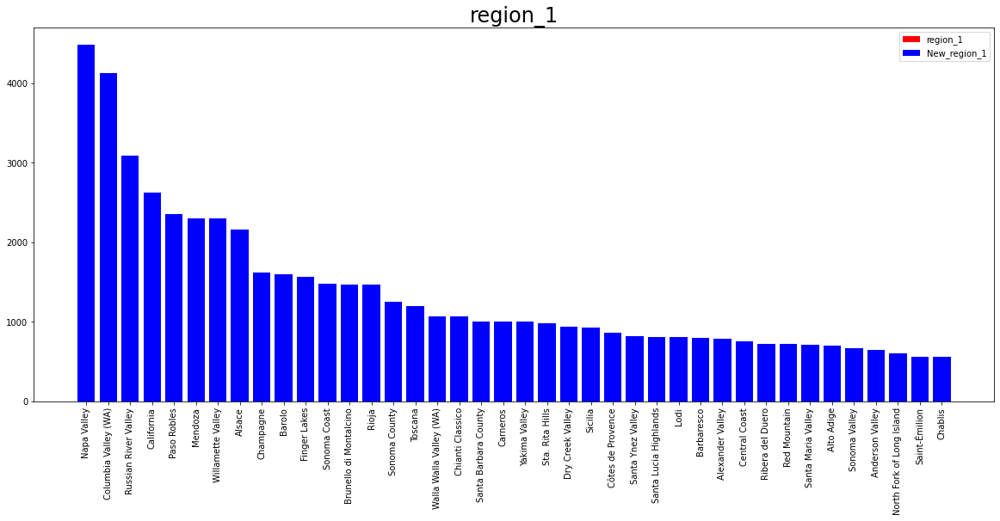

...

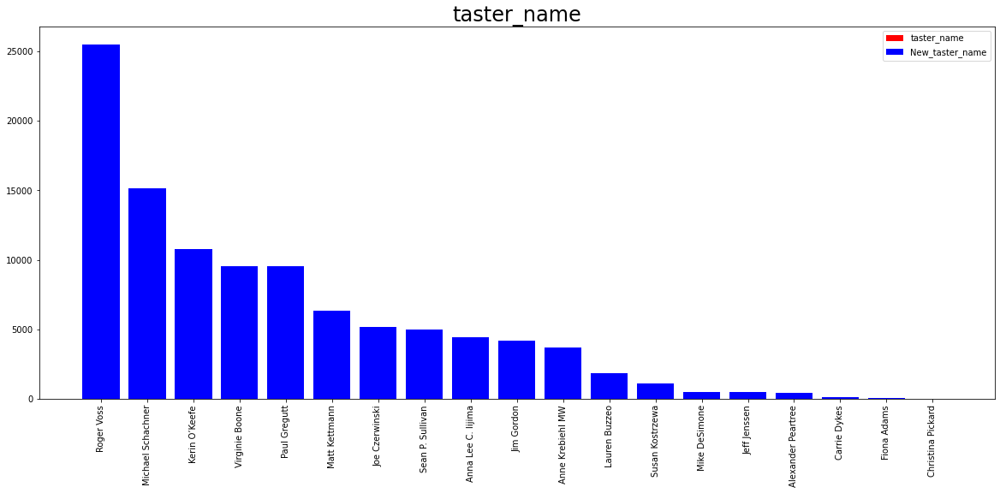

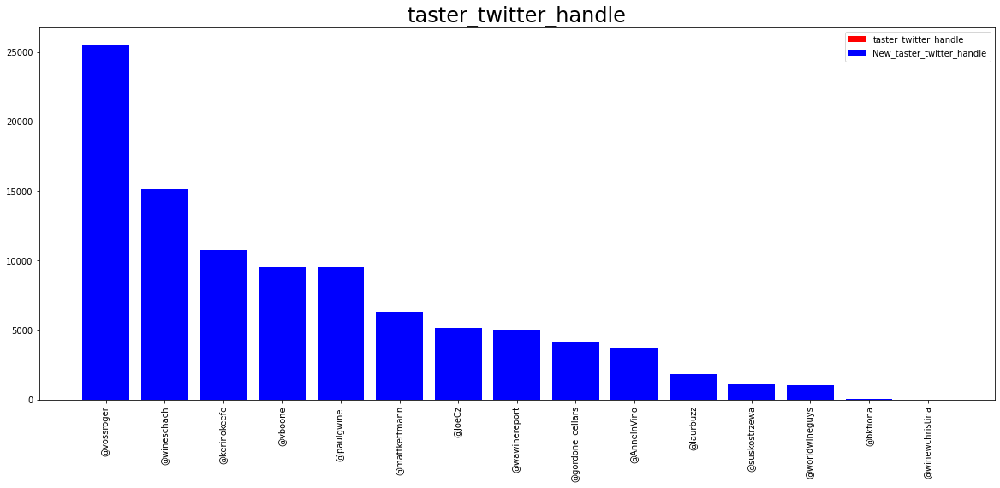

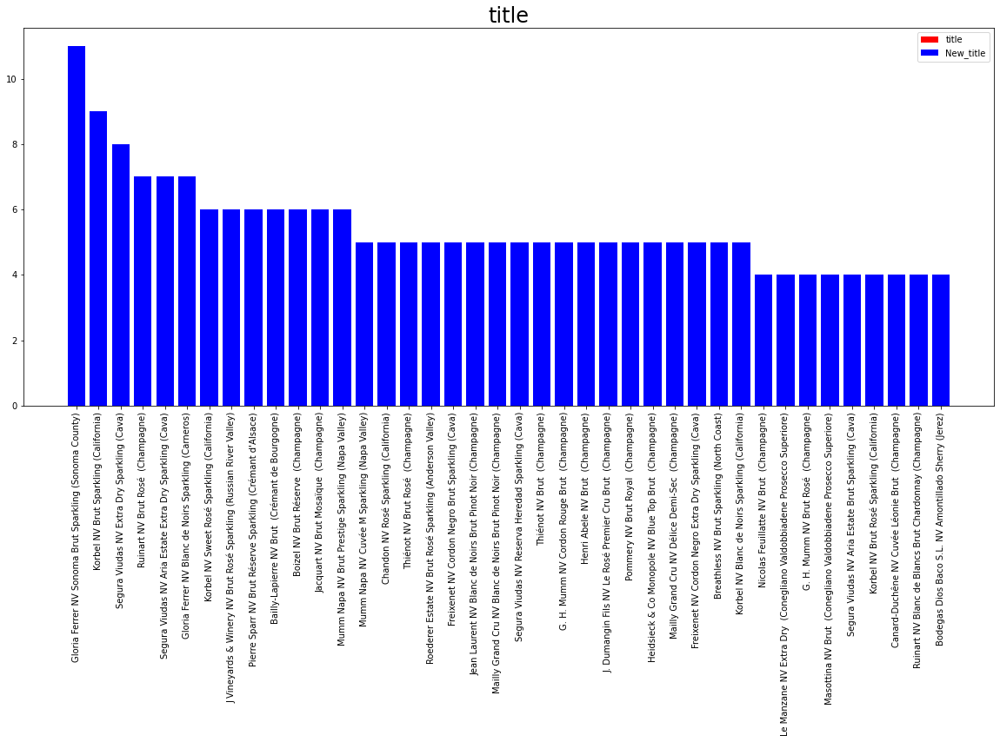

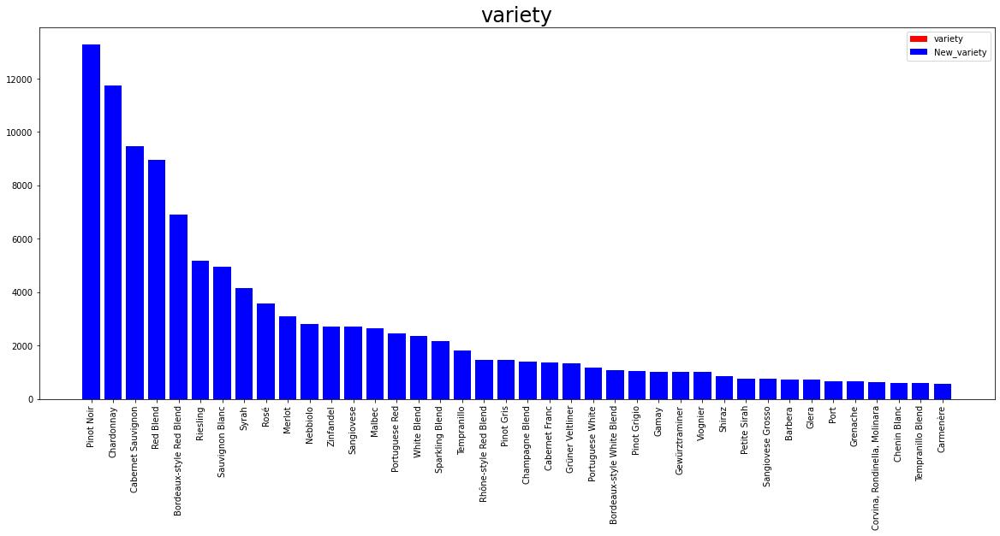

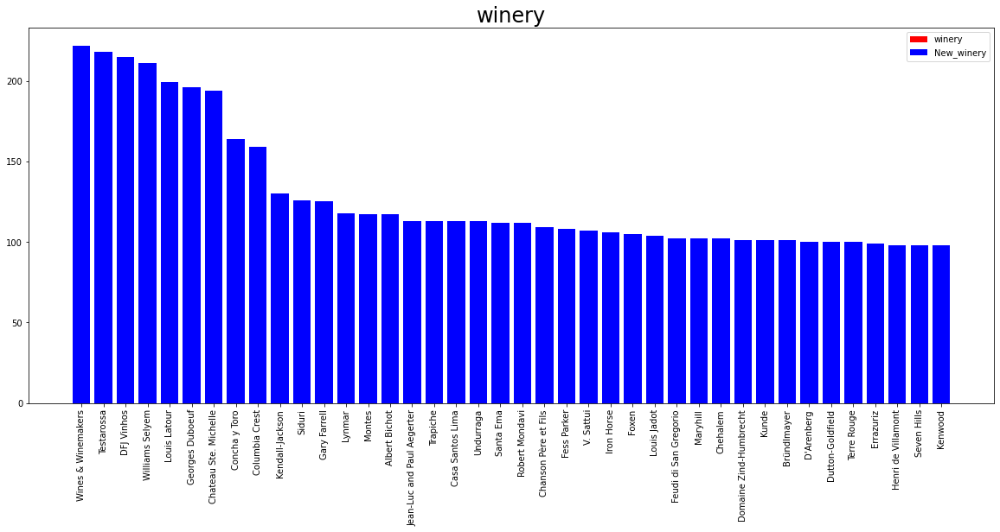

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 91.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 86.0000  Median: 88.0000  Q3: 91.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 17.0000  Median: 25.0000  Q3(75%): 42.0000  Max: 3300.0000
Missing_counts: 8996
price_new:
Min: 4.0000  Q1: 18.0000  Median: 26.0000  Q3: 42.0000  Max: 3300.0000



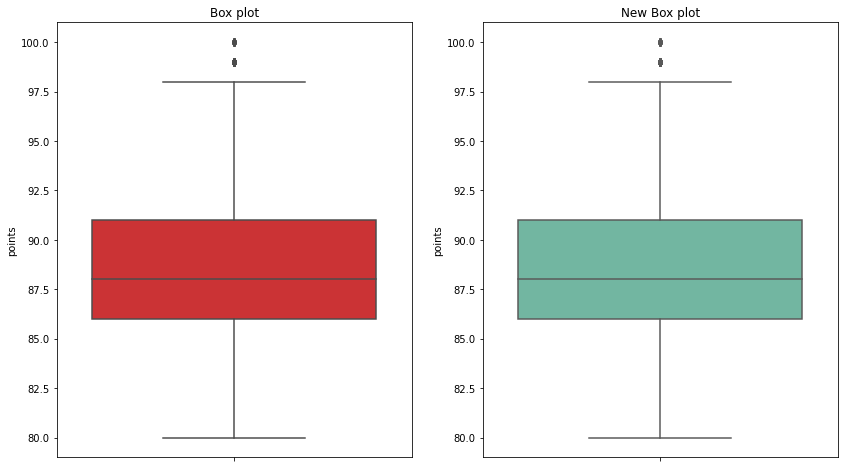

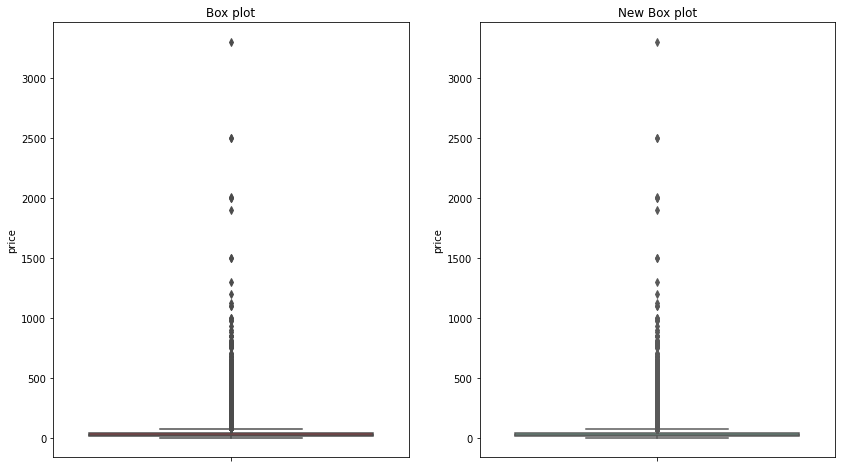

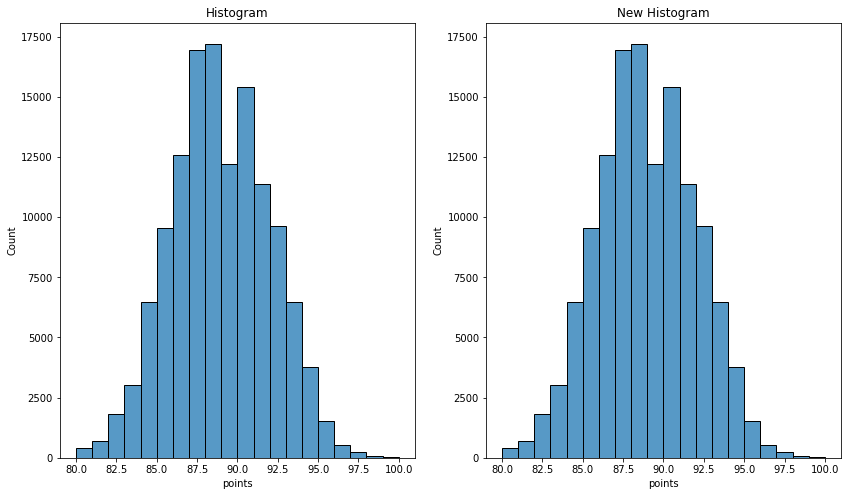

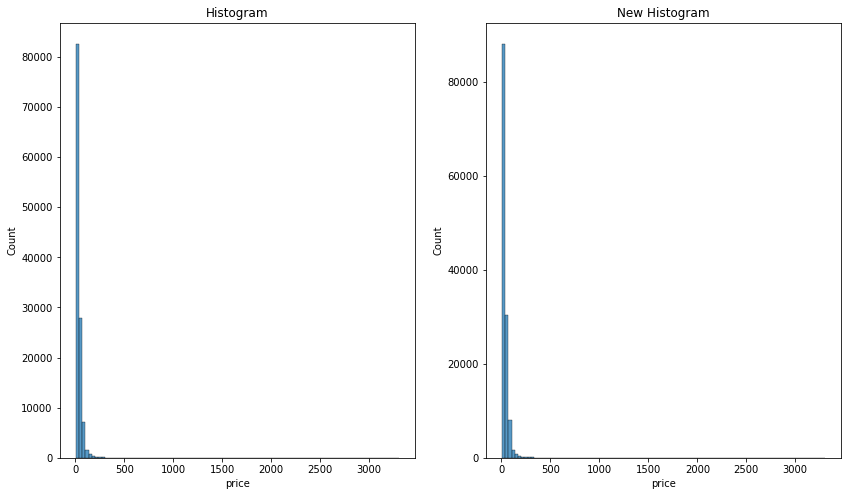

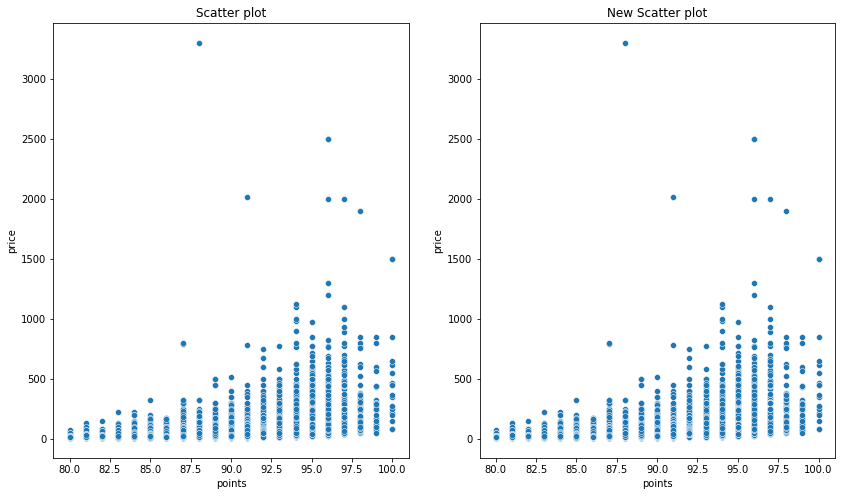

In [58]:
# 通过数据对象之间的相似性来填补缺失值
df1_new4 = correlation_fill(df=data_frame1,numerical_attr=numerical_attr,n_neighbors=20)
nominal_display(df=data_frame1,df_new=df1_new4,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame1,df_new=df1_new4,numerical_attr=numerical_attr)
box_plot(df=data_frame1,label='points',df_new=df1_new4)
box_plot(df=data_frame1,label='price',df_new=df1_new4)
hist_plot(df=data_frame1,df_new=df1_new4,label = 'points',bin_nums=20)
hist_plot(df=data_frame1,df_new=df1_new4,label = 'price',bin_nums=100)
scatter_plot(df=data_frame1,df_new=df1_new4,xlabel='points',ylabel='price')

#### winemag-data_first150k.csv

In [59]:
data_frame2 = pd.read_csv("Wine Reviews/winemag-data_first150k.csv")
# 展示列属性
columns_info(df=data_frame2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150930 entries, 0 to 150929
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   150930 non-null  int64  
 1   country      150925 non-null  object 
 2   description  150930 non-null  object 
 3   designation  105195 non-null  object 
 4   points       150930 non-null  int64  
 5   price        137235 non-null  float64
 6   province     150925 non-null  object 
 7   region_1     125870 non-null  object 
 8   region_2     60953 non-null   object 
 9   variety      150930 non-null  object 
 10  winery       150930 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 12.7+ MB
None


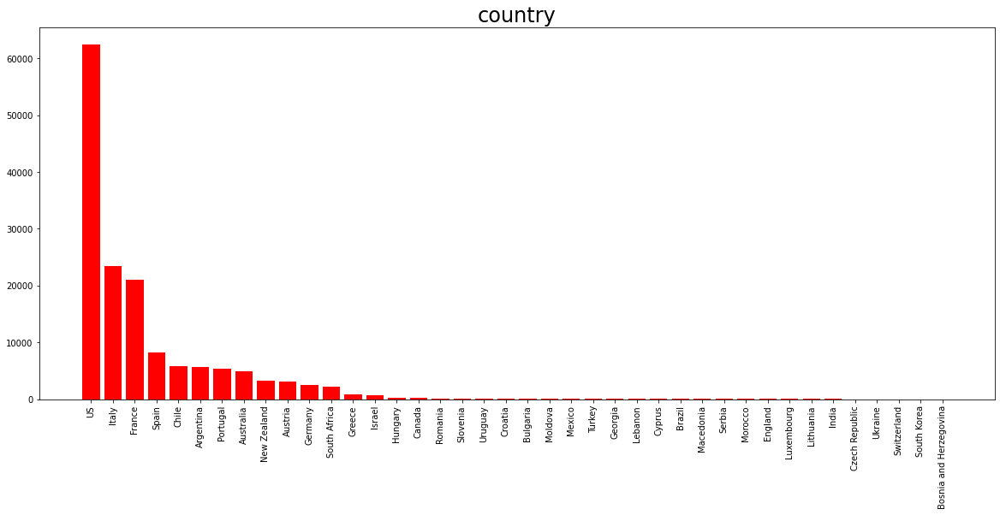

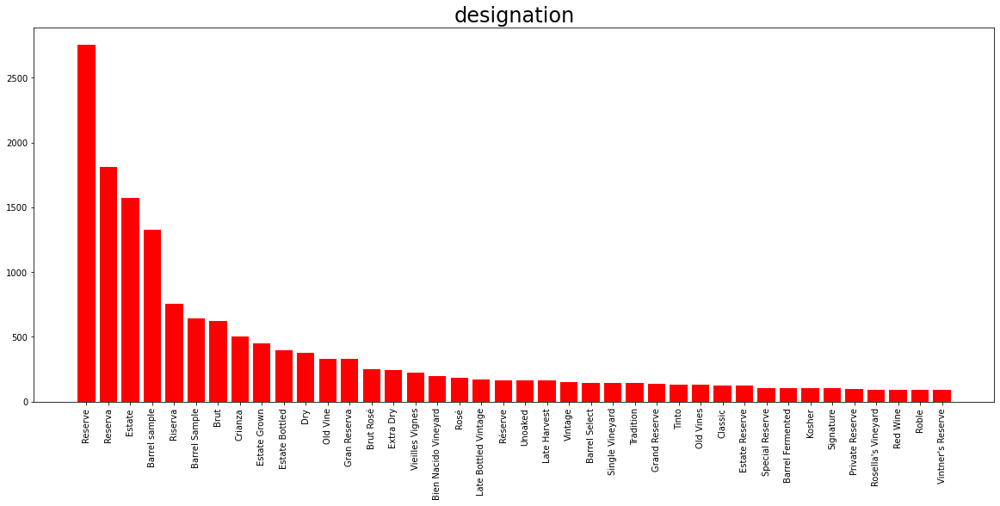

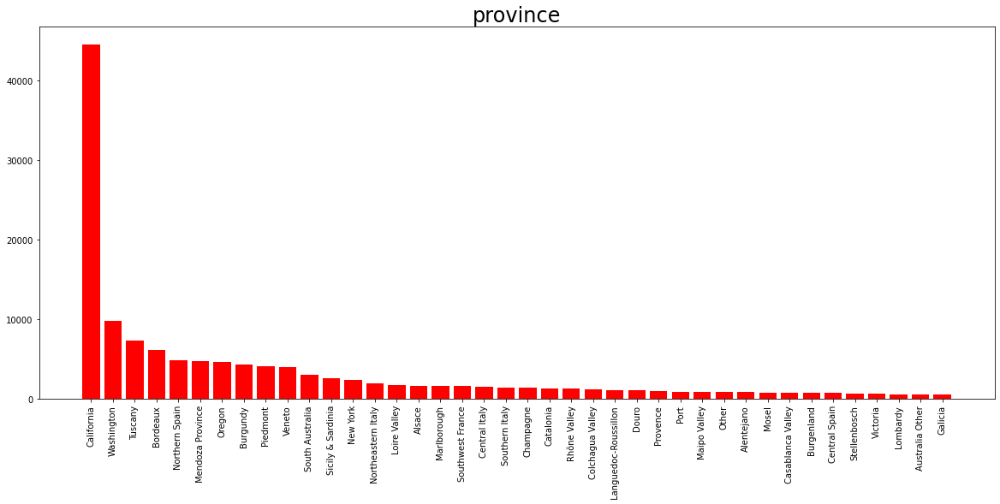

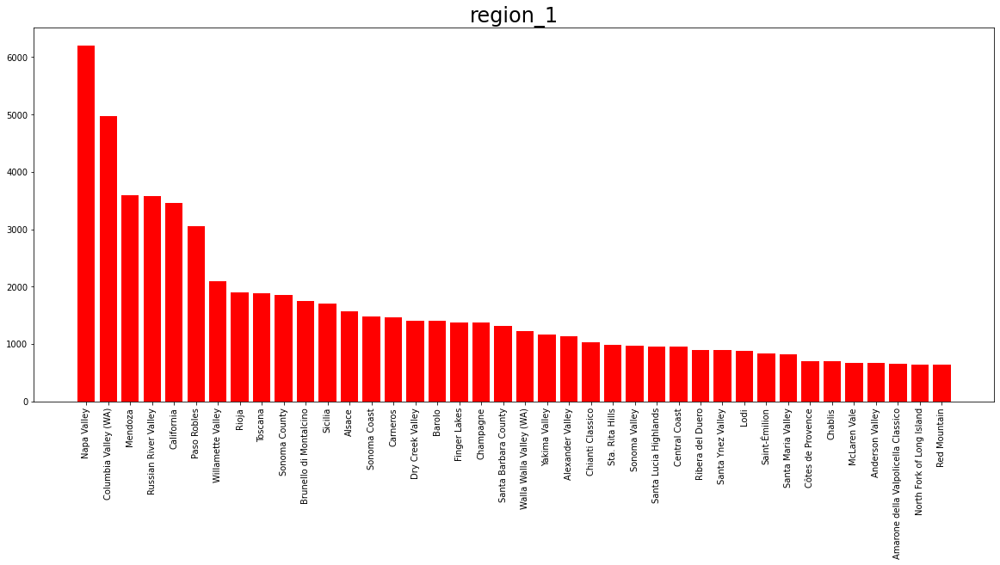

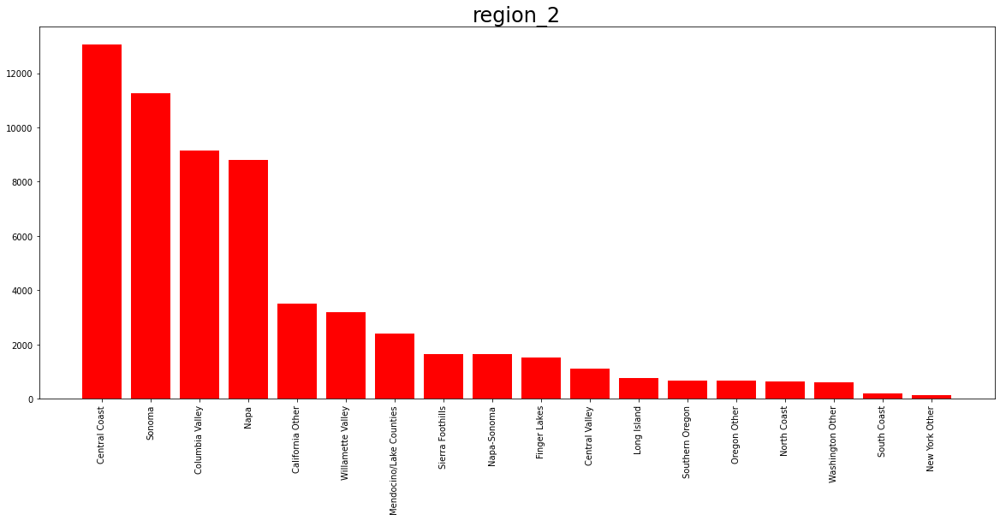

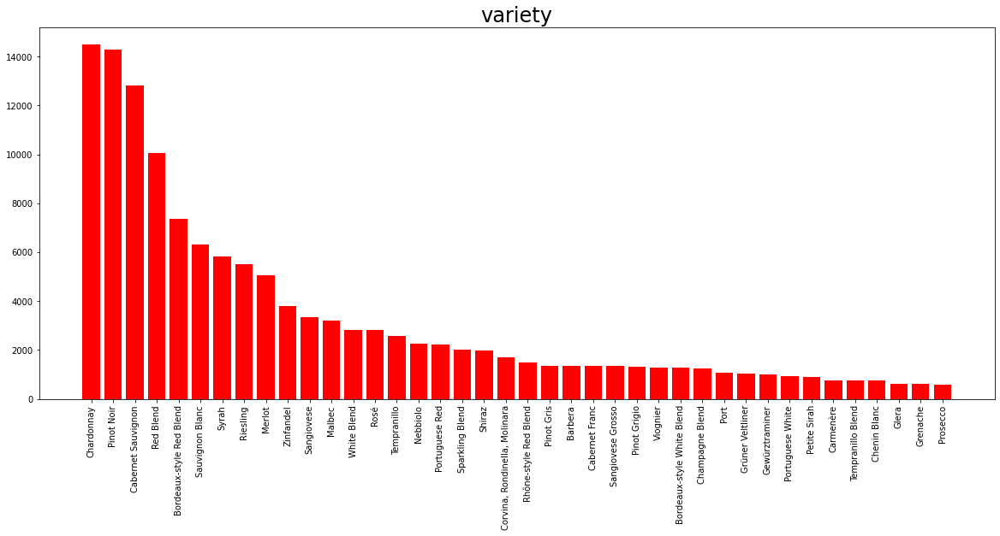

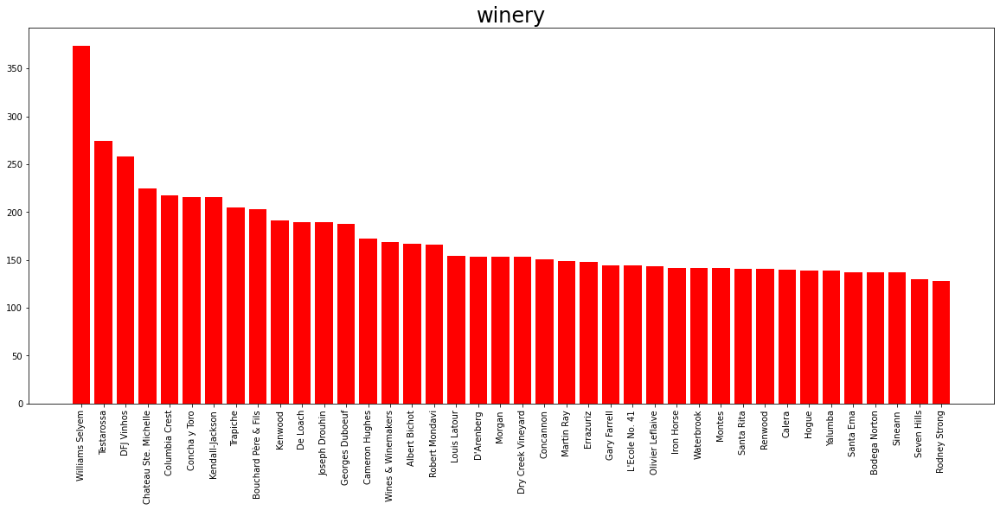

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 90.0000  Max: 100.0000
Missing_counts: 0

price:
Min: 4.0000  Q1(25%): 16.0000  Median: 24.0000  Q3(75%): 40.0000  Max: 2300.0000
Missing_counts: 13695



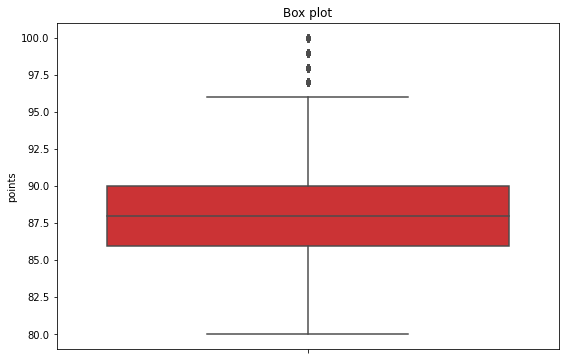

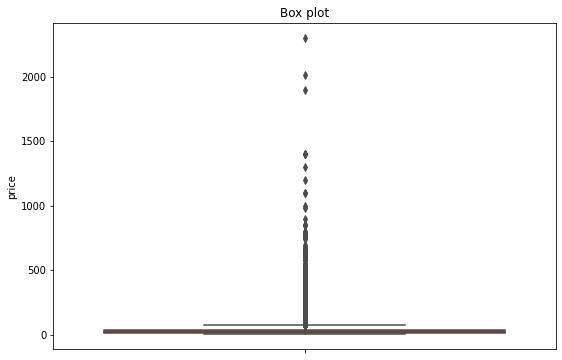

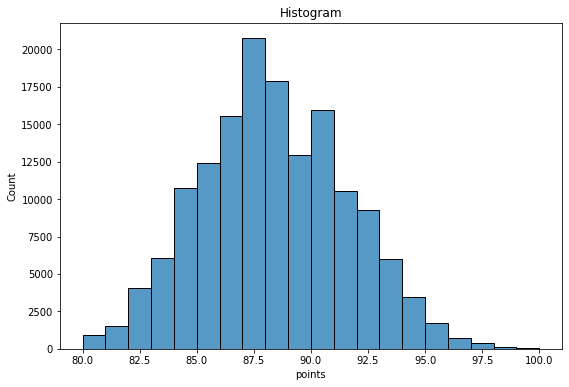

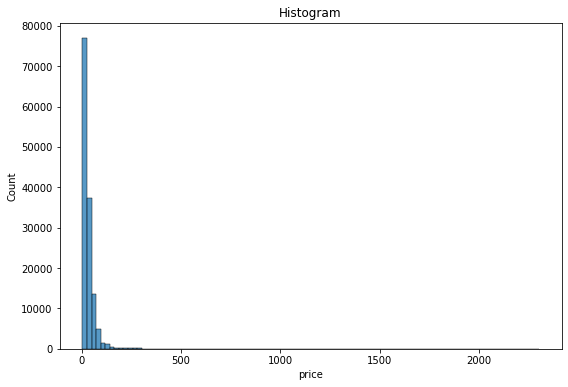

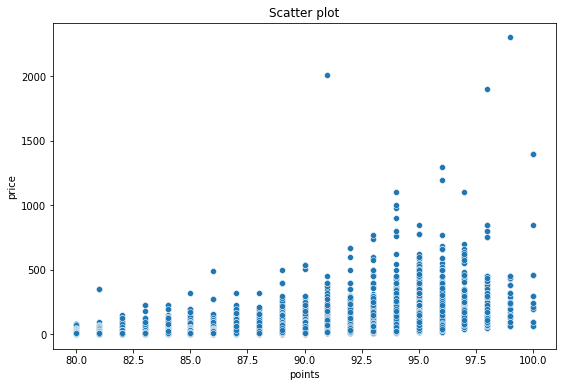

In [60]:
# Nominal attribute
nominal_attr = ['country', 'designation', 'province', 'region_1', 'region_2', 'variety', 'winery']
# Numerical attribute
numerical_attr = ['points', 'price']
nominal_display(df=data_frame2,df_new=None,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame2,df_new=None,numerical_attr=numerical_attr)
box_plot(df=data_frame2,label='points',df_new=None)
box_plot(df=data_frame2,label='price',df_new=None)
hist_plot(df=data_frame2,df_new=None,label = 'points',bin_nums=20)
hist_plot(df=data_frame2,df_new=None,label = 'price',bin_nums=100)
scatter_plot(df=data_frame2,df_new=None,xlabel='points',ylabel='price')

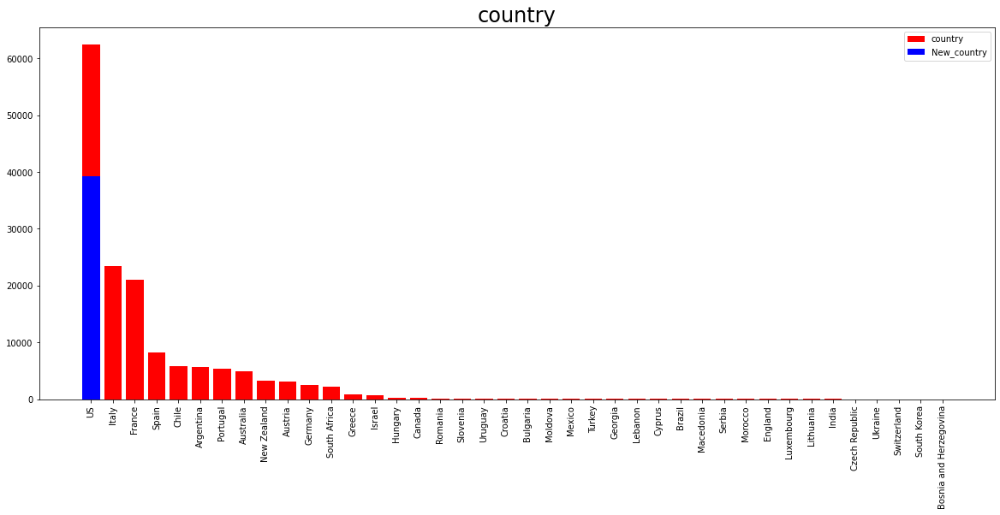

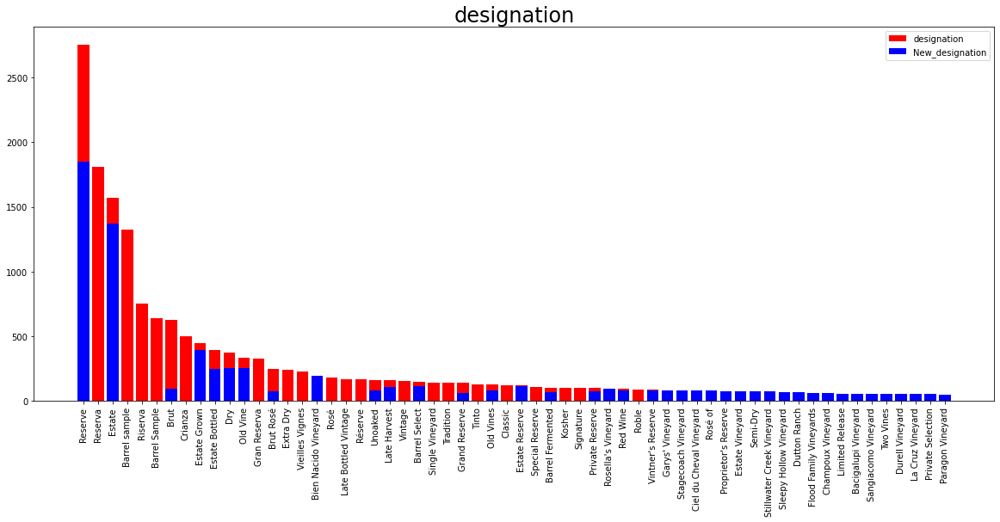

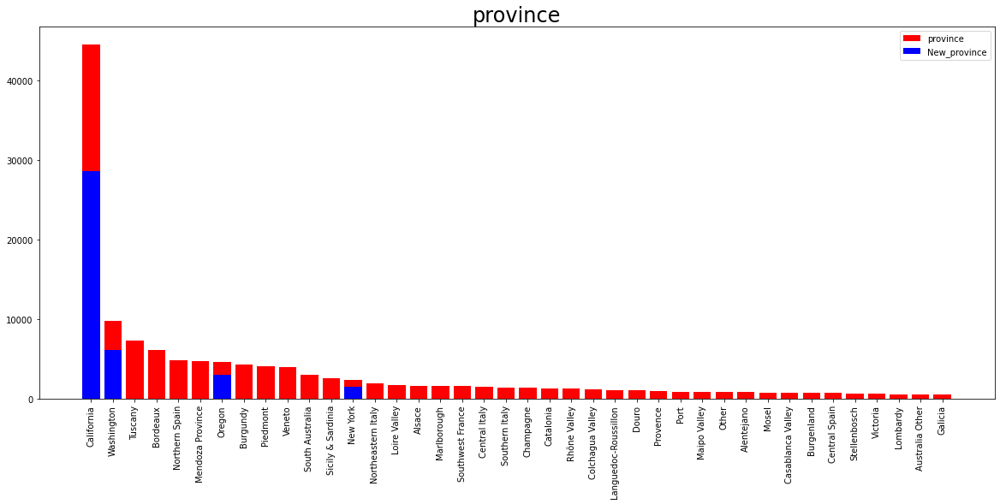

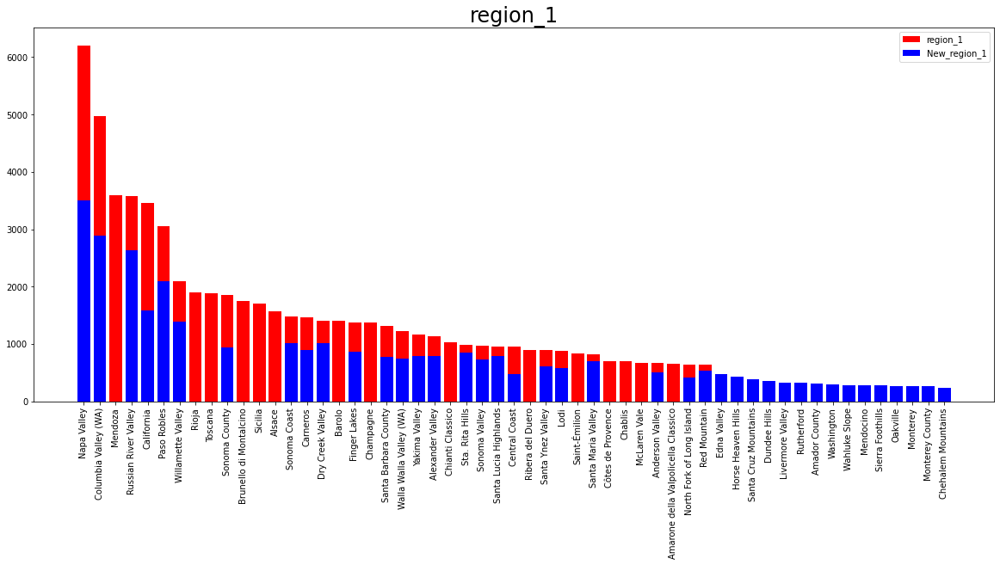

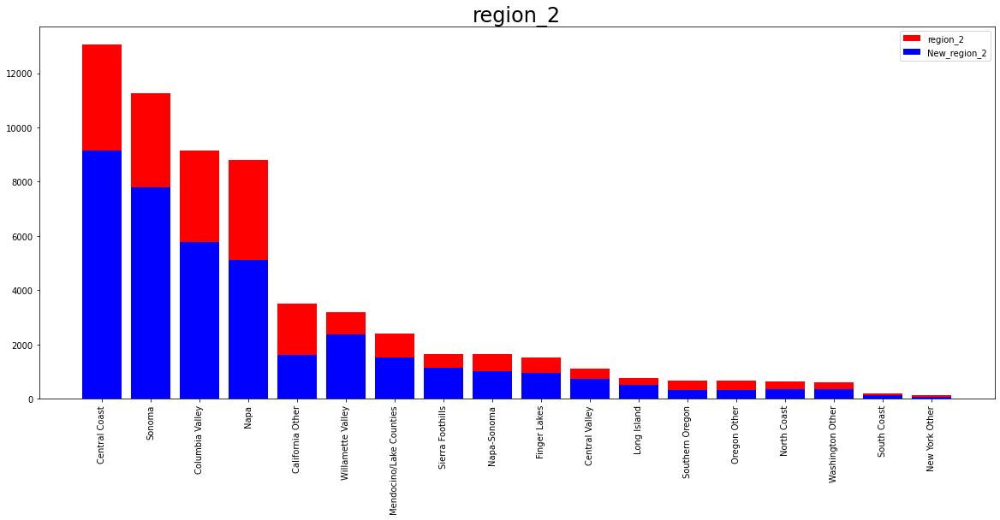

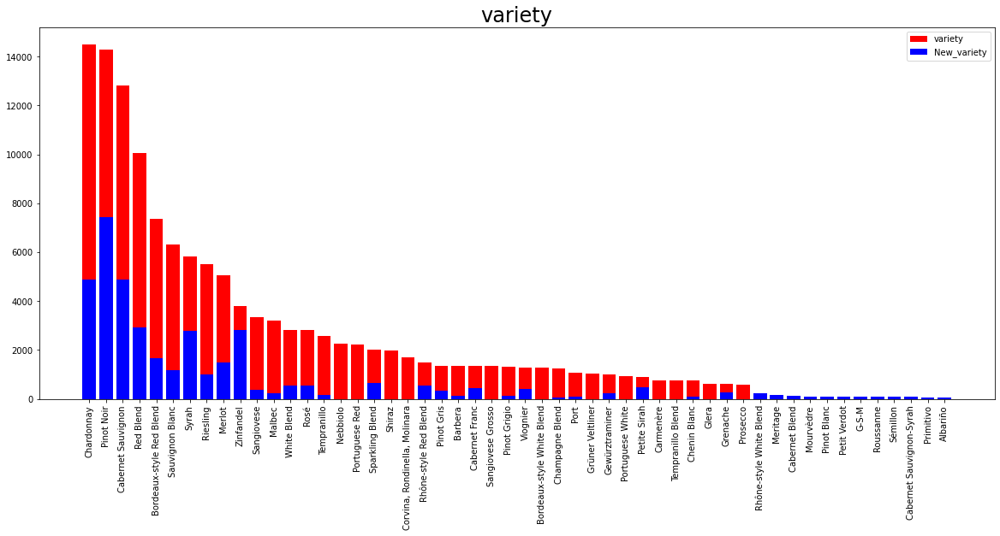

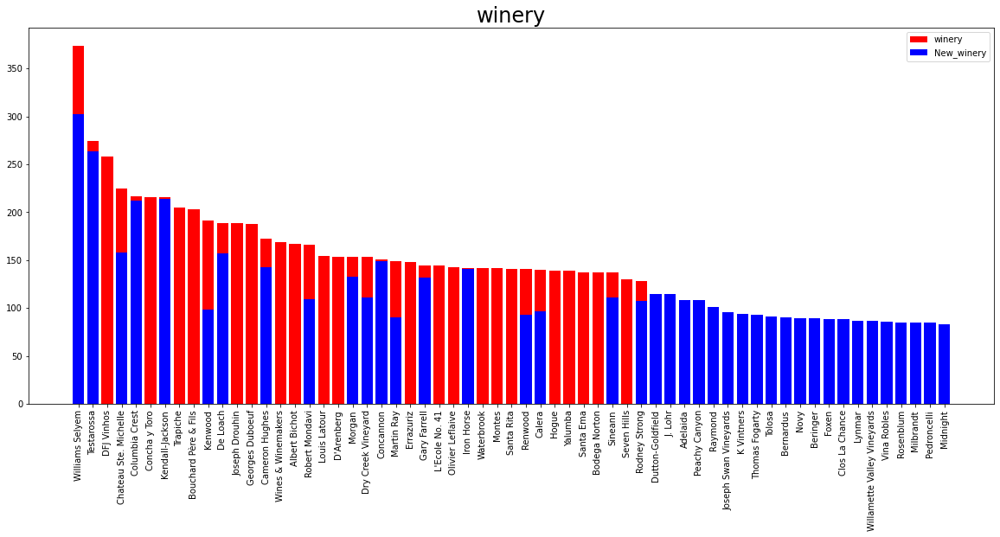

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 90.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 86.0000  Median: 88.0000  Q3: 91.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 16.0000  Median: 24.0000  Q3(75%): 40.0000  Max: 2300.0000
Missing_counts: 13695
price_new:
Min: 4.0000  Q1: 22.0000  Median: 32.0000  Q3: 45.0000  Max: 2013.0000



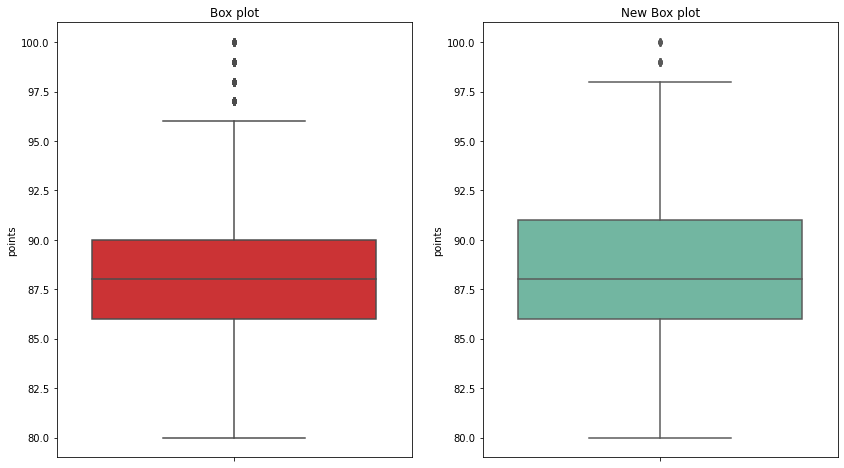

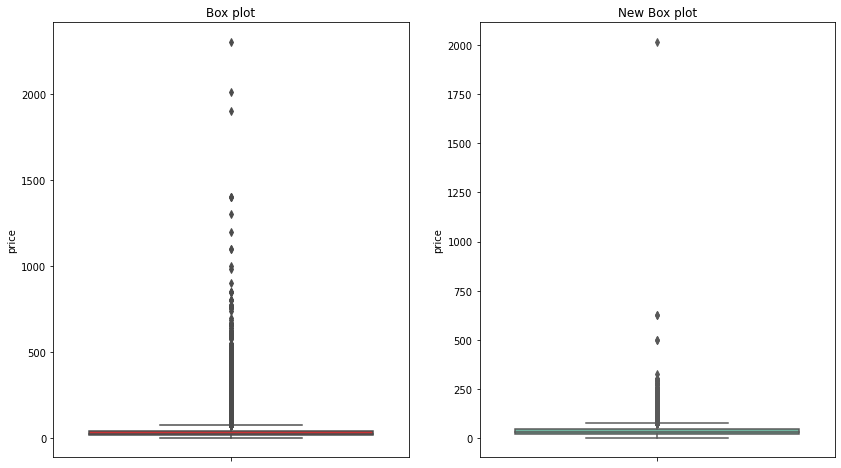

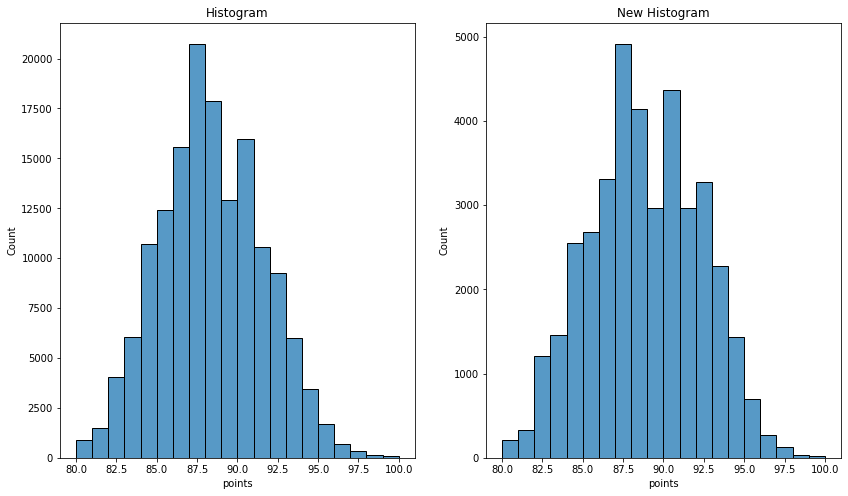

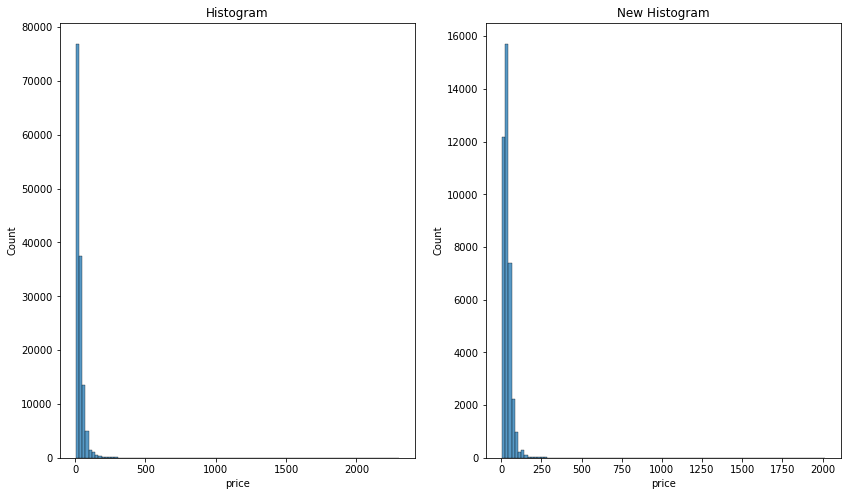

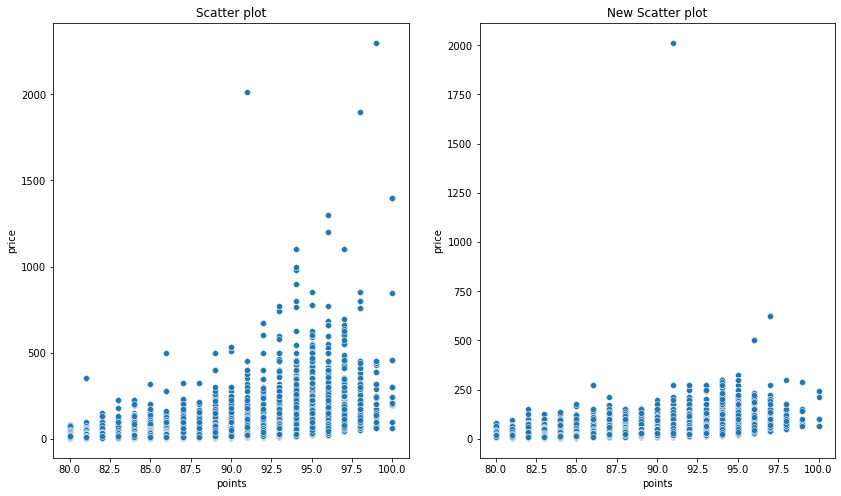

In [61]:
# 将缺失值剔除
df2_new1 = drop_Nan(data_frame2)
nominal_display(df=data_frame2,df_new=df2_new1,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame2,df_new=df2_new1,numerical_attr=numerical_attr)
box_plot(df=data_frame2,label='points',df_new=df2_new1)
box_plot(df=data_frame2,label='price',df_new=df2_new1)
hist_plot(df=data_frame2,df_new=df2_new1,label = 'points',bin_nums=20)
hist_plot(df=data_frame2,df_new=df2_new1,label = 'price',bin_nums=100)
scatter_plot(df=data_frame2,df_new=df2_new1,xlabel='points',ylabel='price')

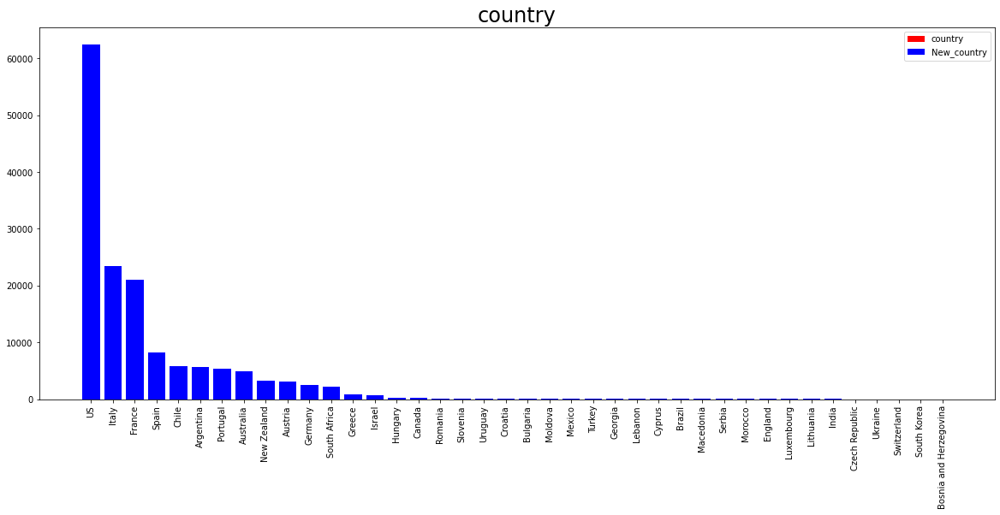

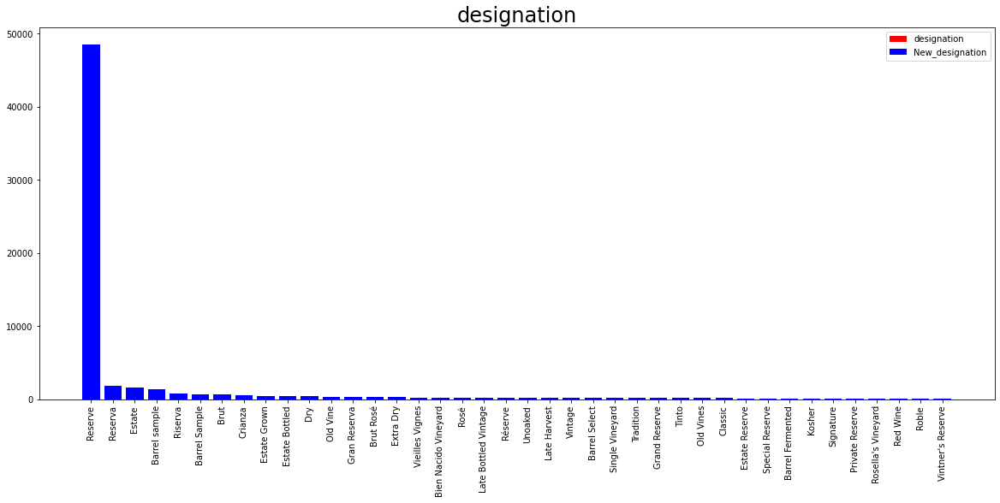

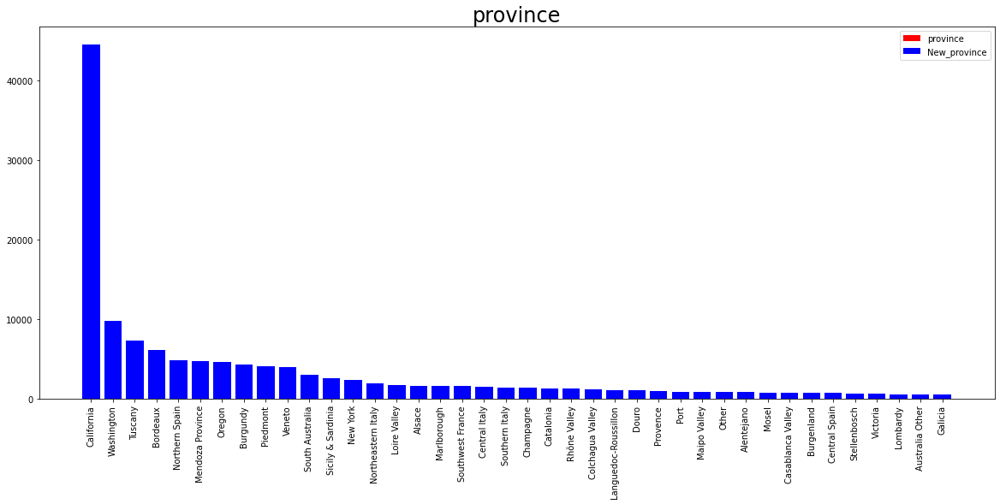

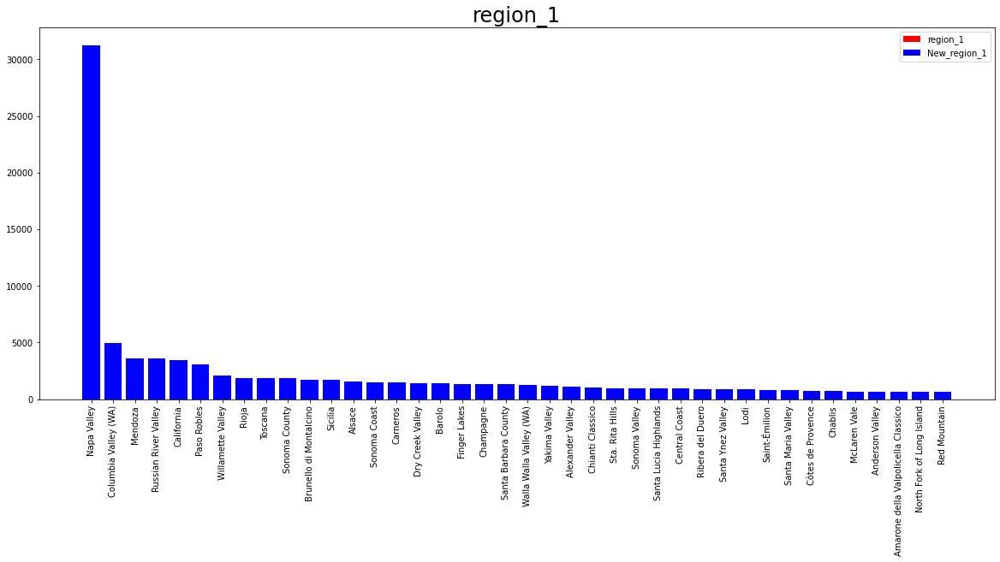

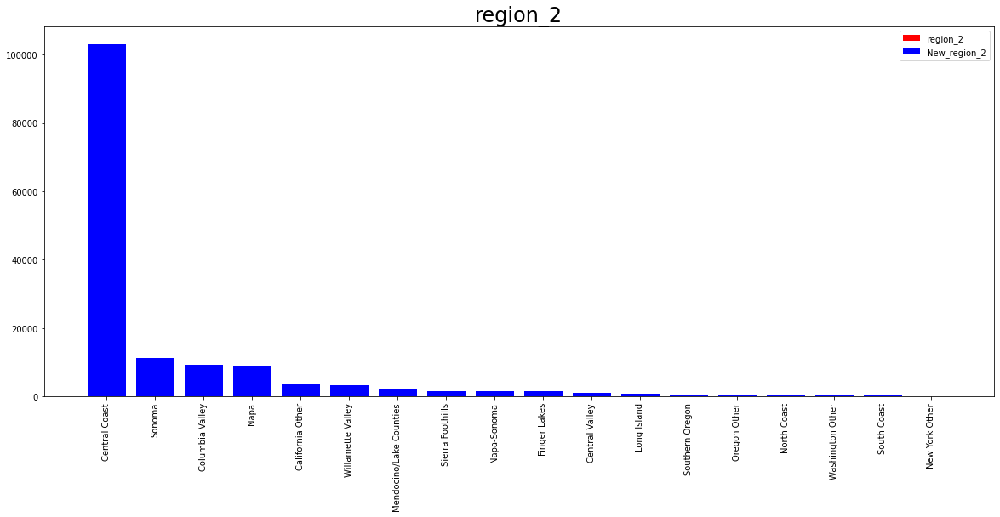

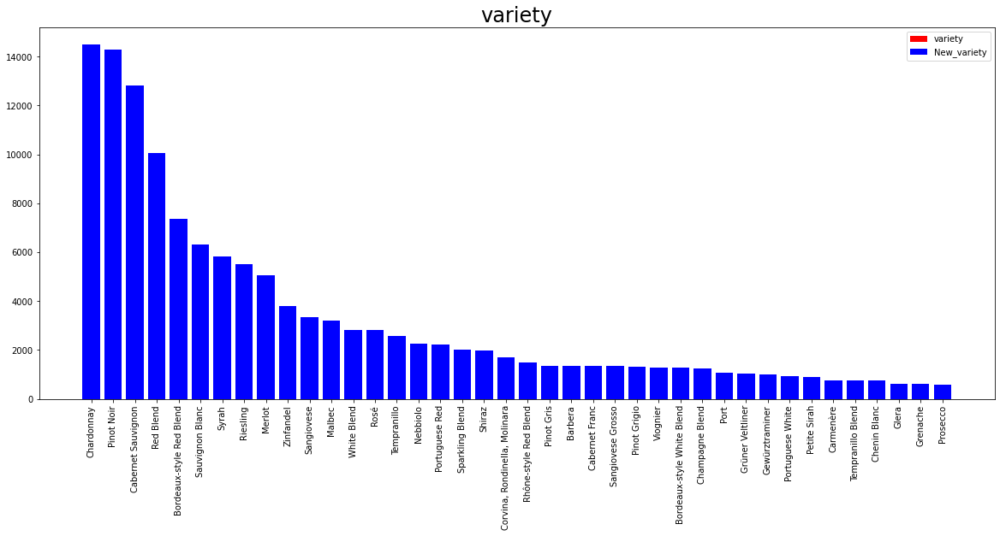

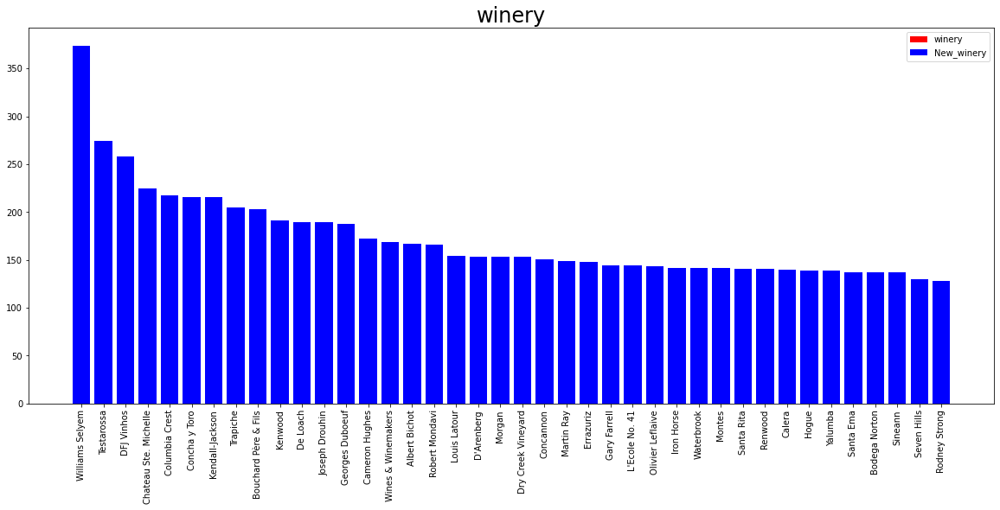

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 90.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 86.0000  Median: 88.0000  Q3: 90.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 16.0000  Median: 24.0000  Q3(75%): 40.0000  Max: 2300.0000
Missing_counts: 13695
price_new:
Min: 4.0000  Q1: 16.0000  Median: 22.0000  Q3: 38.0000  Max: 2300.0000



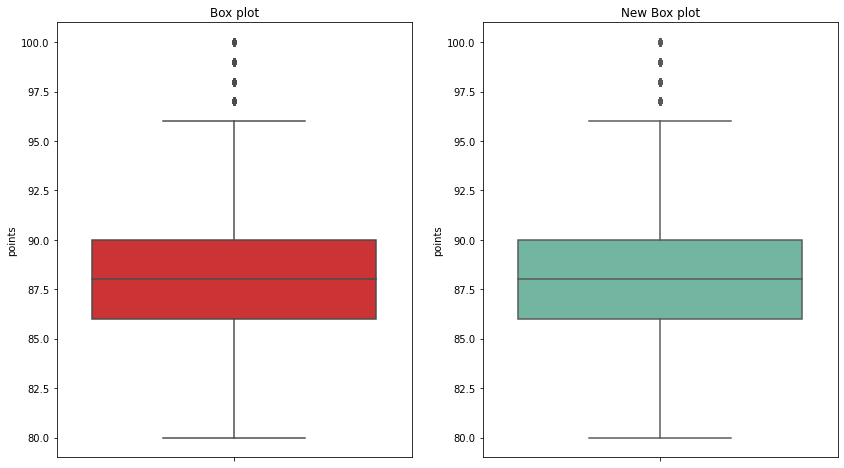

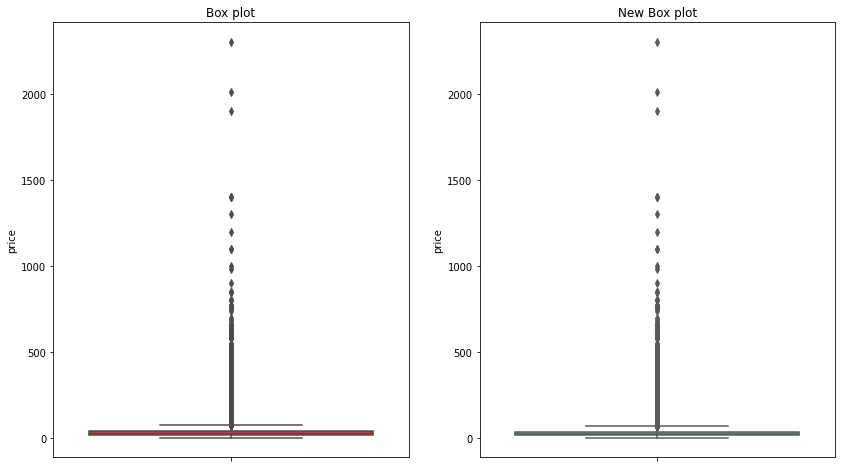

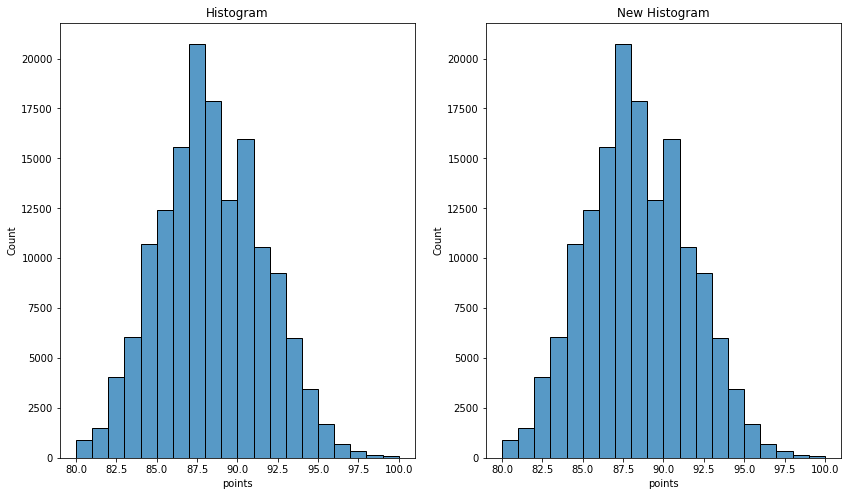

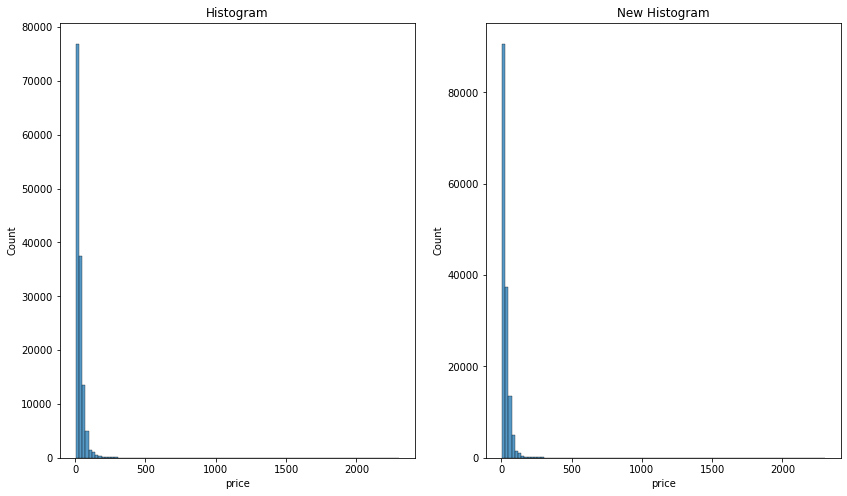

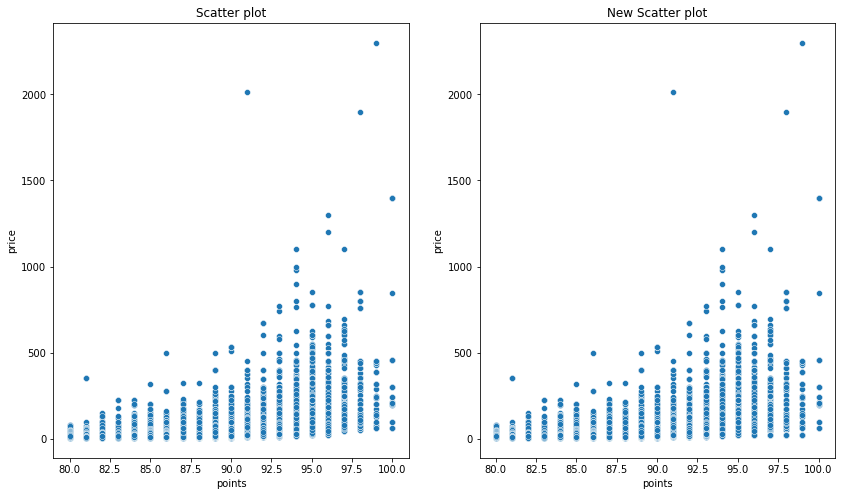

In [62]:
# 用最高频率值来填补缺失值
df2_new2 = fill_mode_for_Nan(data_frame2)
nominal_display(df=data_frame2,df_new=df2_new2,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame2,df_new=df2_new2,numerical_attr=numerical_attr)
box_plot(df=data_frame2,label='points',df_new=df2_new2)
box_plot(df=data_frame2,label='price',df_new=df2_new2)
hist_plot(df=data_frame2,df_new=df2_new2,label = 'points',bin_nums=20)
hist_plot(df=data_frame2,df_new=df2_new2,label = 'price',bin_nums=100)
scatter_plot(df=data_frame2,df_new=df2_new2,xlabel='points',ylabel='price')

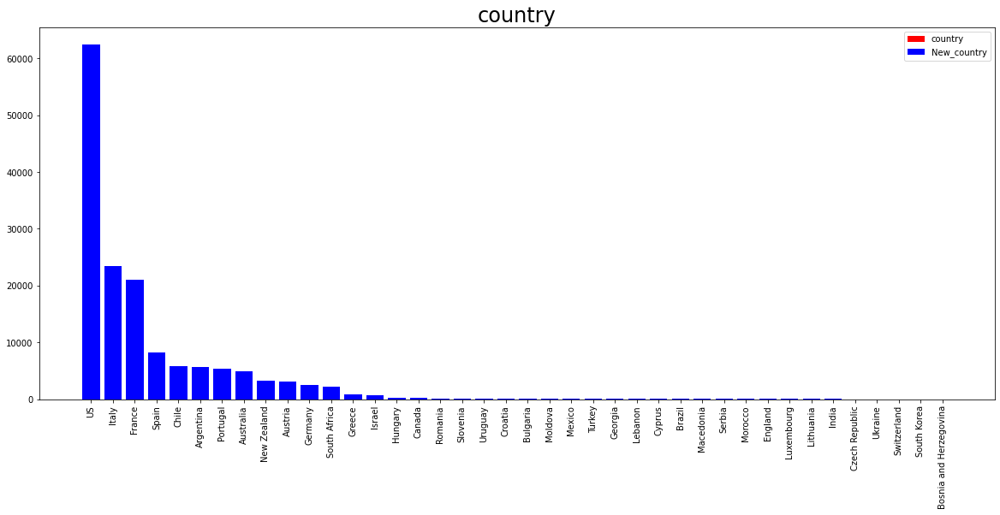

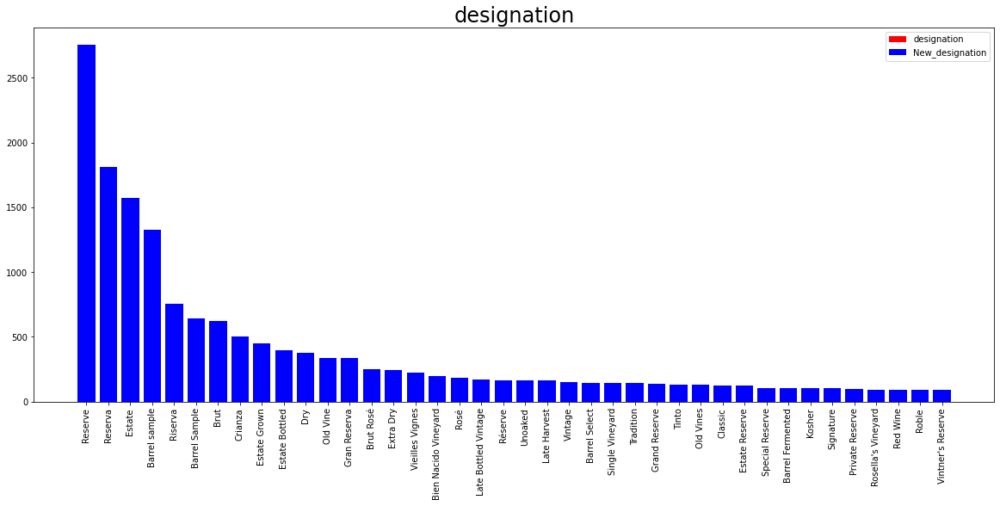

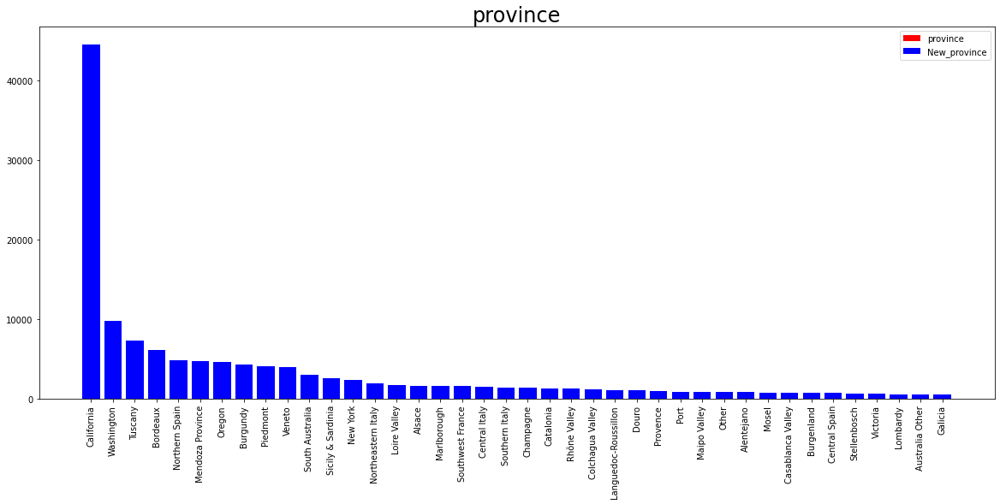

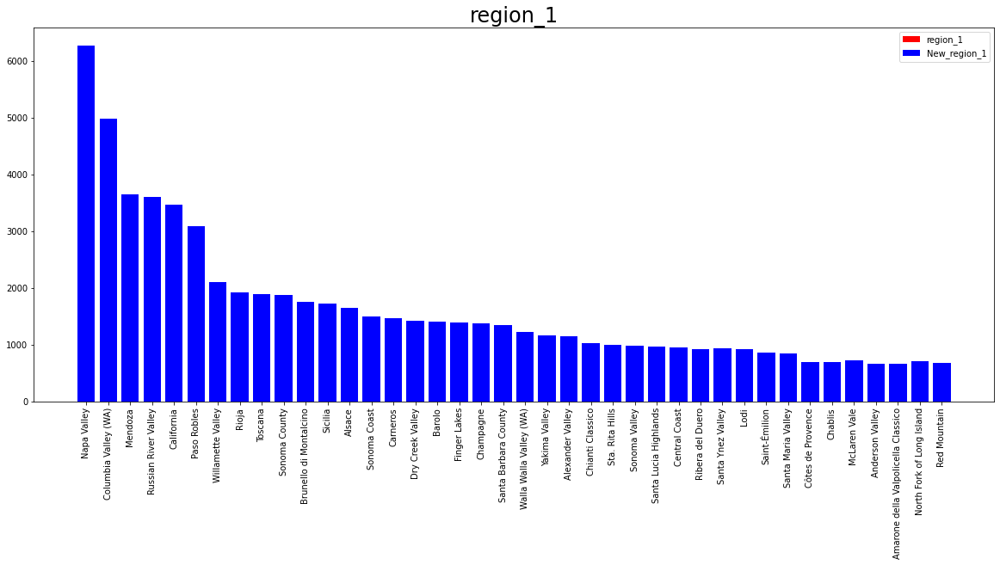

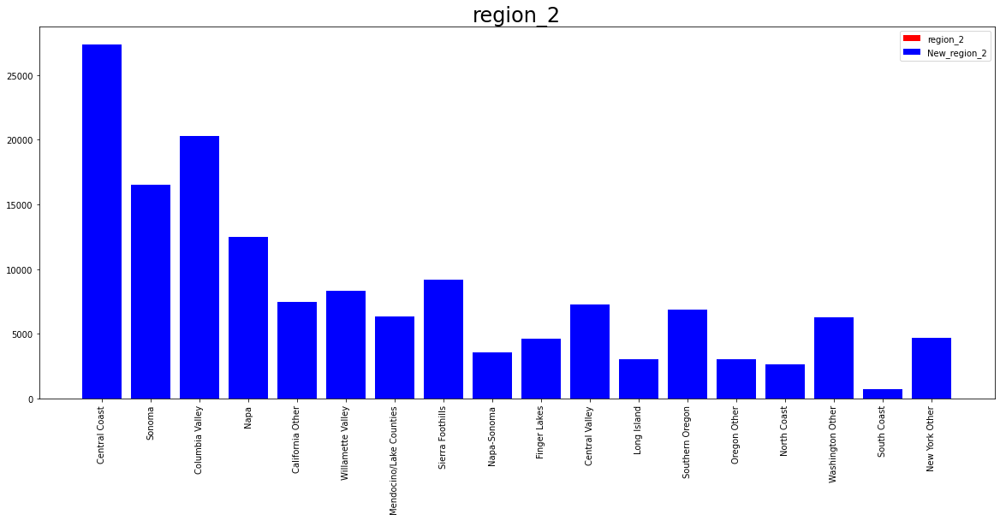

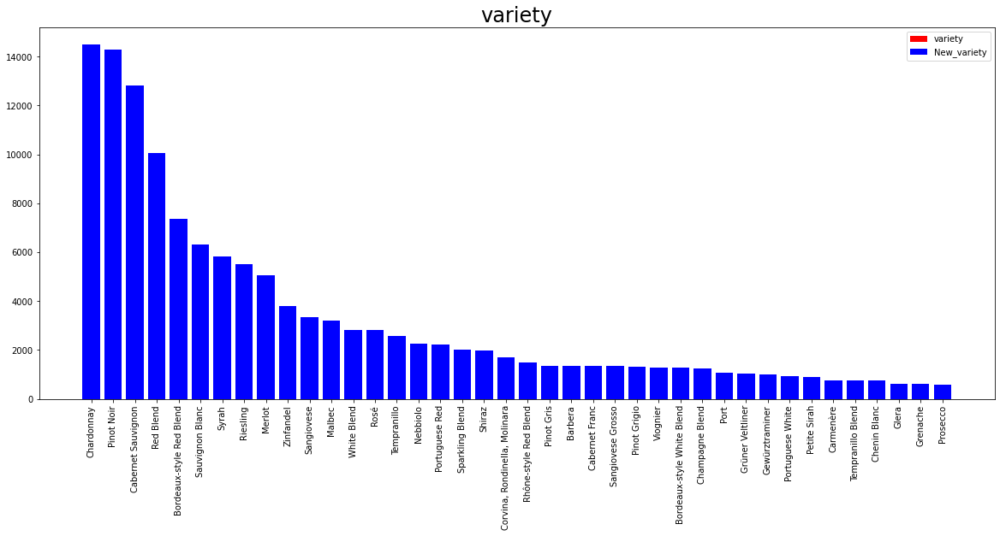

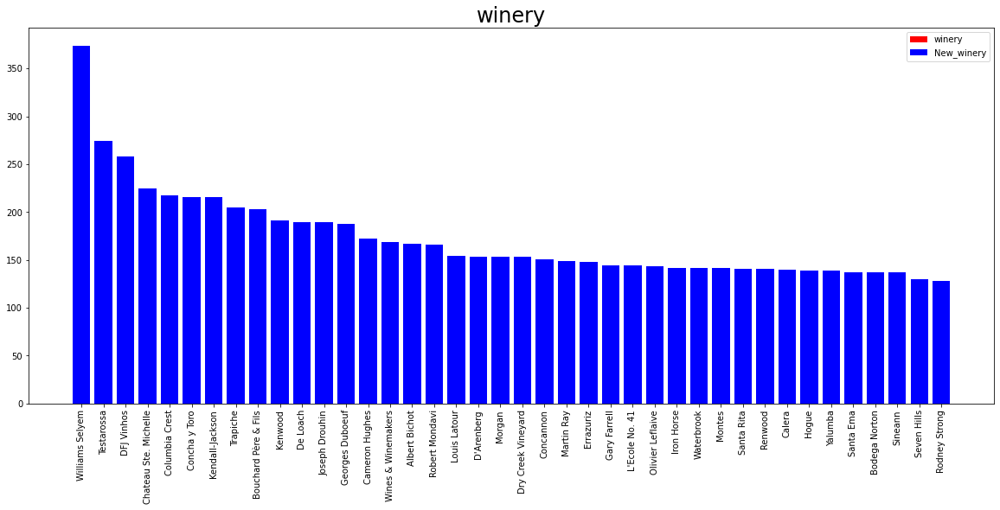

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 90.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 86.0000  Median: 88.0000  Q3: 90.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 16.0000  Median: 24.0000  Q3(75%): 40.0000  Max: 2300.0000
Missing_counts: 13695
price_new:
Min: 4.0000  Q1: 16.0000  Median: 25.0000  Q3: 40.0000  Max: 2300.0000



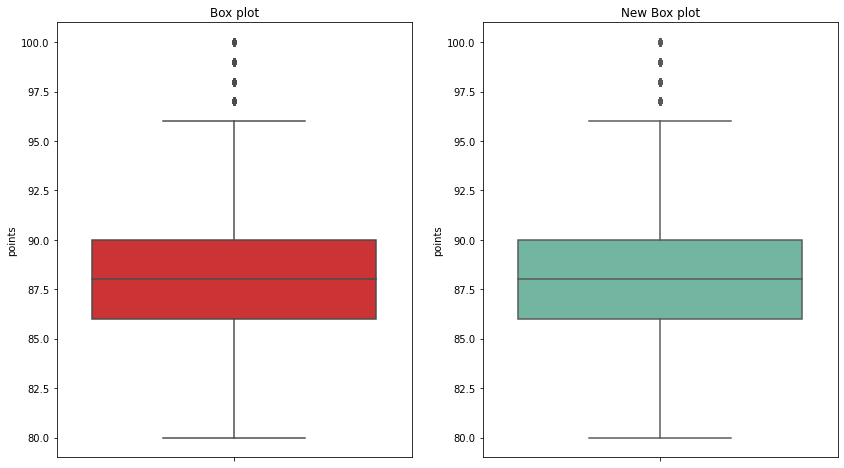

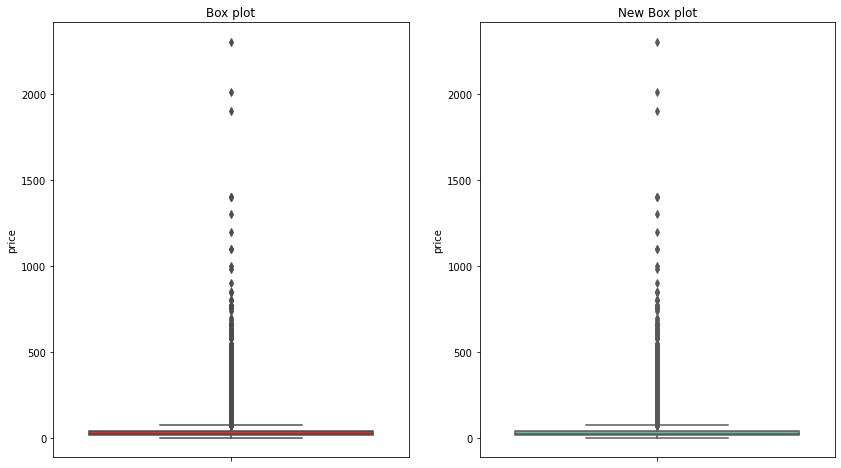

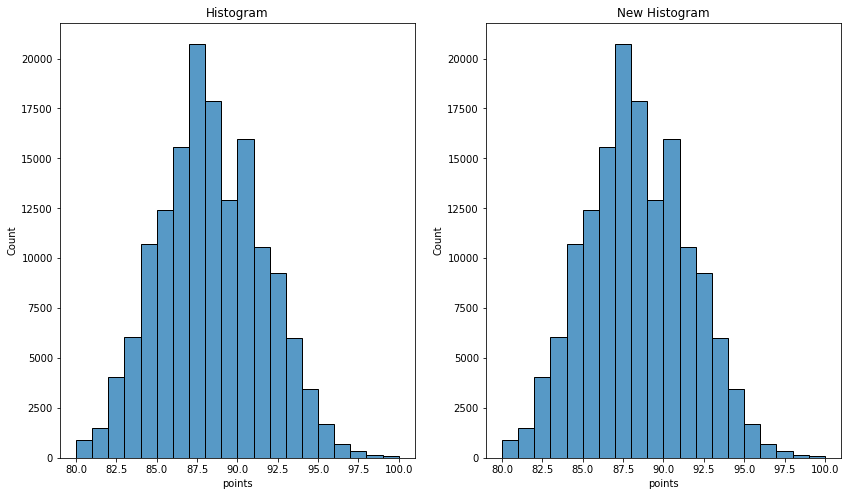

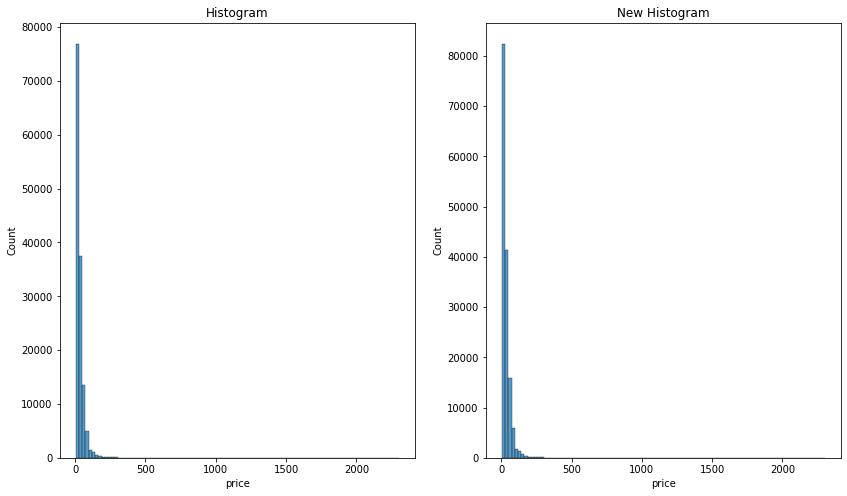

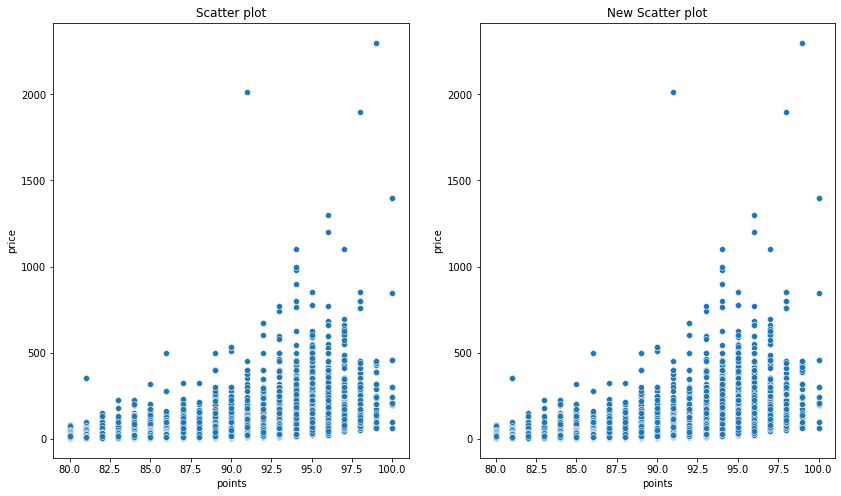

In [63]:
# 通过属性的相关关系来填补缺失值
miss_attr=['country','designation','price','province','region_1','region_2']
complete_attr=['description','points','variety','winery']
df2_new3 = fill_attr_corr(data_frame2,miss_attr=miss_attr,complete_attr=complete_attr)
nominal_display(df=data_frame2,df_new=df2_new3,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame2,df_new=df2_new3,numerical_attr=numerical_attr)
box_plot(df=data_frame2,label='points',df_new=df2_new3)
box_plot(df=data_frame2,label='price',df_new=df2_new3)
hist_plot(df=data_frame2,df_new=df2_new3,label = 'points',bin_nums=20)
hist_plot(df=data_frame2,df_new=df2_new3,label = 'price',bin_nums=100)
scatter_plot(df=data_frame2,df_new=df2_new3,xlabel='points',ylabel='price')

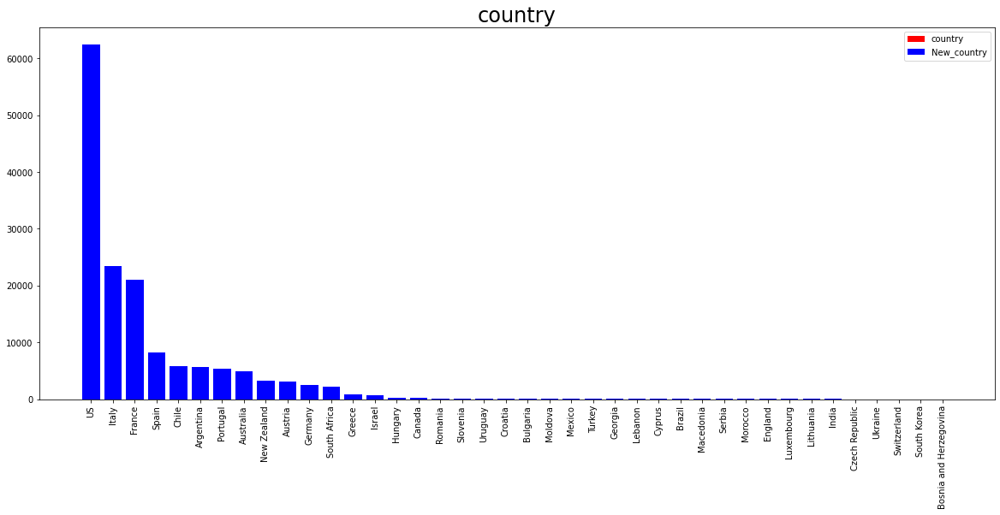

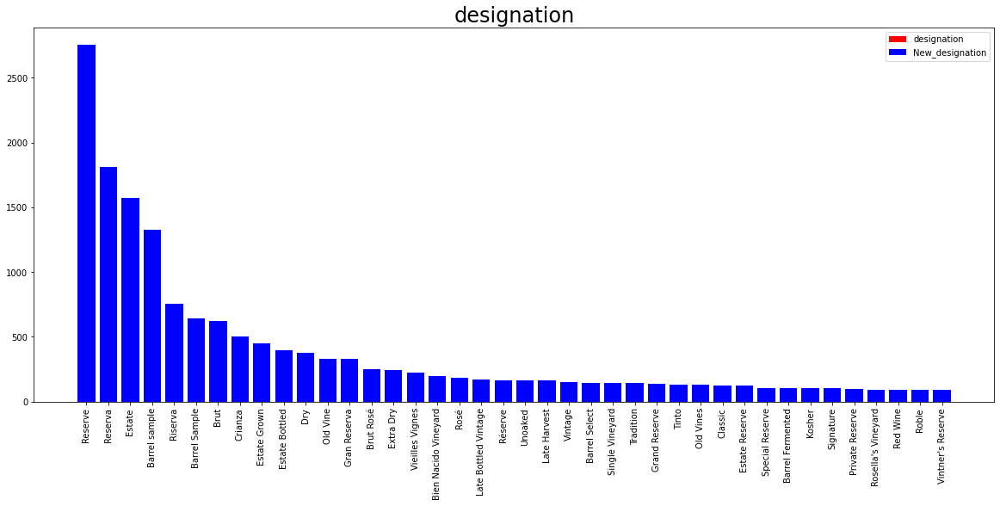

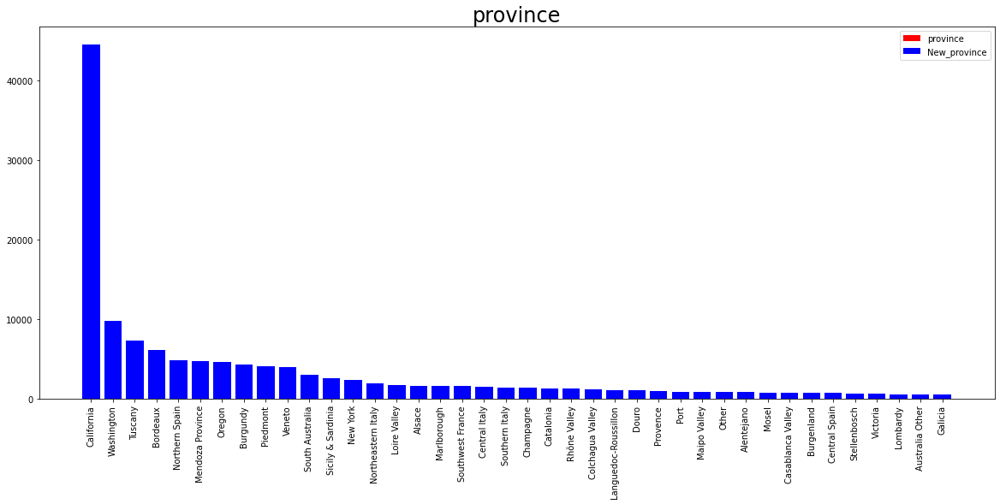

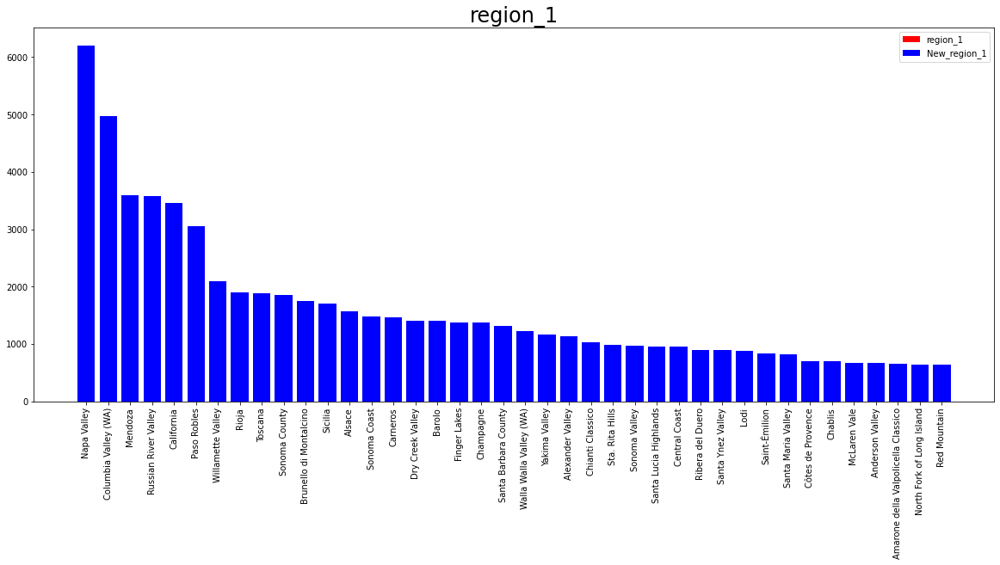

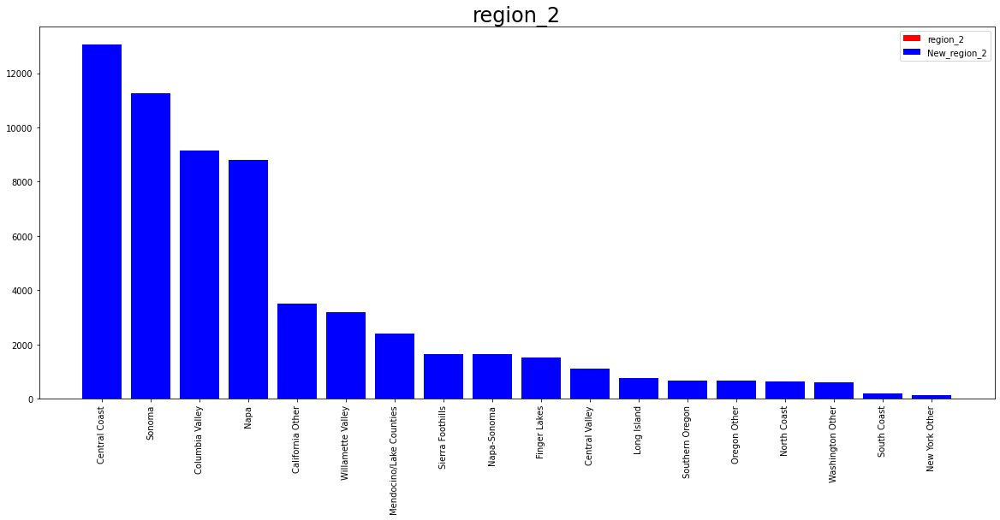

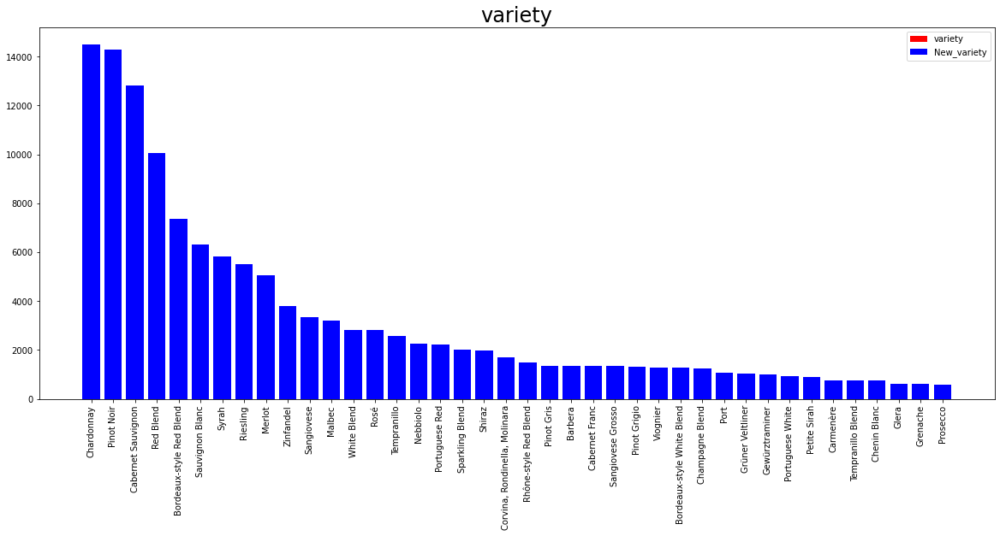

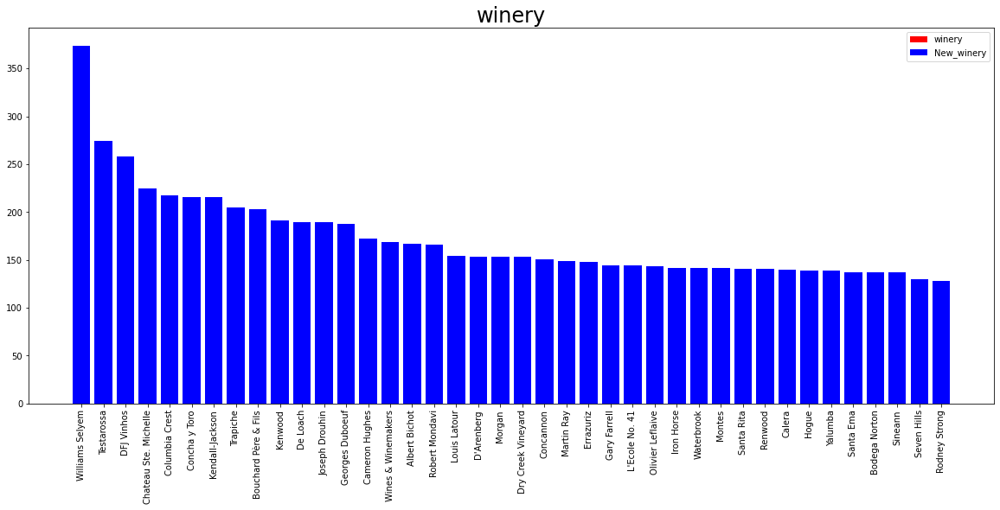

points:
Min: 80.0000  Q1(25%): 86.0000  Median: 88.0000  Q3(75%): 90.0000  Max: 100.0000
Missing_counts: 0
points_new:
Min: 80.0000  Q1: 86.0000  Median: 88.0000  Q3: 90.0000  Max: 100.0000

price:
Min: 4.0000  Q1(25%): 16.0000  Median: 24.0000  Q3(75%): 40.0000  Max: 2300.0000
Missing_counts: 13695
price_new:
Min: 4.0000  Q1: 16.0000  Median: 25.0000  Q3: 40.0000  Max: 2300.0000



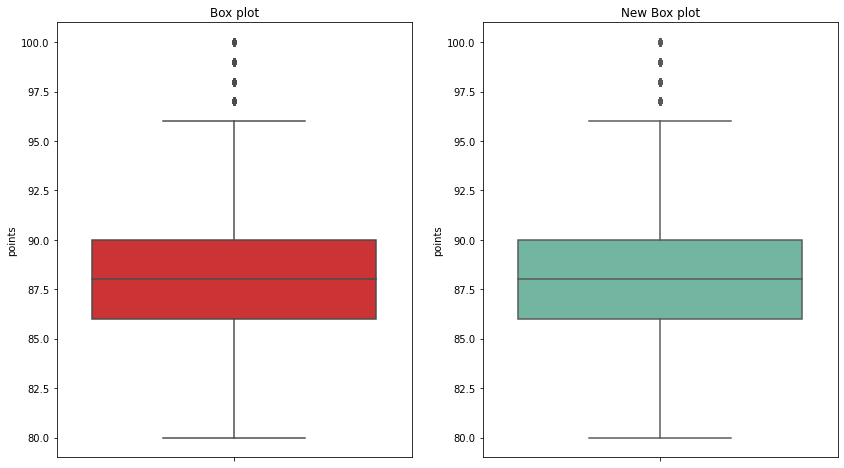

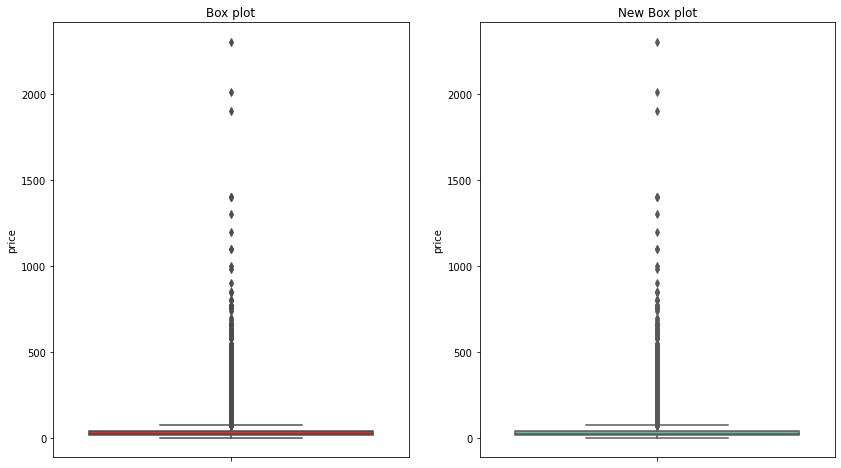

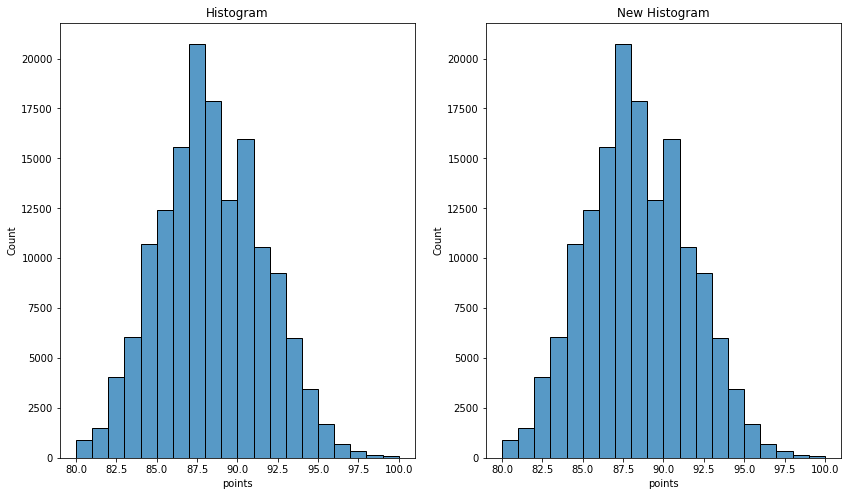

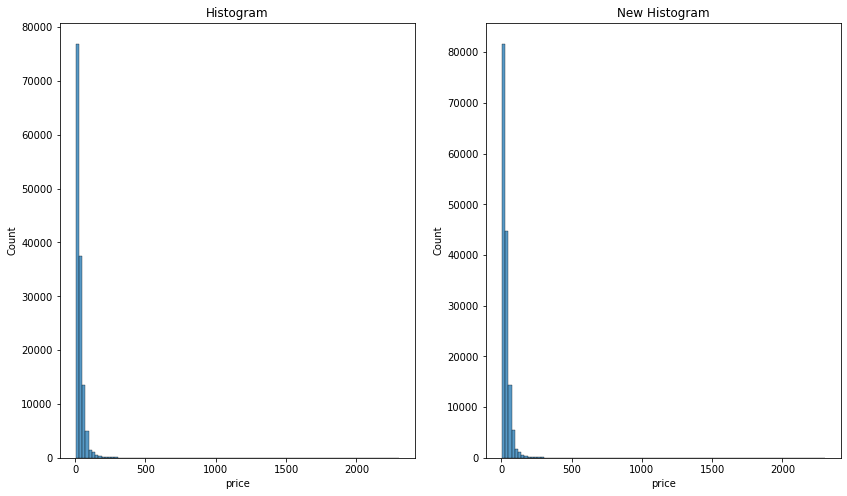

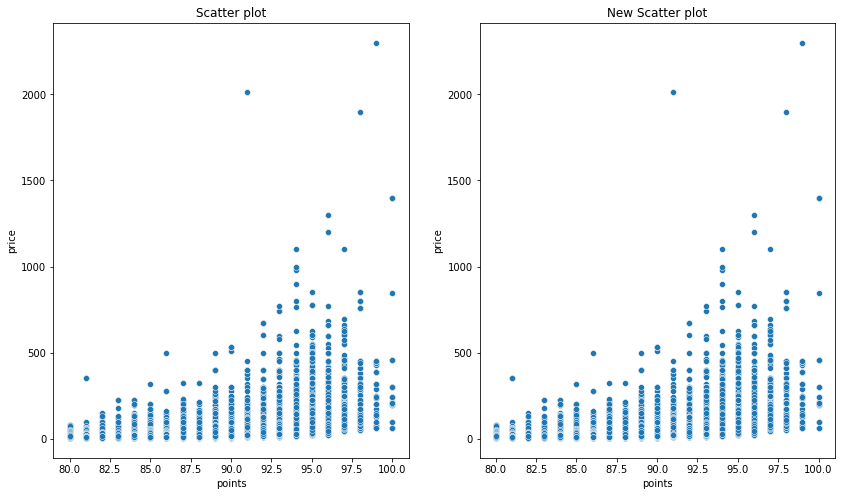

In [64]:
# 通过数据对象之间的相似性来填补缺失值
df2_new4 = correlation_fill(data_frame2,numerical_attr=numerical_attr,n_neighbors=20)
nominal_display(df=data_frame2,df_new=df2_new4,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame2,df_new=df2_new4,numerical_attr=numerical_attr)
box_plot(df=data_frame2,label='points',df_new=df2_new4)
box_plot(df=data_frame2,label='price',df_new=df2_new4)
hist_plot(df=data_frame2,df_new=df2_new4,label = 'points',bin_nums=20)
hist_plot(df=data_frame2,df_new=df2_new4,label = 'price',bin_nums=100)
scatter_plot(df=data_frame2,df_new=df2_new4,xlabel='points',ylabel='price')

### 数据集2: Chicago Building Violations:
- building-violations.csv
#### building-violations.csv:

In [13]:
data_frame3 = pd.read_csv("Chicago Building Violations/building-violations.csv")
# 展示列属性
columns_info(df=data_frame3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1677788 entries, 0 to 1677787
Data columns (total 32 columns):
 #   Column                        Non-Null Count    Dtype  
---  ------                        --------------    -----  
 0   ID                            1677788 non-null  int64  
 1   VIOLATION LAST MODIFIED DATE  1677788 non-null  object 
 2   VIOLATION DATE                1677788 non-null  object 
 3   VIOLATION CODE                1677788 non-null  object 
 4   VIOLATION STATUS              1677788 non-null  object 
 5   VIOLATION STATUS DATE         641589 non-null   object 
 6   VIOLATION DESCRIPTION         1667020 non-null  object 
 7   VIOLATION LOCATION            780506 non-null   object 
 8   VIOLATION INSPECTOR COMMENTS  1502325 non-null  object 
 9   VIOLATION ORDINANCE           1630207 non-null  object 
 10  INSPECTOR ID                  1677788 non-null  object 
 11  INSPECTION NUMBER             1677788 non-null  int64  
 12  INSPECTION STATUS           

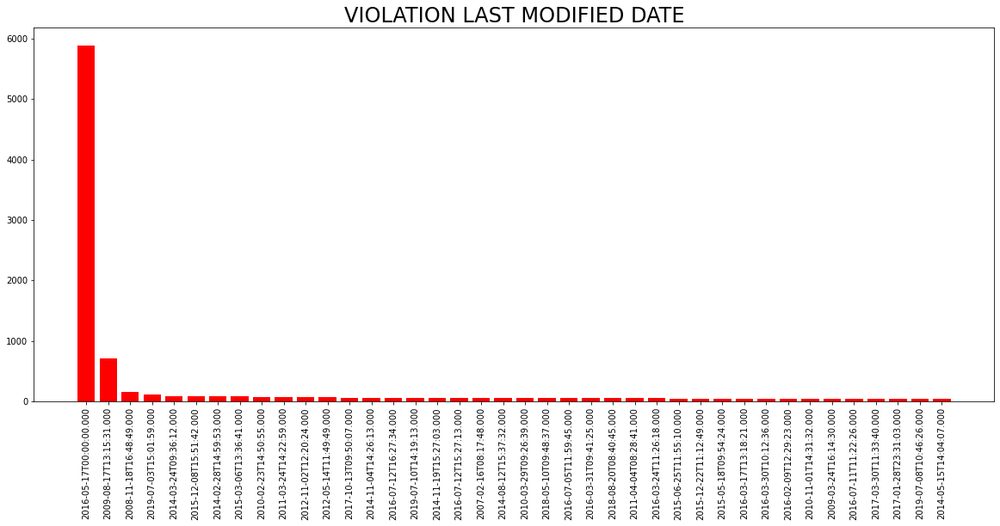

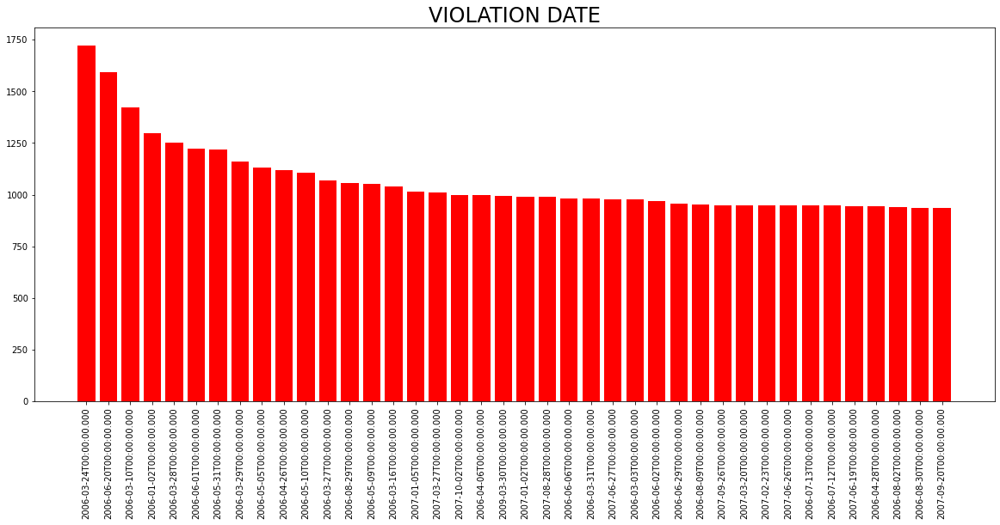

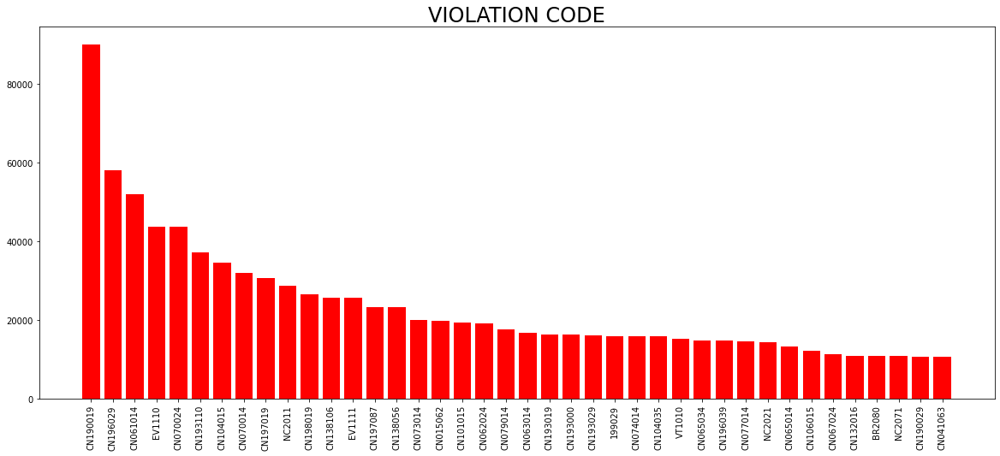

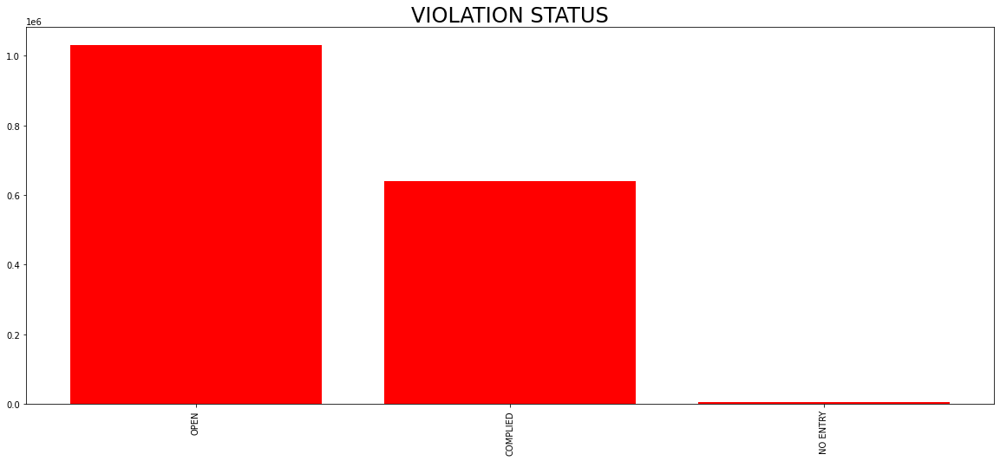

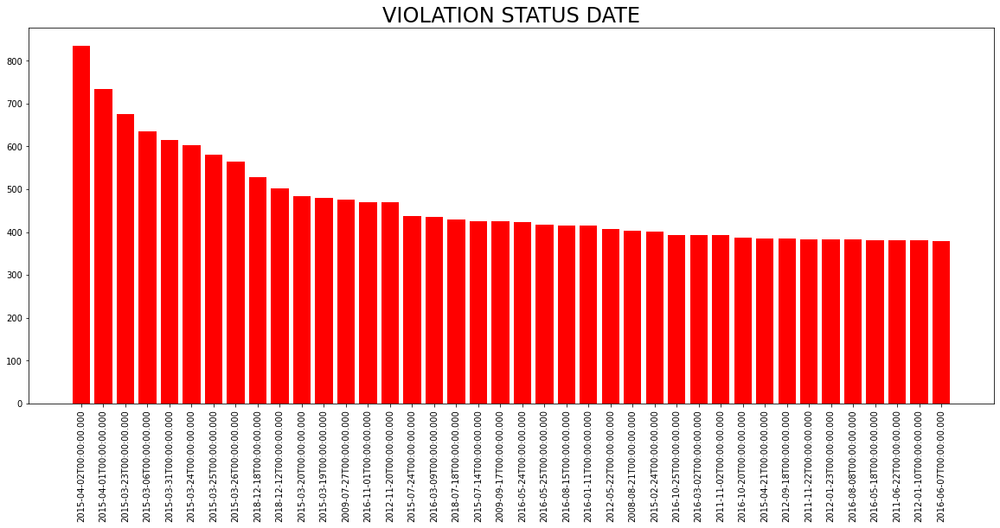

...

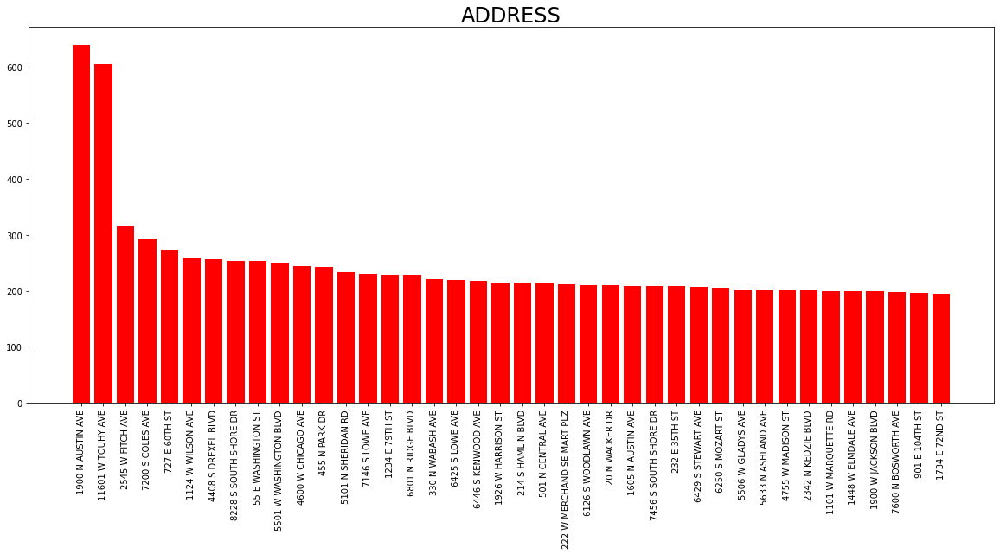

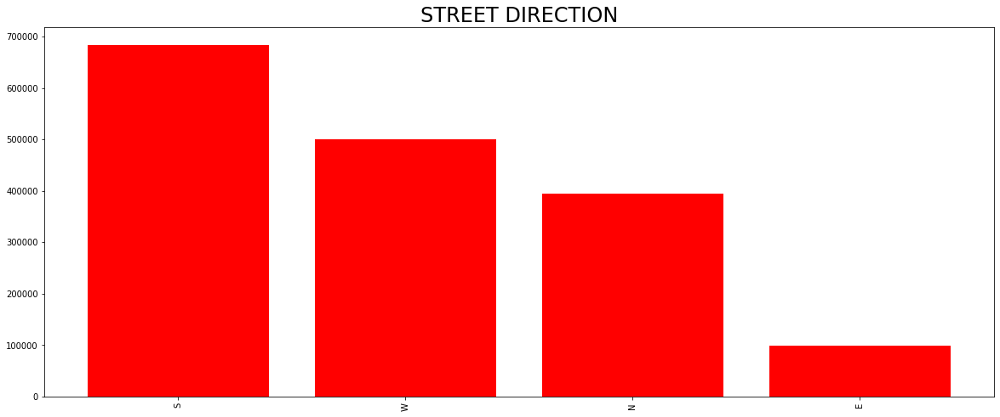

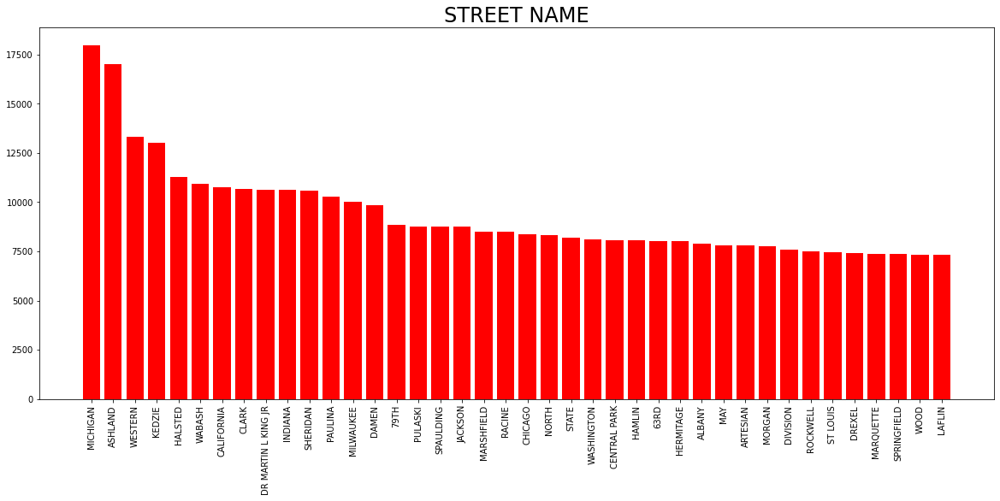

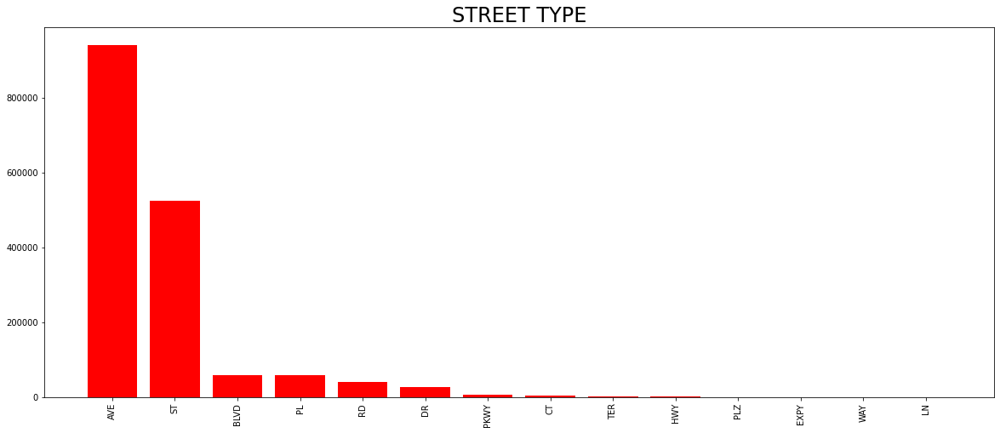

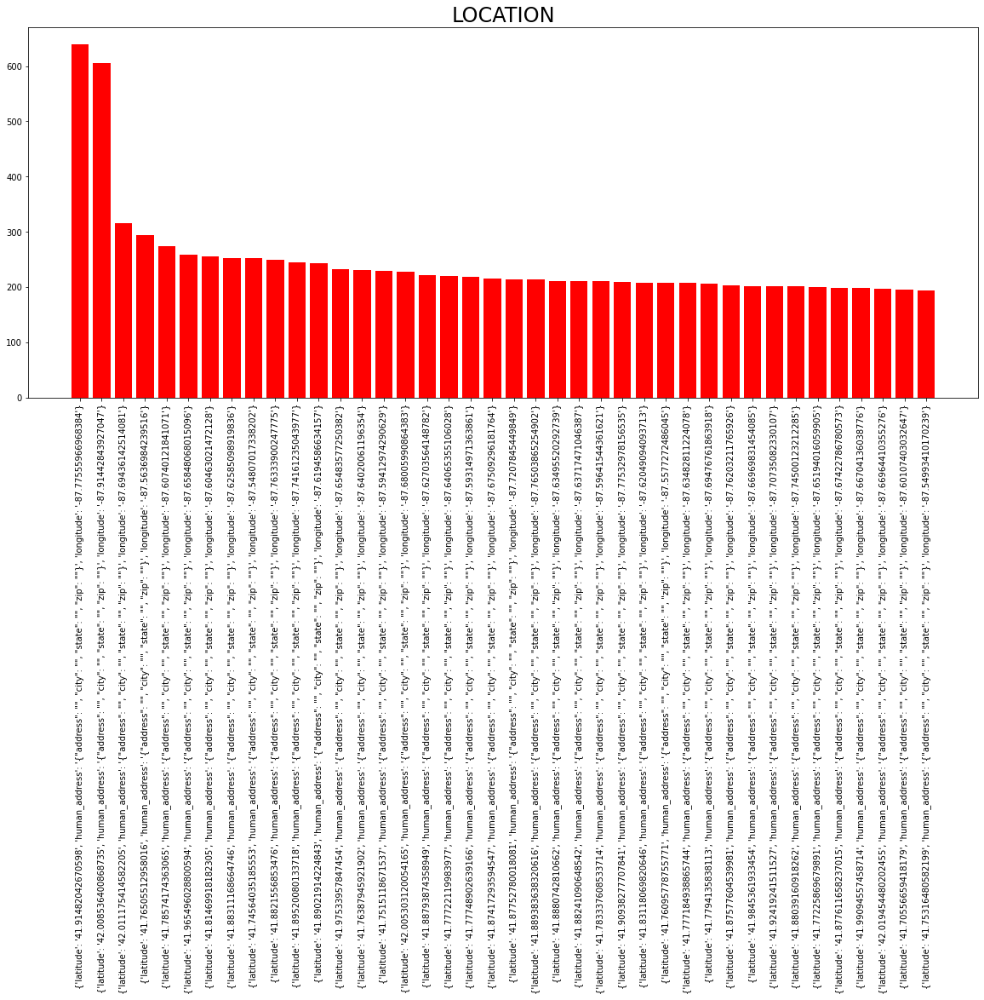

ID:
Min: 219970.0000  Q1(25%): 2838311.7500  Median: 4168119.5000  Q3(75%): 5320395.2500  Max: 6392508.0000
Missing_counts: 0

INSPECTION NUMBER:
Min: 265575.0000  Q1(25%): 2304416.0000  Median: 10418746.0000  Q3(75%): 11687280.0000  Max: 13050915.0000
Missing_counts: 0

STREET NUMBER:
Min: 1.0000  Q1(25%): 1648.0000  Median: 3747.0000  Q3(75%): 6228.0000  Max: 13770.0000
Missing_counts: 0

PROPERTY GROUP:
Min: 1000.0000  Q1(25%): 20560.0000  Median: 154323.0000  Q3(75%): 366984.0000  Max: 677975.0000
Missing_counts: 0

SSA:
Min: 1.0000  Q1(25%): 22.0000  Median: 34.0000  Q3(75%): 49.0000  Max: 69.0000
Missing_counts: 1356267

LATITUDE:
Min: 41.6447  Q1(25%): 41.7709  Median: 41.8540  Q3(75%): 41.9135  Max: 42.0227
Missing_counts: 1510

LONGITUDE:
Min: -87.9144  Q1(25%): -87.7139  Median: -87.6699  Q3(75%): -87.6329  Max: -87.5247
Missing_counts: 1510

Community Areas:
Min: 1.0000  Q1(25%): 24.0000  Median: 36.0000  Q3(75%): 58.0000  Max: 77.0000
Missing_counts: 2279

Zip Codes:
Min: 4

/var/folders/3n/bnxfvqwj6f31qqcdrm4gdgvw0000gn/T/ipykernel_46479/3079055154.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(9,6))


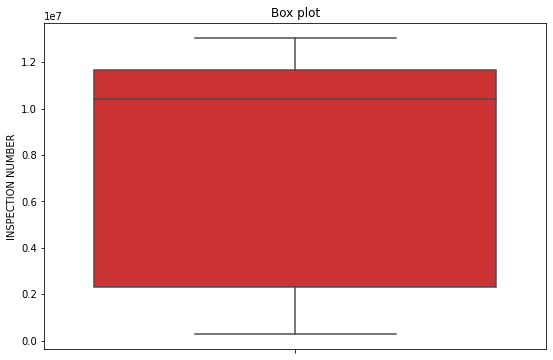

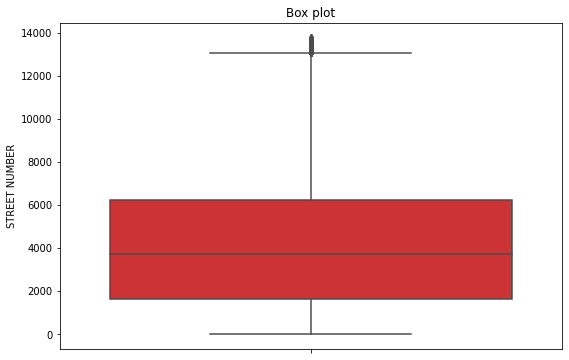

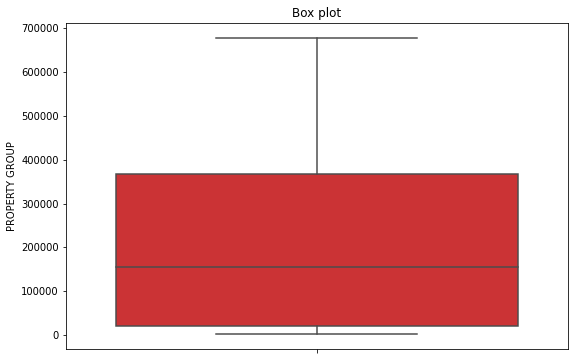

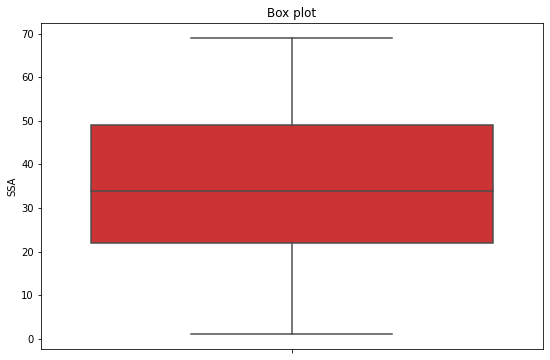

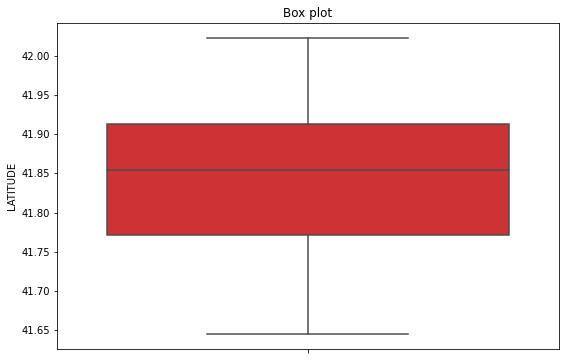

...

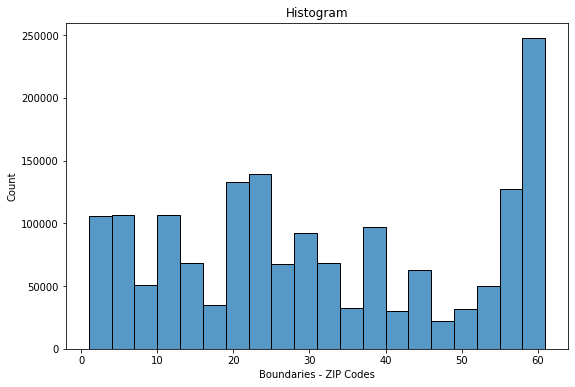

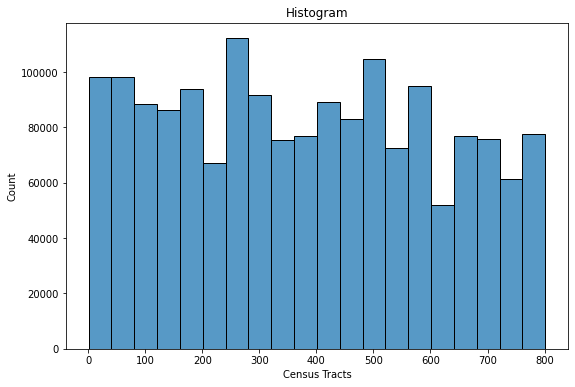

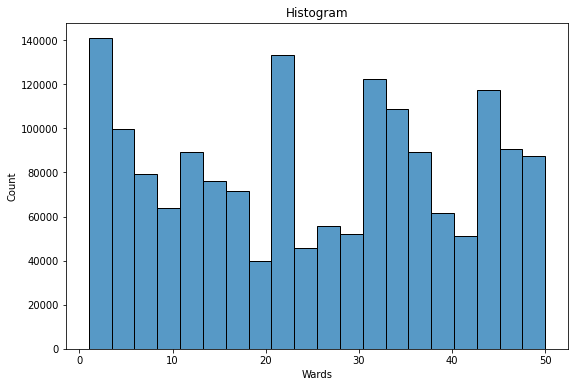

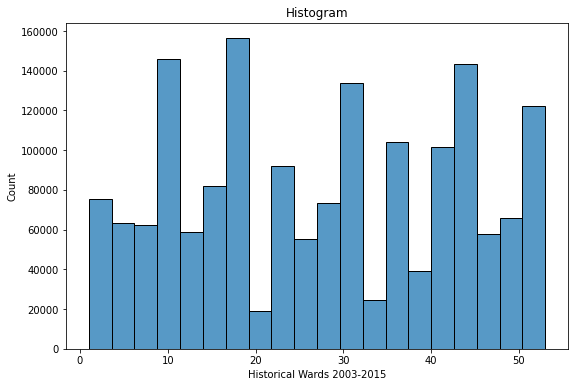

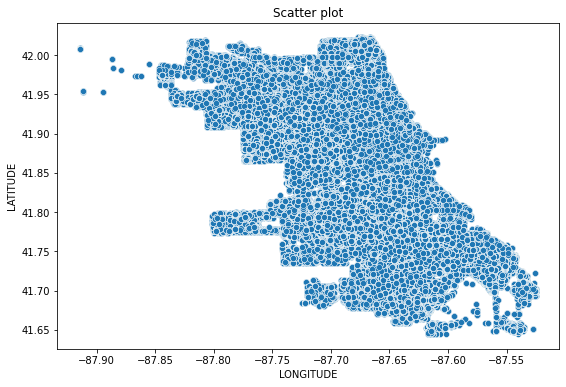

In [19]:
# Nominal attribute
nominal_attr = ['VIOLATION LAST MODIFIED DATE', 'VIOLATION DATE', 'VIOLATION CODE', 'VIOLATION STATUS', 'VIOLATION STATUS DATE', 'VIOLATION DESCRIPTION', 'VIOLATION LOCATION','VIOLATION INSPECTOR COMMENTS','VIOLATION ORDINANCE','INSPECTOR ID','INSPECTION STATUS','INSPECTION WAIVED','INSPECTION CATEGORY','DEPARTMENT BUREAU','ADDRESS','STREET DIRECTION','STREET NAME','STREET TYPE','LOCATION']
# Numerical attribute
numerical_attr = ['ID', 'INSPECTION NUMBER','STREET NUMBER','PROPERTY GROUP','SSA','LATITUDE','LONGITUDE','Community Areas','Zip Codes','Boundaries - ZIP Codes','Census Tracts','Wards','Historical Wards 2003-2015']
nominal_display(df=data_frame3,df_new=None,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame3,df_new=None,numerical_attr=numerical_attr)
box_plot(df=data_frame3,label='INSPECTION NUMBER',df_new=None)
box_plot(df=data_frame3,label='STREET NUMBER',df_new=None)
box_plot(df=data_frame3,label='PROPERTY GROUP',df_new=None)
box_plot(df=data_frame3,label='SSA',df_new=None)
box_plot(df=data_frame3,label='LATITUDE',df_new=None)
box_plot(df=data_frame3,label='LONGITUDE',df_new=None)
box_plot(df=data_frame3,label='Community Areas',df_new=None)
box_plot(df=data_frame3,label='Zip Codes',df_new=None)
box_plot(df=data_frame3,label='Boundaries - ZIP Codes',df_new=None)
box_plot(df=data_frame3,label='Census Tracts',df_new=None)
box_plot(df=data_frame3,label='Wards',df_new=None)
box_plot(df=data_frame3,label='Historical Wards 2003-2015',df_new=None)
hist_plot(df=data_frame3,df_new=None,label = 'INSPECTION NUMBER',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'STREET NUMBER',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'PROPERTY GROUP',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'SSA',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'LATITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'LONGITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'Community Areas',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'Zip Codes',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'Boundaries - ZIP Codes',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'Census Tracts',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'Wards',bin_nums=20)
hist_plot(df=data_frame3,df_new=None,label = 'Historical Wards 2003-2015',bin_nums=20)
scatter_plot(df=data_frame3,df_new=None,xlabel='LONGITUDE',ylabel='LATITUDE')

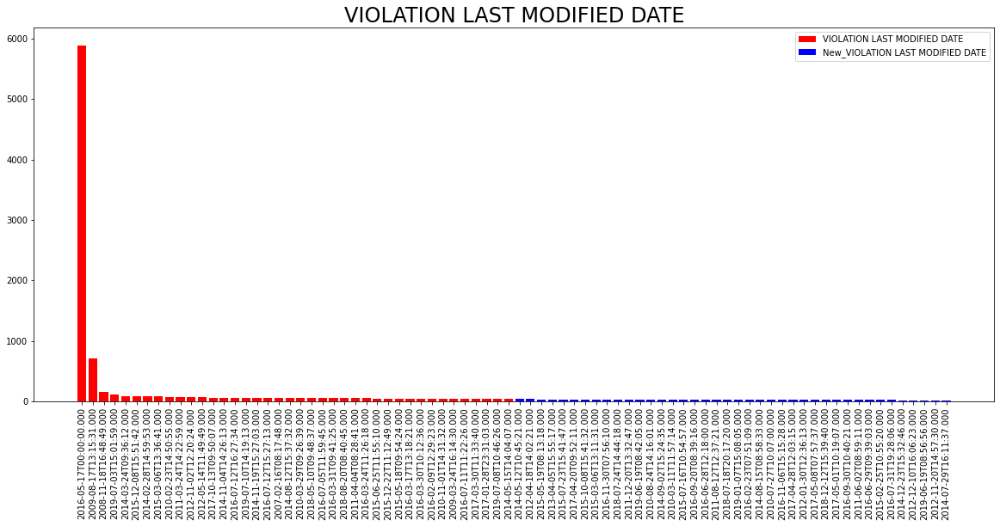

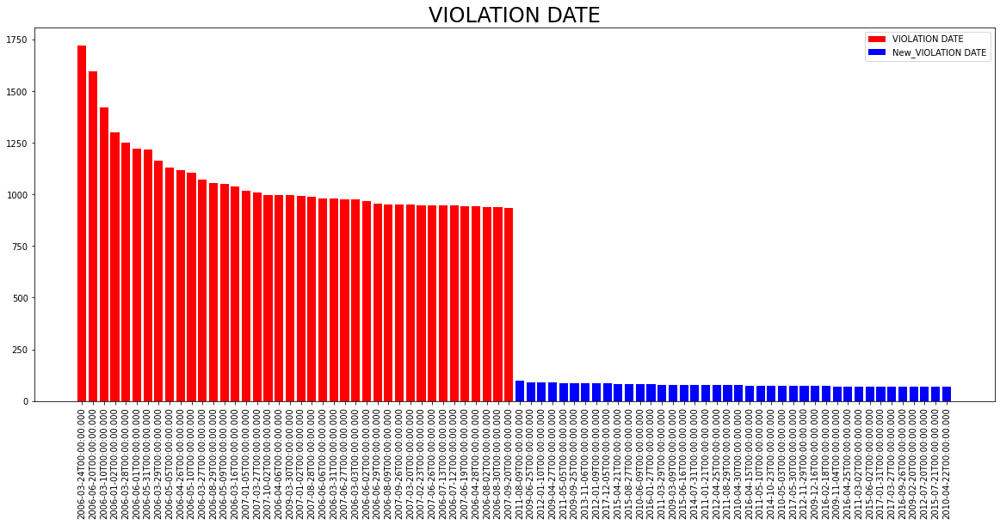

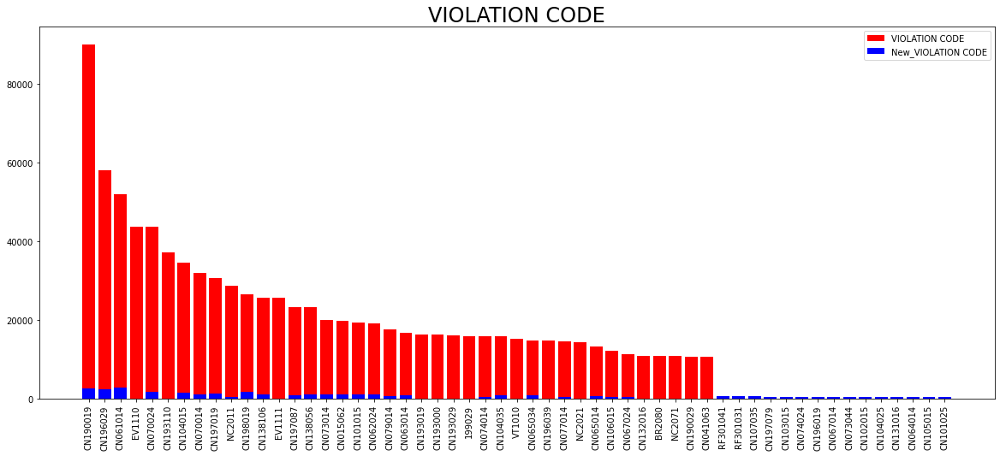

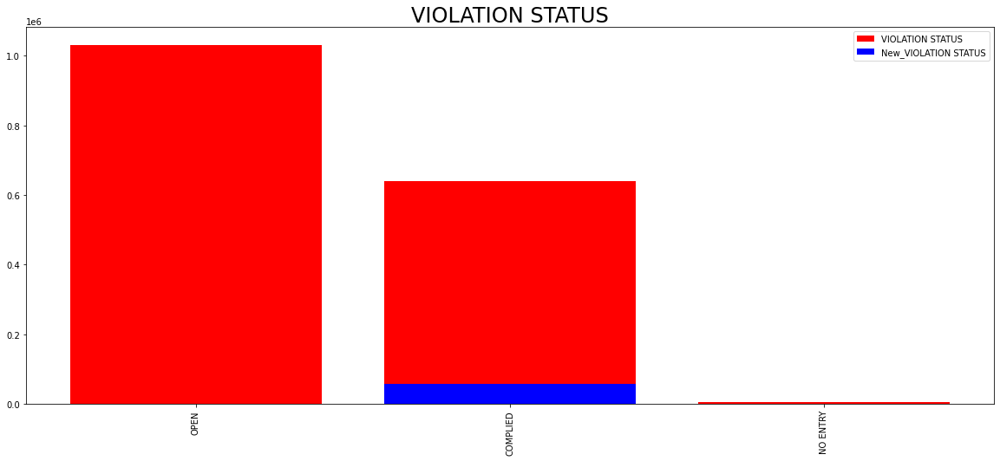

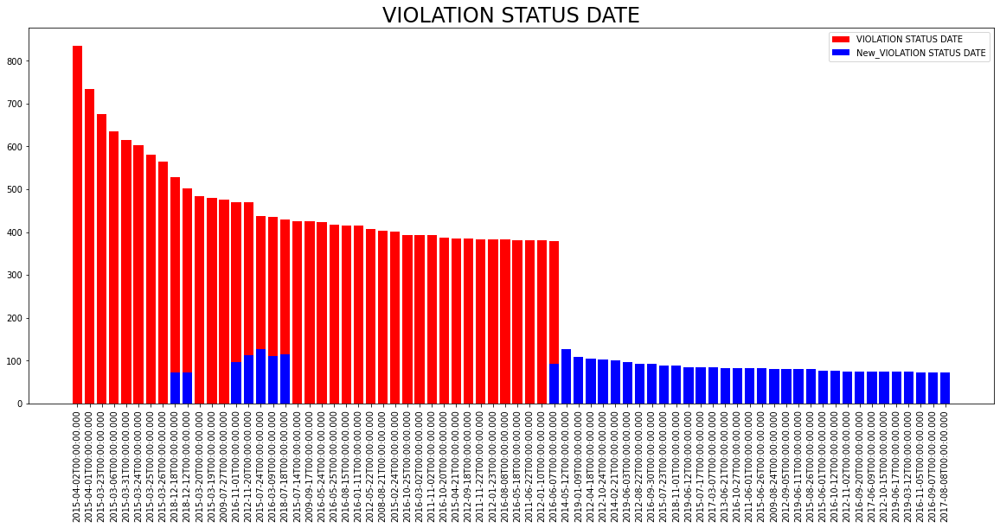

...

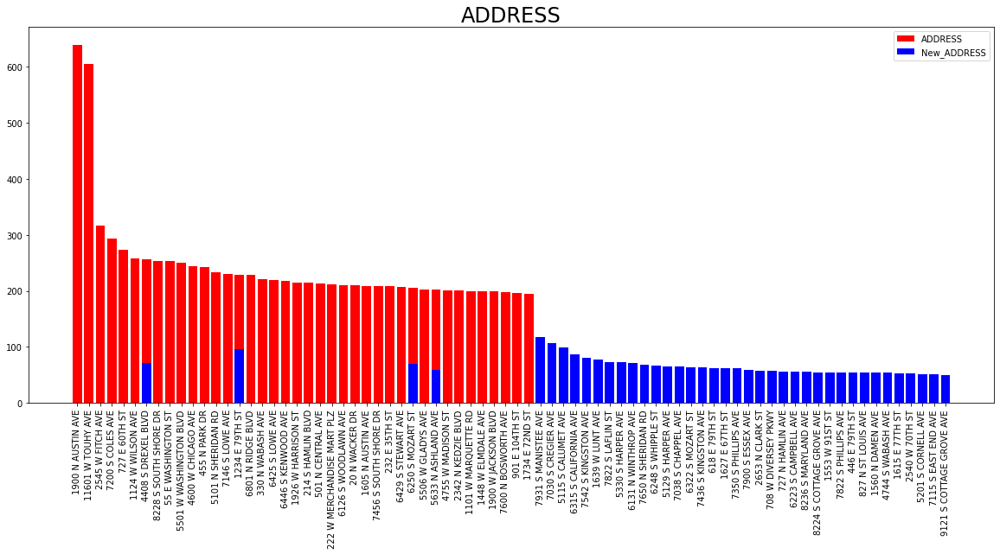

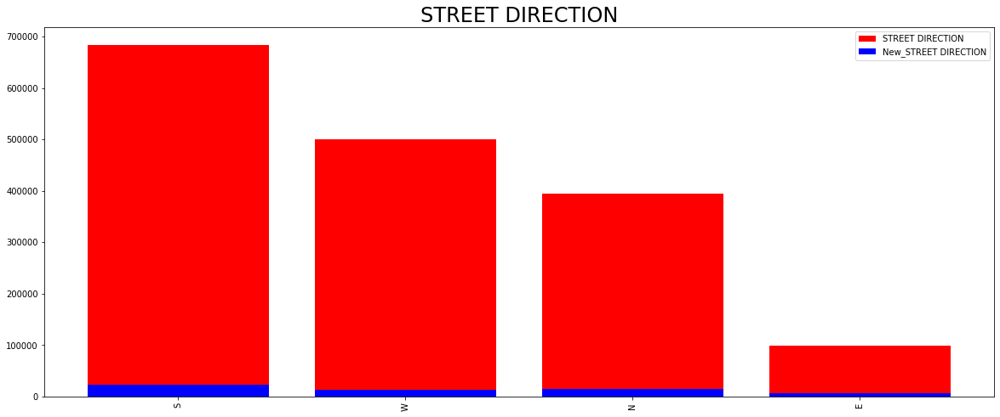

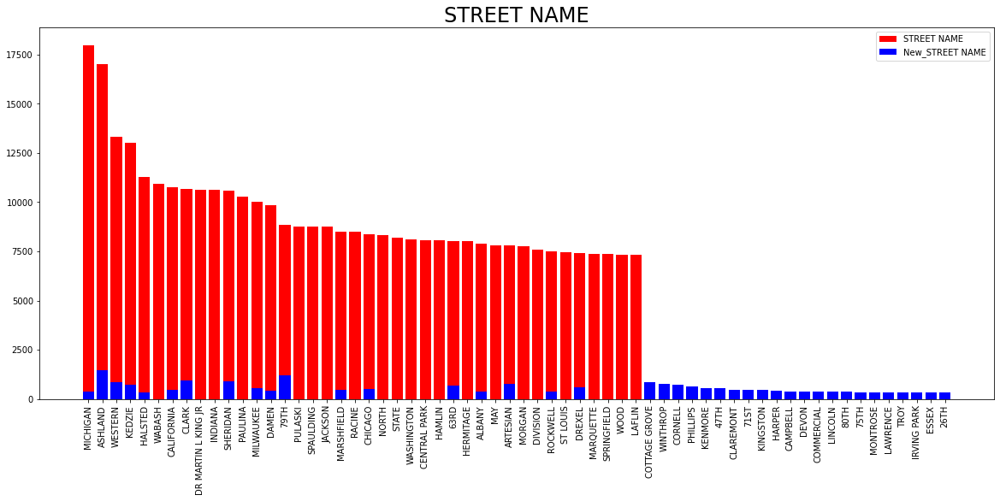

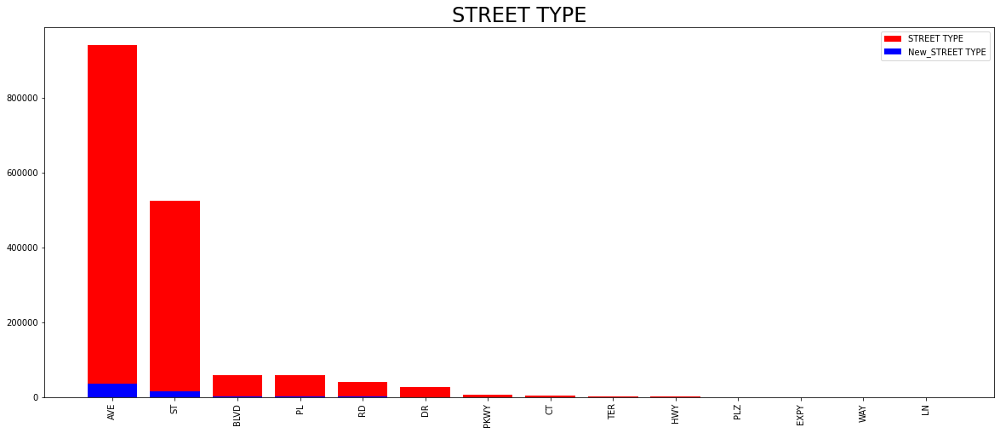

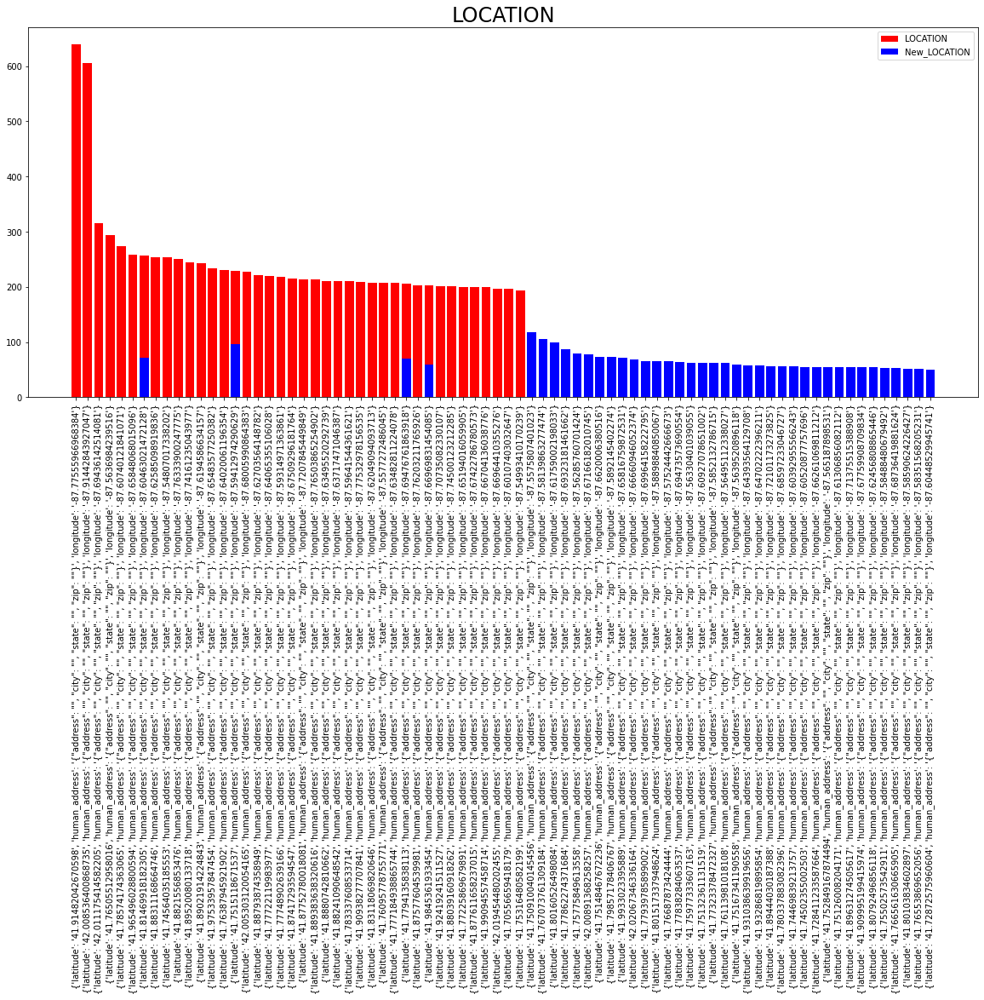

ID:
Min: 219970.0000  Q1(25%): 2838311.7500  Median: 4168119.5000  Q3(75%): 5320395.2500  Max: 6392508.0000
Missing_counts: 0
ID_new:
Min: 972515.0000  Q1: 3715265.0000  Median: 4331178.0000  Q3: 5321485.5000  Max: 6375022.0000

INSPECTION NUMBER:
Min: 265575.0000  Q1(25%): 2304416.0000  Median: 10418746.0000  Q3(75%): 11687280.0000  Max: 13050915.0000
Missing_counts: 0
INSPECTION NUMBER_new:
Min: 1061448.0000  Q1: 9929462.0000  Median: 10707030.0000  Q3: 11716234.0000  Max: 13035353.0000

STREET NUMBER:
Min: 1.0000  Q1(25%): 1648.0000  Median: 3747.0000  Q3(75%): 6228.0000  Max: 13770.0000
Missing_counts: 0
STREET NUMBER_new:
Min: 1.0000  Q1: 1758.0000  Median: 4431.0000  Q3: 7025.0000  Max: 11750.0000

PROPERTY GROUP:
Min: 1000.0000  Q1(25%): 20560.0000  Median: 154323.0000  Q3(75%): 366984.0000  Max: 677975.0000
Missing_counts: 0
PROPERTY GROUP_new:
Min: 1000.0000  Q1: 18144.0000  Median: 26200.0000  Q3: 350611.0000  Max: 674421.0000

SSA:
Min: 1.0000  Q1(25%): 22.0000  Median: 34.0

/var/folders/3n/bnxfvqwj6f31qqcdrm4gdgvw0000gn/T/ipykernel_46479/3079055154.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(14,8))


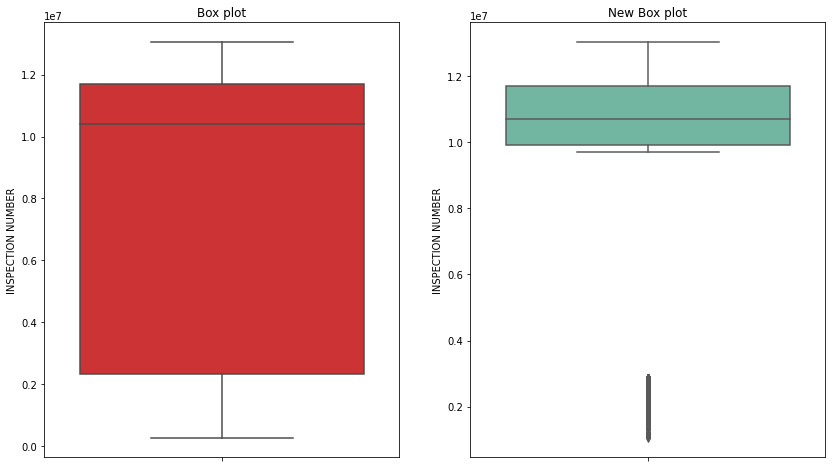

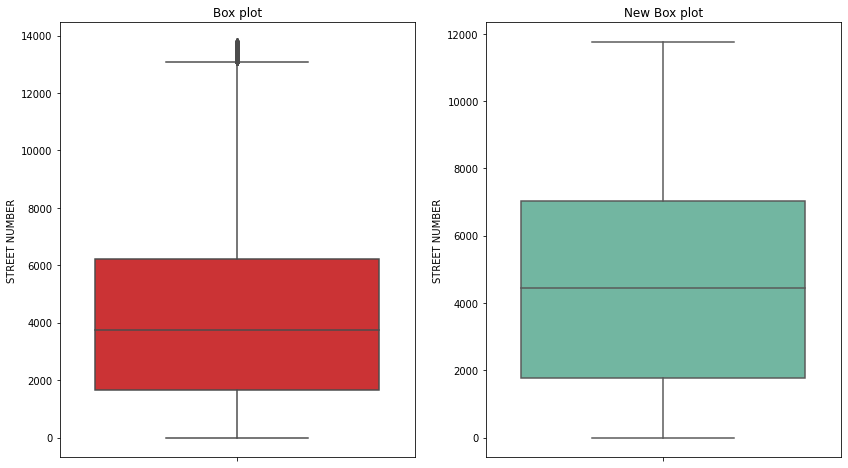

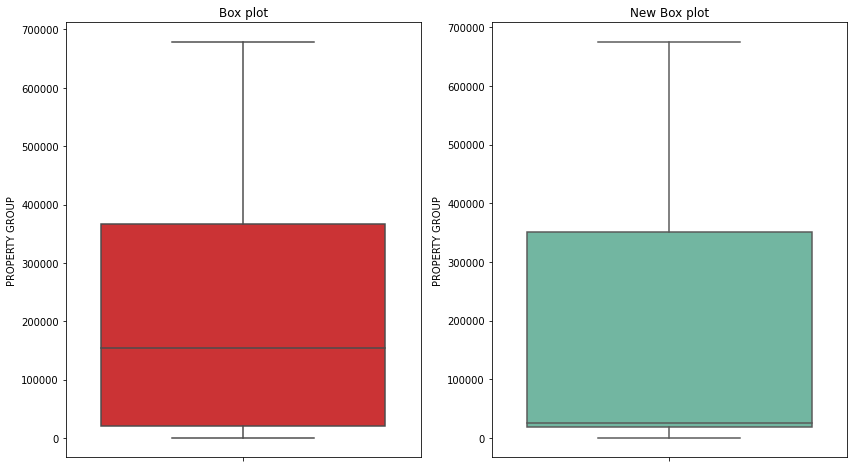

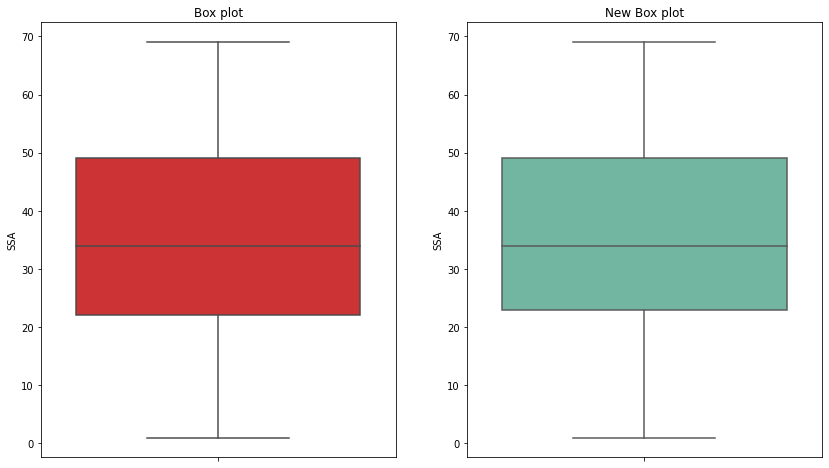

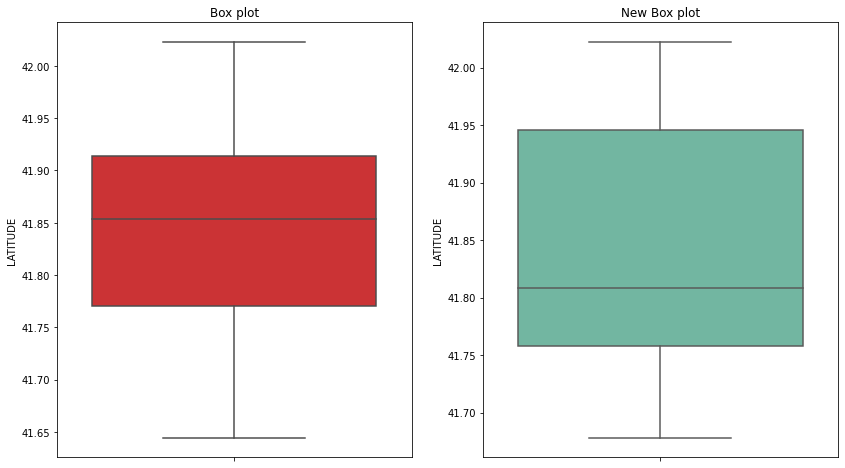

...

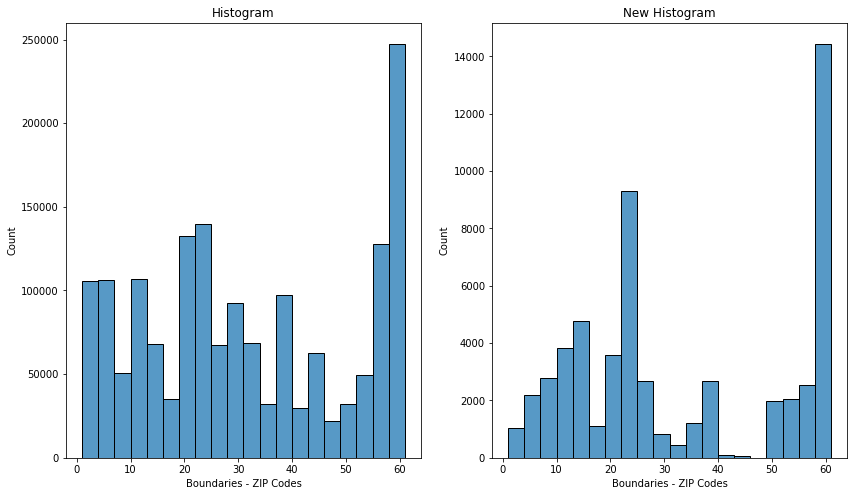

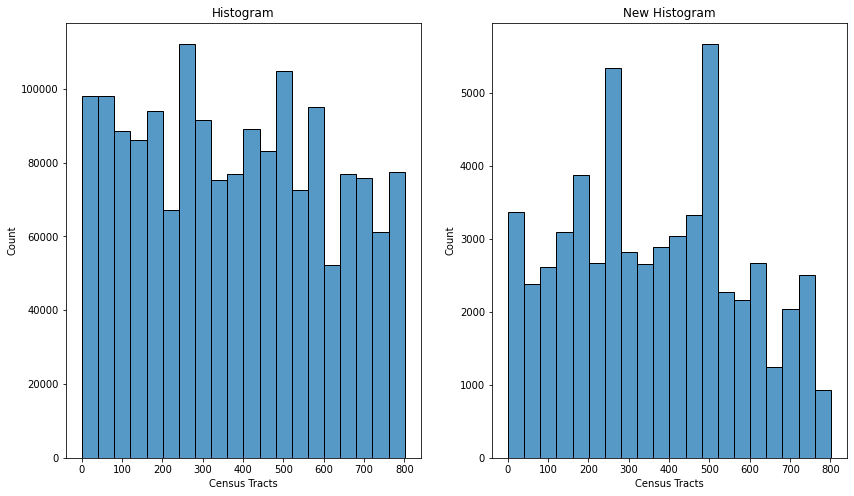

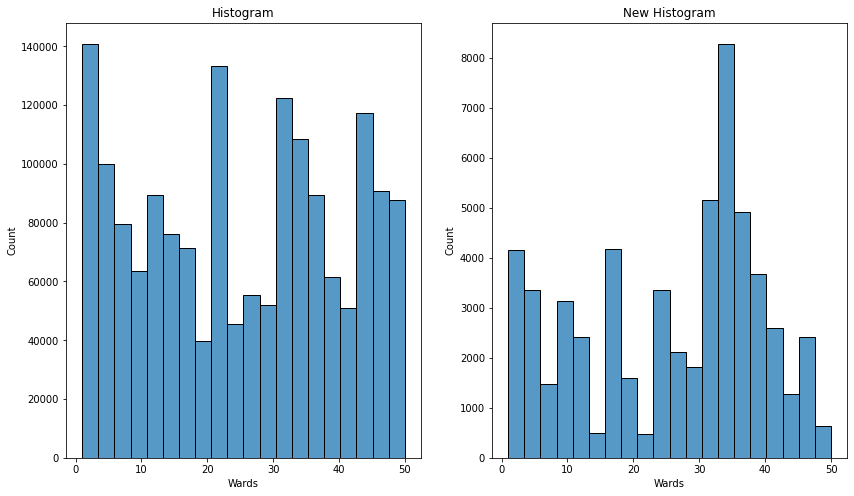

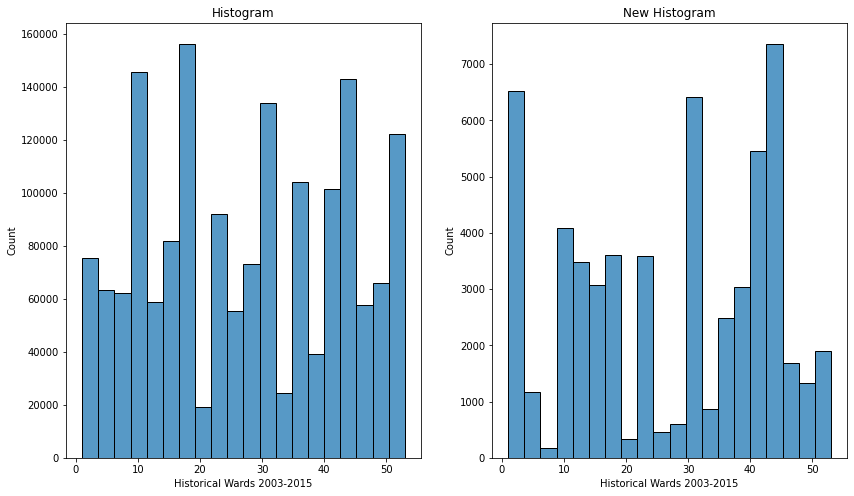

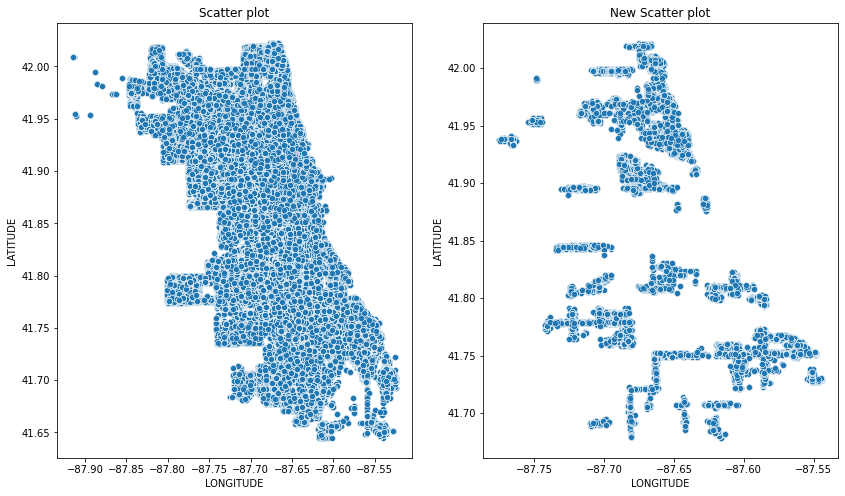

In [20]:
# 将缺失值剔除
df3_new1 = drop_Nan(data_frame3)
nominal_display(df=data_frame3,df_new=df3_new1,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame3,df_new=df3_new1,numerical_attr=numerical_attr)
box_plot(df=data_frame3,label='INSPECTION NUMBER',df_new=df3_new1)
box_plot(df=data_frame3,label='STREET NUMBER',df_new=df3_new1)
box_plot(df=data_frame3,label='PROPERTY GROUP',df_new=df3_new1)
box_plot(df=data_frame3,label='SSA',df_new=df3_new1)
box_plot(df=data_frame3,label='LATITUDE',df_new=df3_new1)
box_plot(df=data_frame3,label='LONGITUDE',df_new=df3_new1)
box_plot(df=data_frame3,label='Community Areas',df_new=df3_new1)
box_plot(df=data_frame3,label='Zip Codes',df_new=df3_new1)
box_plot(df=data_frame3,label='Boundaries - ZIP Codes',df_new=df3_new1)
box_plot(df=data_frame3,label='Census Tracts',df_new=df3_new1)
box_plot(df=data_frame3,label='Wards',df_new=df3_new1)
box_plot(df=data_frame3,label='Historical Wards 2003-2015',df_new=None)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'INSPECTION NUMBER',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'STREET NUMBER',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'PROPERTY GROUP',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'SSA',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'LATITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'LONGITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'Community Areas',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'Zip Codes',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'Boundaries - ZIP Codes',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'Census Tracts',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'Wards',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new1,label = 'Historical Wards 2003-2015',bin_nums=20)
scatter_plot(df=data_frame3,df_new=df3_new1,xlabel='LONGITUDE',ylabel='LATITUDE')

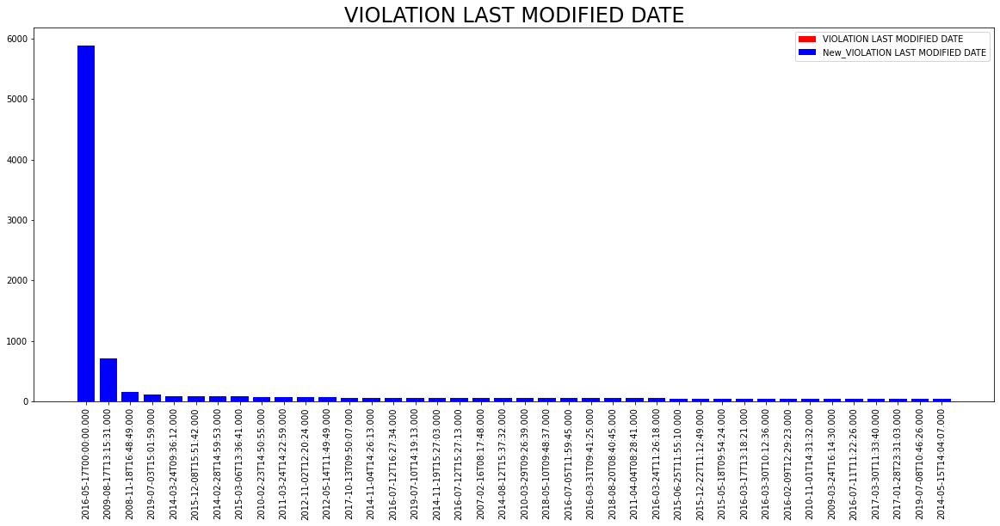

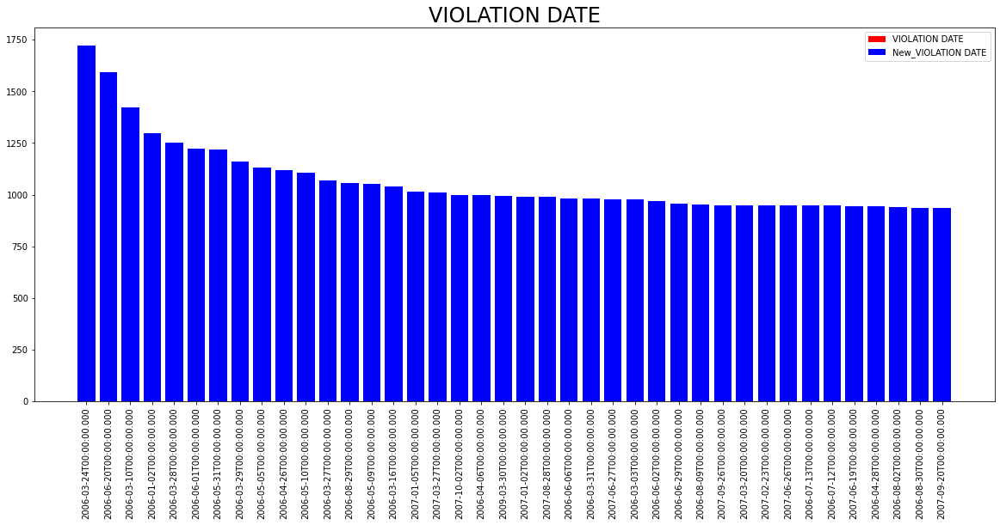

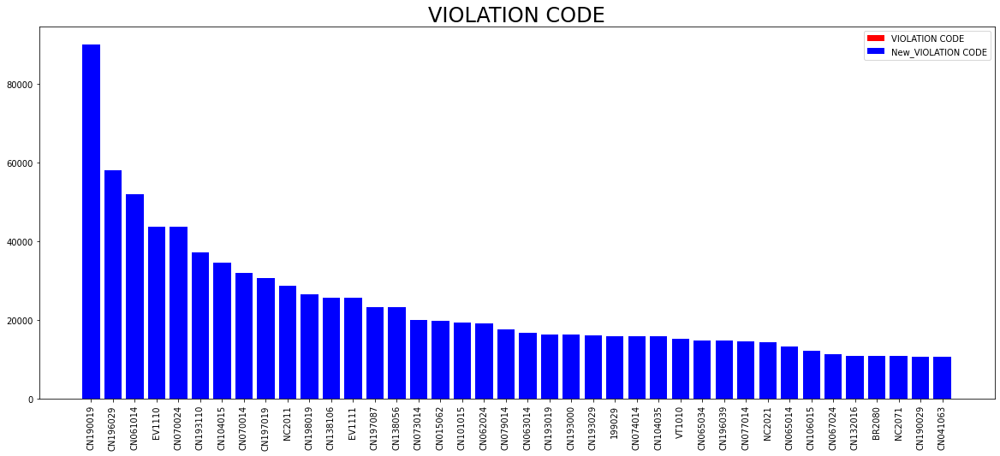

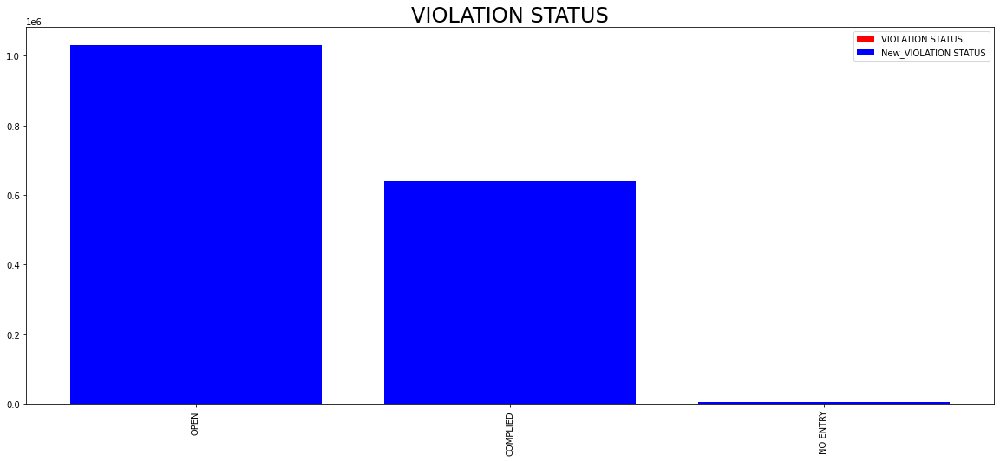

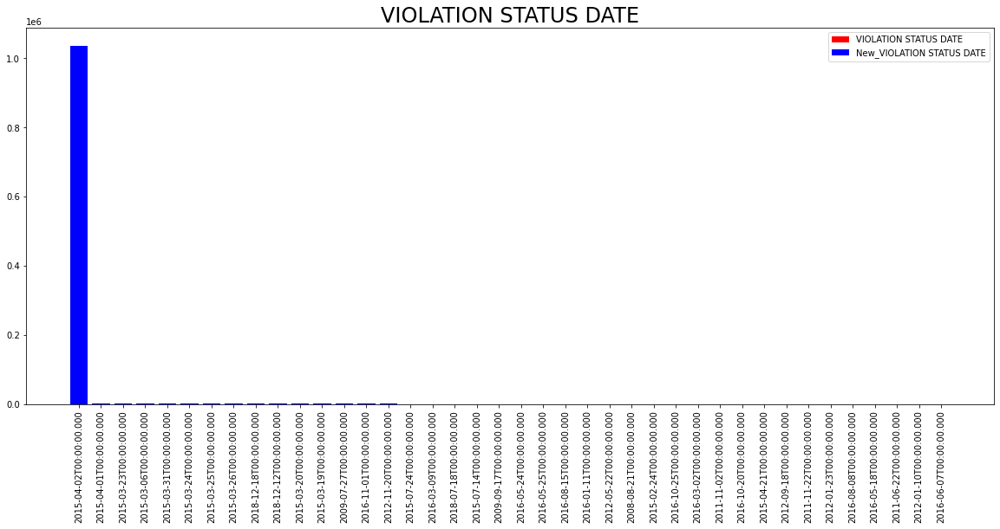

...

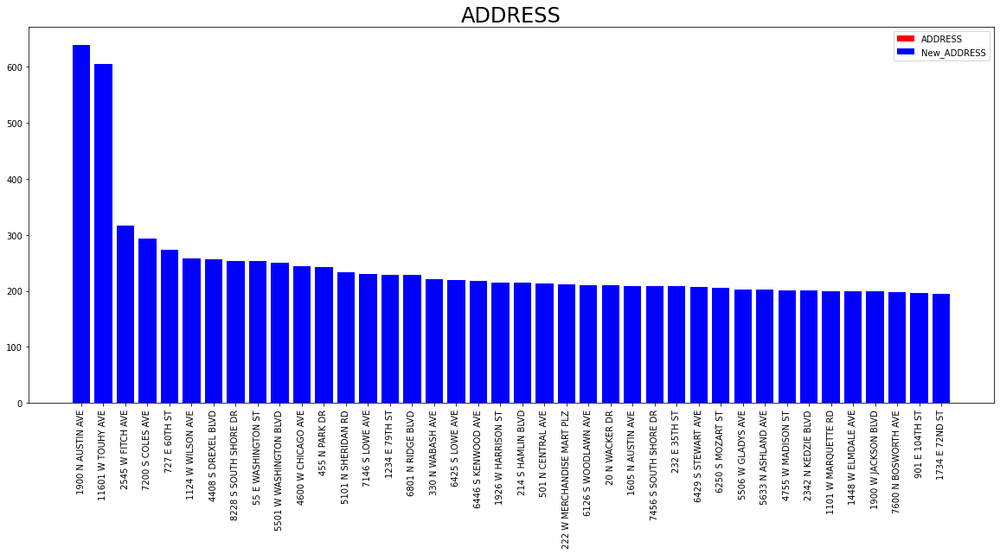

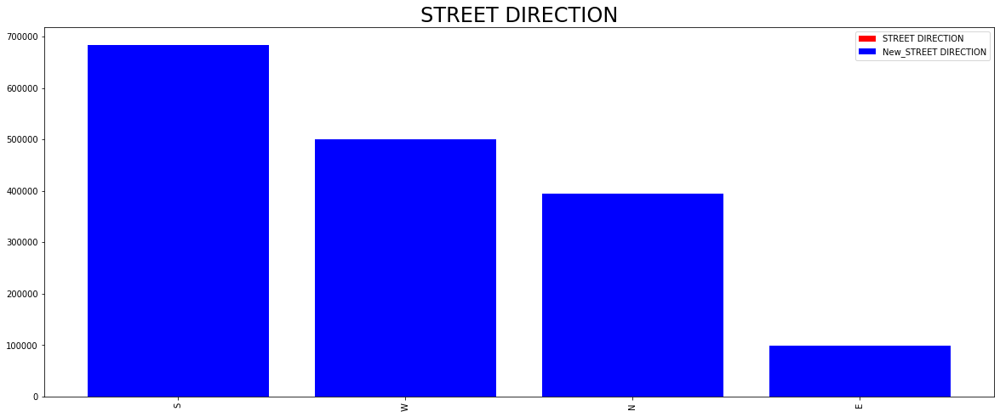

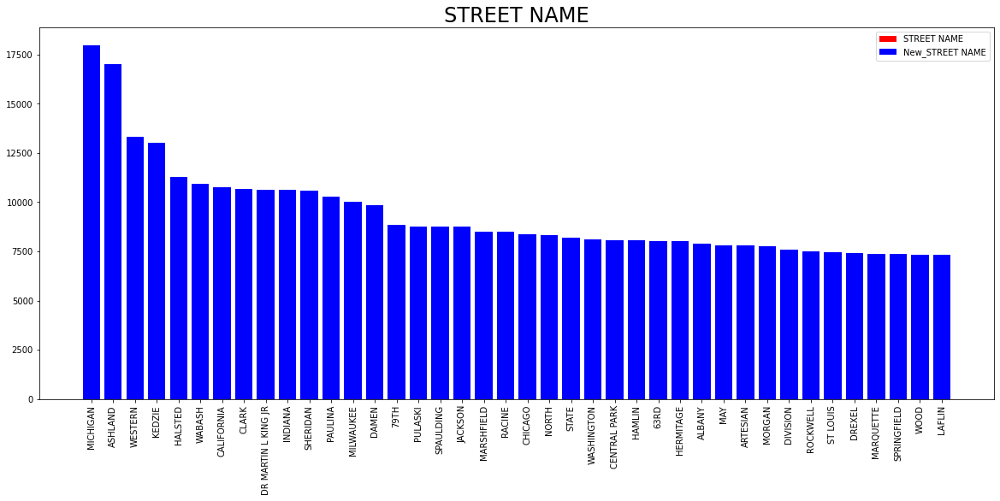

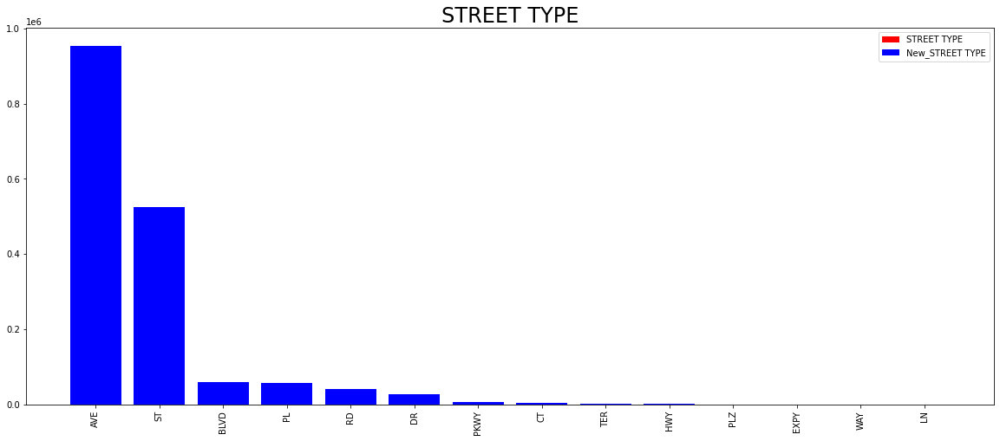

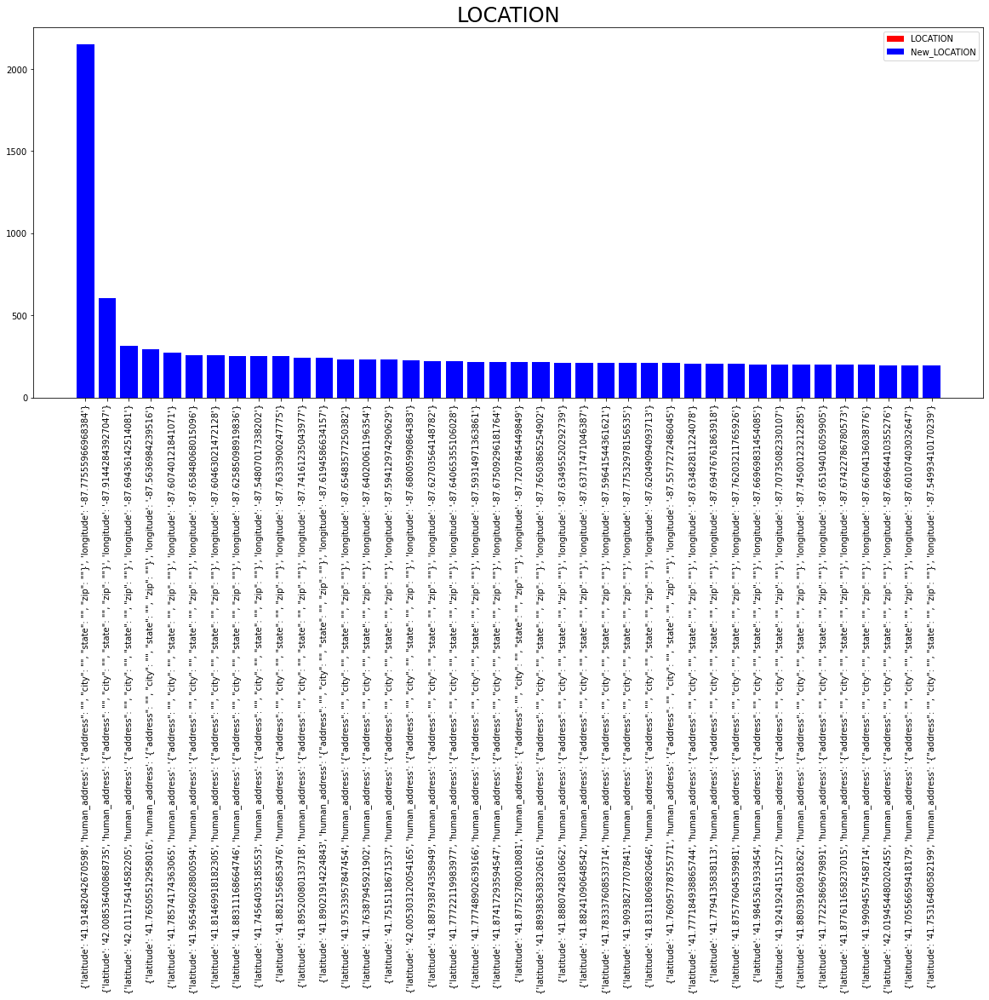

ID:
Min: 219970.0000  Q1(25%): 2838311.7500  Median: 4168119.5000  Q3(75%): 5320395.2500  Max: 6392508.0000
Missing_counts: 0
ID_new:
Min: 219970.0000  Q1: 2838311.7500  Median: 4168119.5000  Q3: 5320395.2500  Max: 6392508.0000

INSPECTION NUMBER:
Min: 265575.0000  Q1(25%): 2304416.0000  Median: 10418746.0000  Q3(75%): 11687280.0000  Max: 13050915.0000
Missing_counts: 0
INSPECTION NUMBER_new:
Min: 265575.0000  Q1: 2304416.0000  Median: 10418746.0000  Q3: 11687280.0000  Max: 13050915.0000

STREET NUMBER:
Min: 1.0000  Q1(25%): 1648.0000  Median: 3747.0000  Q3(75%): 6228.0000  Max: 13770.0000
Missing_counts: 0
STREET NUMBER_new:
Min: 1.0000  Q1: 1648.0000  Median: 3747.0000  Q3: 6228.0000  Max: 13770.0000

PROPERTY GROUP:
Min: 1000.0000  Q1(25%): 20560.0000  Median: 154323.0000  Q3(75%): 366984.0000  Max: 677975.0000
Missing_counts: 0
PROPERTY GROUP_new:
Min: 1000.0000  Q1: 20560.0000  Median: 154323.0000  Q3: 366984.0000  Max: 677975.0000

SSA:
Min: 1.0000  Q1(25%): 22.0000  Median: 34.0

/var/folders/3n/bnxfvqwj6f31qqcdrm4gdgvw0000gn/T/ipykernel_46479/3079055154.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(14,8))


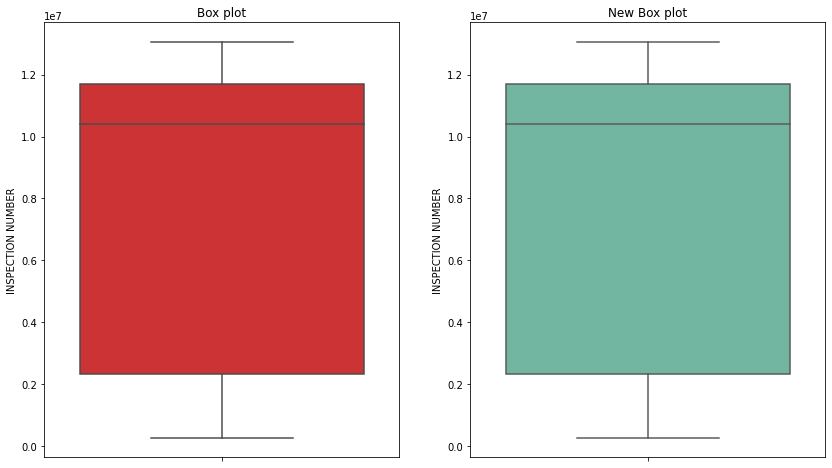

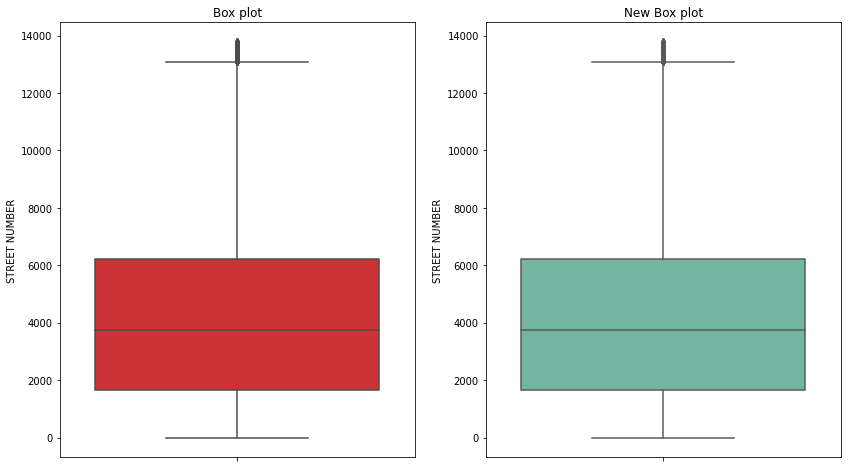

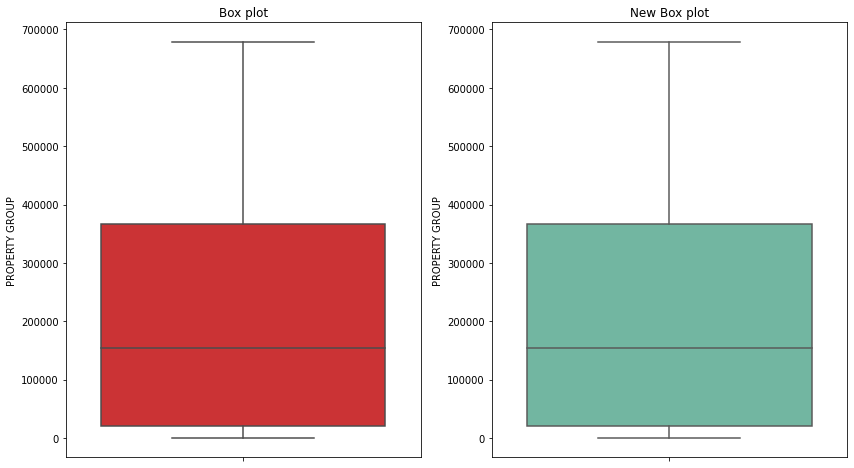

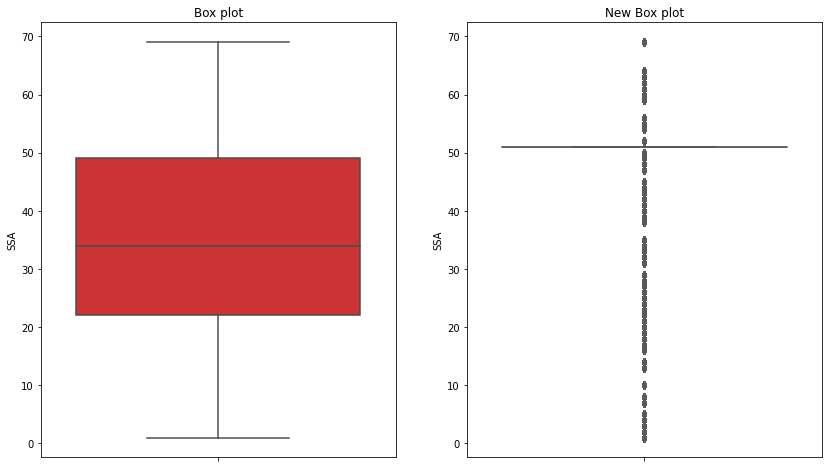

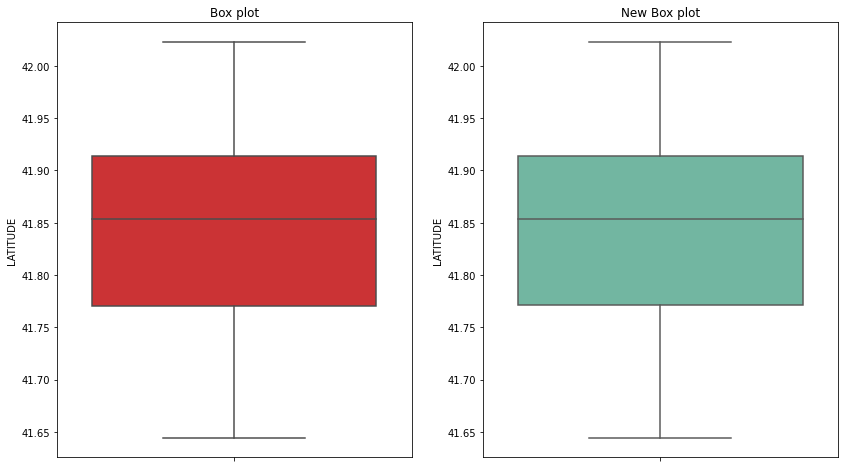

...

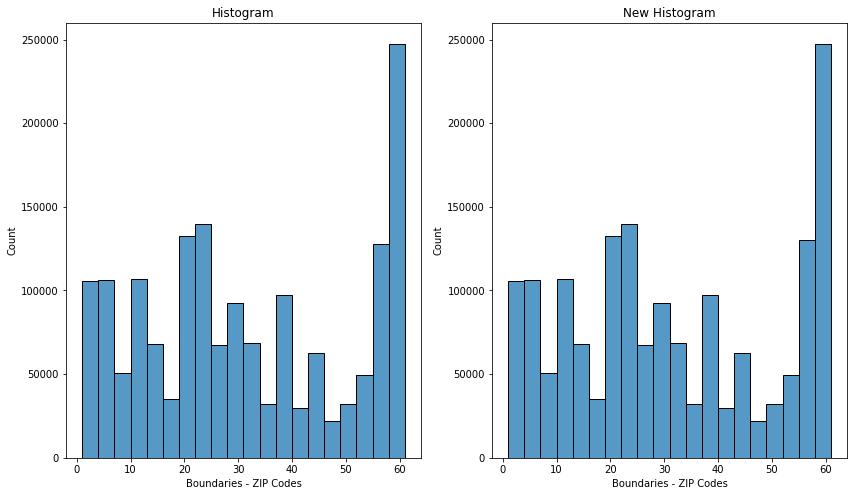

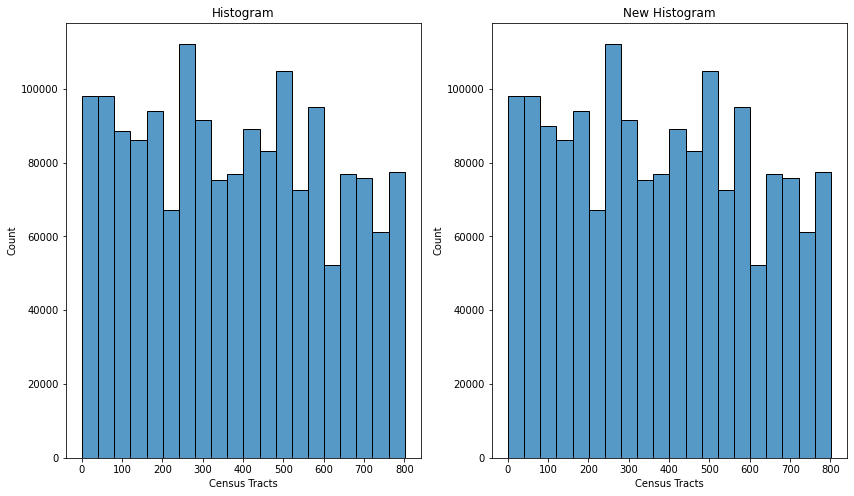

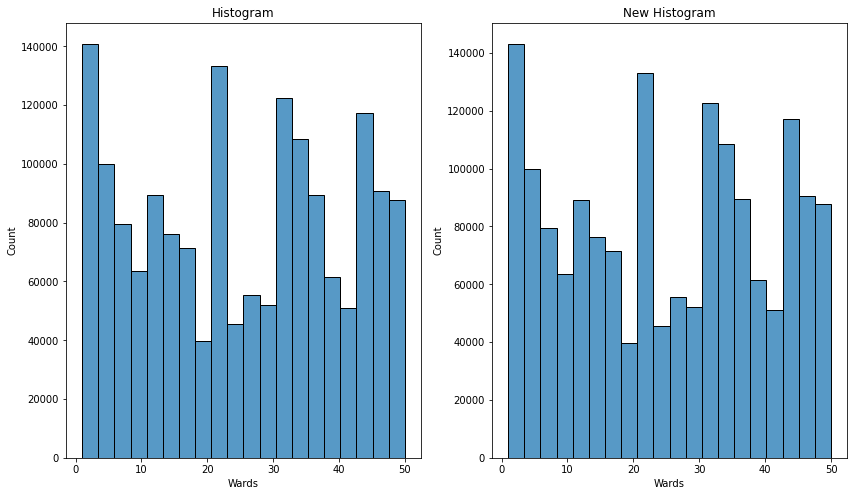

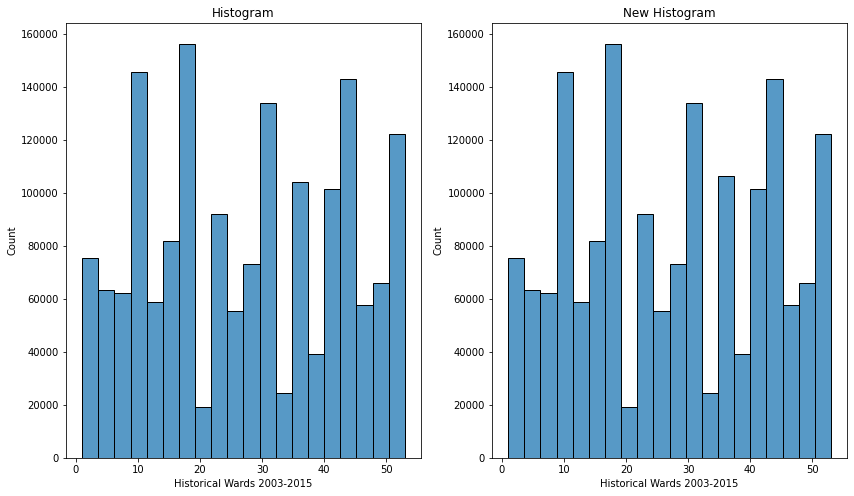

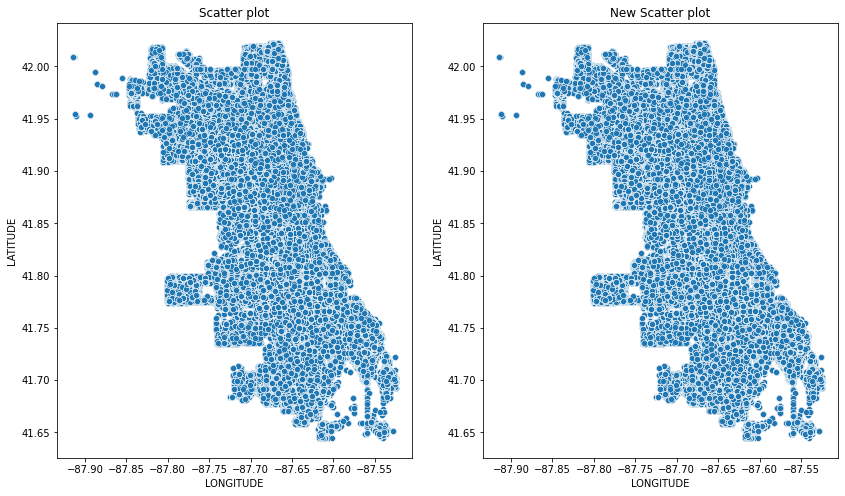

In [21]:
# 用最高频率值来填补缺失值
df3_new2 = fill_mode_for_Nan(data_frame3)
nominal_display(df=data_frame3,df_new=df3_new2,nominal_attr=nominal_attr,nums=40)
numerical_display(df=data_frame3,df_new=df3_new2,numerical_attr=numerical_attr)
box_plot(df=data_frame3,label='INSPECTION NUMBER',df_new=df3_new2)
box_plot(df=data_frame3,label='STREET NUMBER',df_new=df3_new2)
box_plot(df=data_frame3,label='PROPERTY GROUP',df_new=df3_new2)
box_plot(df=data_frame3,label='SSA',df_new=df3_new2)
box_plot(df=data_frame3,label='LATITUDE',df_new=df3_new2)
box_plot(df=data_frame3,label='LONGITUDE',df_new=df3_new2)
box_plot(df=data_frame3,label='Community Areas',df_new=df3_new2)
box_plot(df=data_frame3,label='Zip Codes',df_new=df3_new2)
box_plot(df=data_frame3,label='Boundaries - ZIP Codes',df_new=df3_new2)
box_plot(df=data_frame3,label='Census Tracts',df_new=df3_new2)
box_plot(df=data_frame3,label='Wards',df_new=df3_new2)
box_plot(df=data_frame3,label='Historical Wards 2003-2015',df_new=df3_new2)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'INSPECTION NUMBER',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'STREET NUMBER',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'PROPERTY GROUP',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'SSA',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'LATITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'LONGITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'Community Areas',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'Zip Codes',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'Boundaries - ZIP Codes',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'Census Tracts',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'Wards',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new2,label = 'Historical Wards 2003-2015',bin_nums=20)
scatter_plot(df=data_frame3,df_new=df3_new2,xlabel='LONGITUDE',ylabel='LATITUDE')

PROPERTY GROUP:
Min: 1000.0000  Q1(25%): 20560.0000  Median: 154323.0000  Q3(75%): 366984.0000  Max: 677975.0000
Missing_counts: 0
PROPERTY GROUP_new:
Min: 1000.0000  Q1: 20560.0000  Median: 154323.0000  Q3: 366984.0000  Max: 677975.0000

STREET NUMBER:
Min: 1.0000  Q1(25%): 1648.0000  Median: 3747.0000  Q3(75%): 6228.0000  Max: 13770.0000
Missing_counts: 0
STREET NUMBER_new:
Min: 1.0000  Q1: 1648.0000  Median: 3747.0000  Q3: 6228.0000  Max: 13770.0000

LATITUDE:
Min: 41.6447  Q1(25%): 41.7709  Median: 41.8540  Q3(75%): 41.9135  Max: 42.0227
Missing_counts: 1510
LATITUDE_new:
Min: 41.6447  Q1: 41.7709  Median: 41.8540  Q3: 41.9135  Max: 42.0227

LONGITUDE:
Min: -87.9144  Q1(25%): -87.7139  Median: -87.6699  Q3(75%): -87.6329  Max: -87.5247
Missing_counts: 1510
LONGITUDE_new:
Min: -87.9144  Q1: -87.7139  Median: -87.6698  Q3: -87.6328  Max: -87.5247



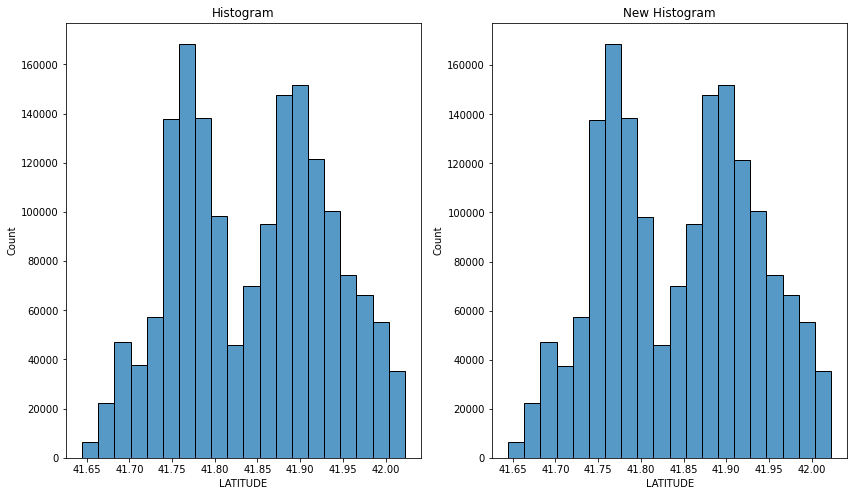

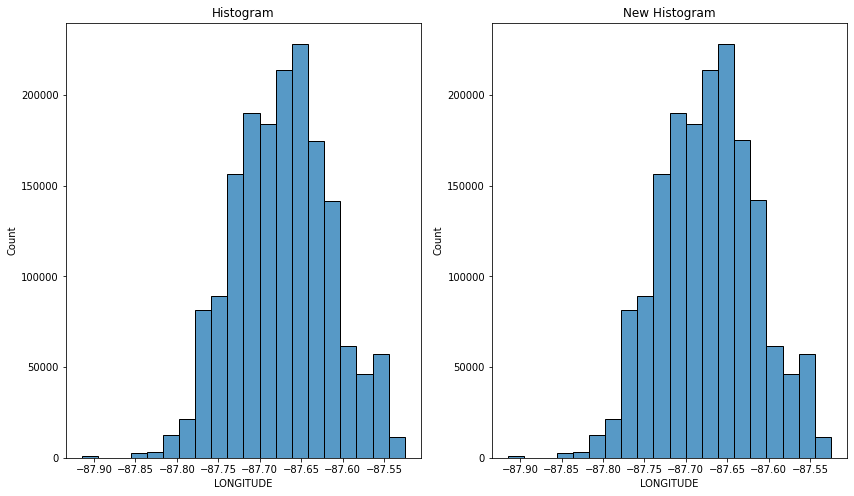

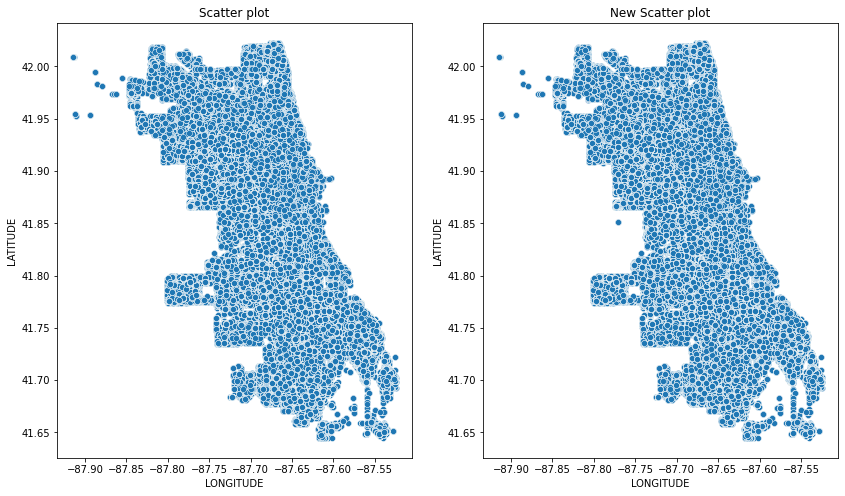

In [23]:
# 通过属性的相关关系来填补缺失值
# 数据过多，仅填补部分缺失值
miss_attr=['LATITUDE','LONGITUDE']
complete_attr=['PROPERTY GROUP','STREET NUMBER']
df3_new3 = fill_attr_corr(data_frame3,miss_attr=miss_attr,complete_attr=complete_attr)
numerical_display(df=data_frame3,df_new=df3_new3,numerical_attr=numerical_attr)
hist_plot(df=data_frame3,df_new=df3_new3,label = 'LATITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new3,label = 'LONGITUDE',bin_nums=20)
scatter_plot(df=data_frame3,df_new=df3_new3,xlabel='LONGITUDE',ylabel='LATITUDE')

PROPERTY GROUP:
Min: 1000.0000  Q1(25%): 20560.0000  Median: 154323.0000  Q3(75%): 366984.0000  Max: 677975.0000
Missing_counts: 0
PROPERTY GROUP_new:
Min: 1000.0000  Q1: 20560.0000  Median: 154323.0000  Q3: 366984.0000  Max: 677975.0000

STREET NUMBER:
Min: 1.0000  Q1(25%): 1648.0000  Median: 3747.0000  Q3(75%): 6228.0000  Max: 13770.0000
Missing_counts: 0
STREET NUMBER_new:
Min: 1.0000  Q1: 1648.0000  Median: 3747.0000  Q3: 6228.0000  Max: 13770.0000

LATITUDE:
Min: 41.6447  Q1(25%): 41.7709  Median: 41.8540  Q3(75%): 41.9135  Max: 42.0227
Missing_counts: 1510
LATITUDE_new:
Min: 41.6447  Q1: 41.7709  Median: 41.8540  Q3: 41.9135  Max: 42.0227

LONGITUDE:
Min: -87.9144  Q1(25%): -87.7139  Median: -87.6699  Q3(75%): -87.6329  Max: -87.5247
Missing_counts: 1510
LONGITUDE_new:
Min: -87.9144  Q1: -87.7139  Median: -87.6698  Q3: -87.6328  Max: -87.5247



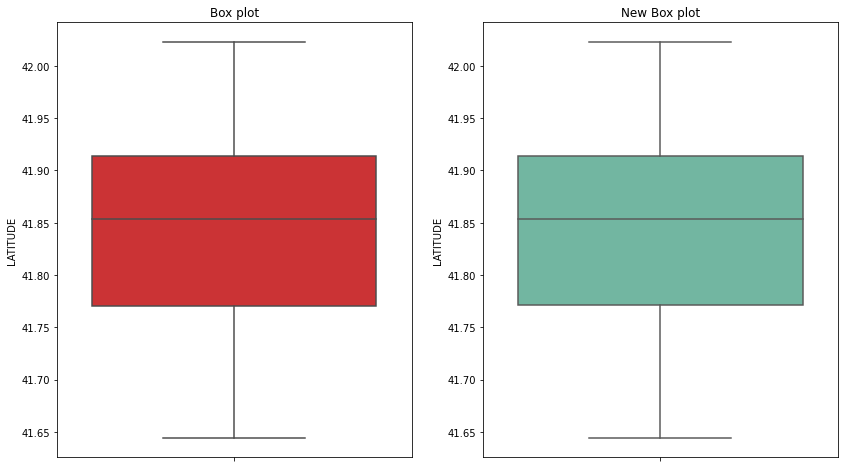

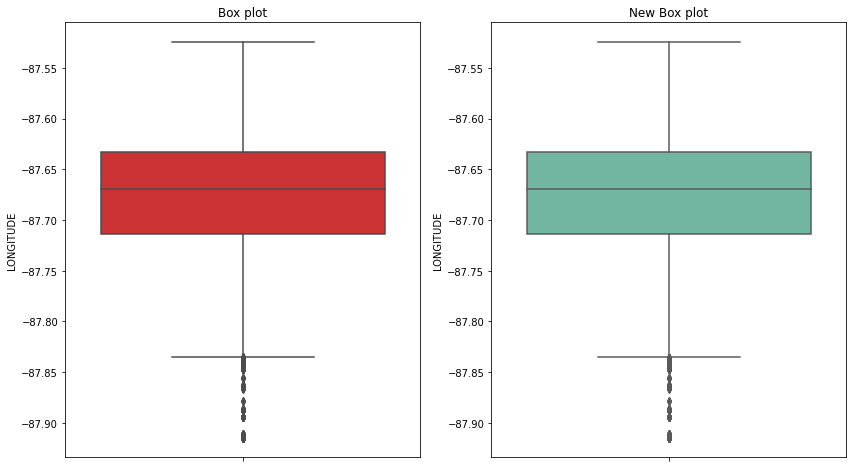

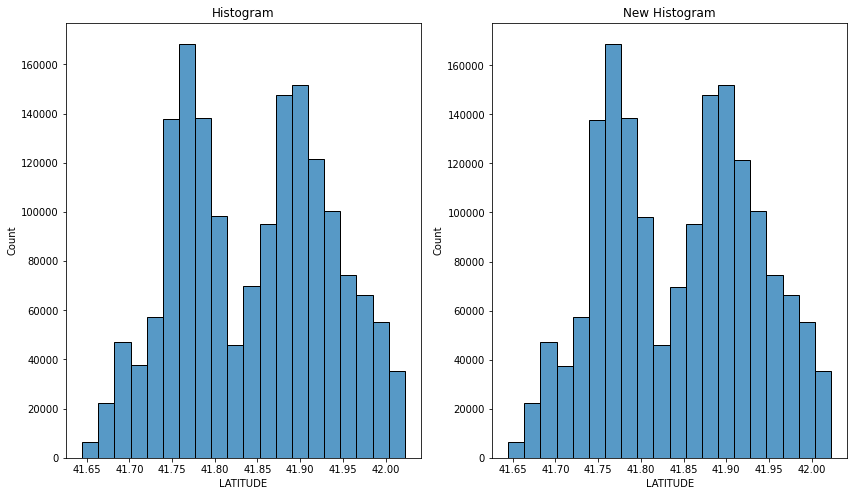

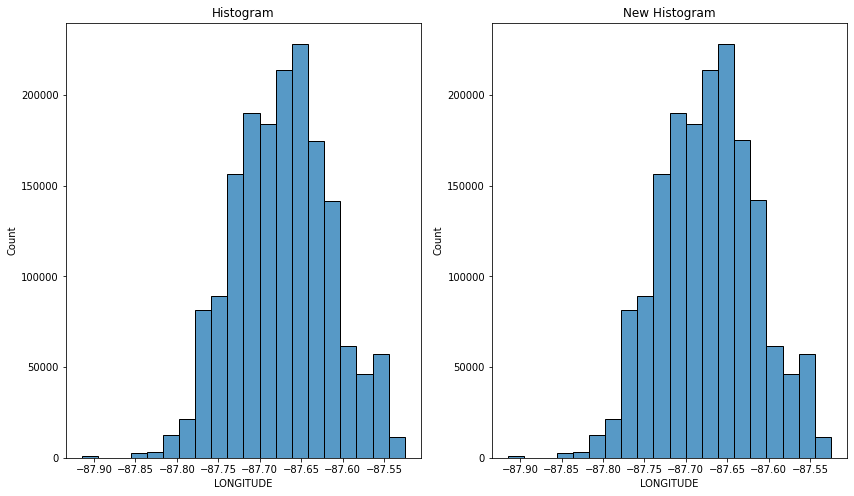

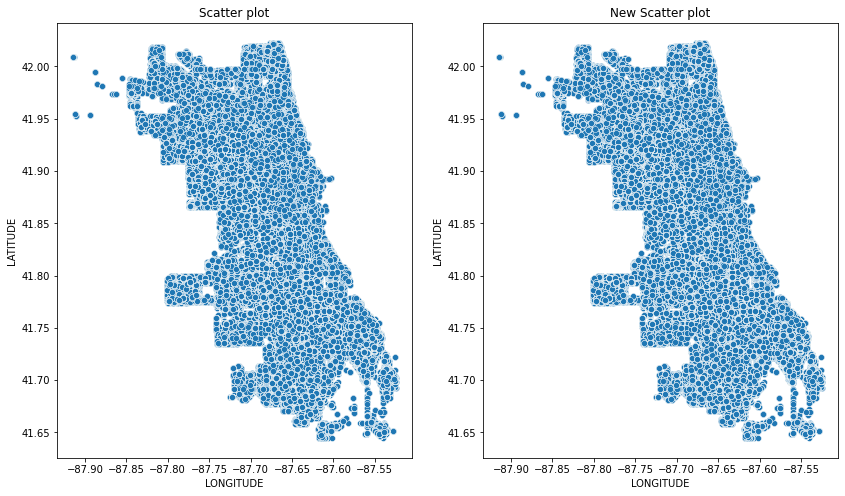

In [22]:
# 通过数据对象之间的相似性来填补缺失值
# 数据太多，训练时间过长，仅选择其中几个属性
numerical_attr = ['PROPERTY GROUP','STREET NUMBER','LATITUDE','LONGITUDE']
df3_new4 = correlation_fill(data_frame3,numerical_attr=numerical_attr,n_neighbors=30)
numerical_display(df=data_frame3,df_new=df3_new4,numerical_attr=numerical_attr)
box_plot(df=data_frame3,label='LATITUDE',df_new=df3_new4)
box_plot(df=data_frame3,label='LONGITUDE',df_new=df3_new4)
hist_plot(df=data_frame3,df_new=df3_new4,label = 'LATITUDE',bin_nums=20)
hist_plot(df=data_frame3,df_new=df3_new4,label = 'LONGITUDE',bin_nums=20)
scatter_plot(df=data_frame3,df_new=df3_new4,xlabel='LONGITUDE',ylabel='LATITUDE')